# Исследование: Прогноз активности покупателей интернет-магазина

Интернет-магазин «В один клик» продаёт разные товары: для детей, для дома, мелкую бытовую технику, косметику и даже продукты. Отчёт магазина за прошлый период показал, что активность покупателей начала снижаться. Привлекать новых клиентов уже не так эффективно: о магазине и так знает большая часть целевой аудитории. Возможный выход — удерживать активность постоянных клиентов. Сделать это можно с помощью персонализированных предложений.

<u>Цель исследования:</u> Разработать решение для персонализации предложений постоянным клиентам интернет-магазина "В один клик" с целью увеличения их покупательской активности.

Для достижения цели необходимо решить <u>две задачи</u>:

1. Разработать модель, которая предскажет вероятность снижения покупательской активности.
2. Выделите сегмент покупателей, проанализировать его и предложить, как увеличить его покупательскую активность на основе данных моделирования, данных о прибыли покупателей и исходных данные (если понадобятся). По желанию можно проанализировать больше одного сегмента.

**Описание данных для анализа**


Данные для анализа представлены в виде 4 CSV-файлов:


**1. Файл [`market_file.csv`](https://code.s3.yandex.net/datasets/market_file.csv)** содержит данные о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.

- `id` — номер покупателя в корпоративной базе данных.
- `Покупательская активность` — рассчитанный класс покупательской активности (целевой признак): «снизилась» или «прежний уровень».
- `Тип сервиса` — уровень сервиса, например «премиум» и «стандарт».
- `Разрешить сообщать` — информация о том, можно ли присылать покупателю дополнительные предложения о товаре. Согласие на это даёт покупатель.
- `Маркет_актив_6_мес` — среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента.
- `Маркет_актив_тек_мес` — количество маркетинговых коммуникаций в текущем месяце.
- `Длительность` — значение, которое показывает, сколько дней прошло с момента регистрации покупателя на сайте.
- `Акционные_покупки` — среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев.
- `Популярная_категория` — самая популярная категория товаров у покупателя за последние 6 месяцев.
- `Средний_просмотр_категорий_за_визит` — показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца.
- `Неоплаченные_продукты_штук_квартал` — общее число неоплаченных товаров в корзине за последние 3 месяца.
- `Ошибка_сервиса` — число сбоев, которые коснулись покупателя во время посещения сайта.
- `Страниц_за_визит` — среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.

**2. Файл [`market_money.csv`](https://code.s3.yandex.net/datasets/market_money.csv)** содержит данные о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.

- `id` — номер покупателя в корпоративной базе данных.
- `Период` — название периода, во время которого зафиксирована выручка. Например,

`'текущий_месяц'` или `'предыдущий_месяц'`.

- `Выручка` — сумма выручки за период.

**3. Файл [`market_time.csv`](https://code.s3.yandex.net/datasets/market_time.csv)** содержит данные о времени (в минутах), которое покупатель провёл на сайте в течение периода.

- `id` — номер покупателя в корпоративной базе данных.
- `Период` — название периода, во время которого зафиксировано общее время.
- `минут` — значение времени, проведённого на сайте, в минутах.

**4. Файл [`money.csv`](https://code.s3.yandex.net/datasets/money.csv)** содержит данные о среднемесячной прибыли покупателя за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.

- `id` — номер покупателя в корпоративной базе данных.
- `Прибыль` — значение прибыли.


Признаки, представленные в таблицах выше, могут быть сгруппированы следующим образом:
- Признаки, которые описывают коммуникацию сотрудников компании с клиентом.
- Признаки, которые описывают продуктовое поведение покупателя. Например, какие товары покупает и как часто.
- Признаки, которые описывают покупательское поведение клиента. Например, сколько тратил в магазине.
- Признаки, которые описывают поведение покупателя на сайте. Например, как много страниц просматривает и сколько времени проводит на сайте.

![image.png](attachment:image.png)

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузка-данных" data-toc-modified-id="Загрузка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Загрузка данных</a></span><ul class="toc-item"><li><span><a href="#Настройка-рабочей-среды" data-toc-modified-id="Настройка-рабочей-среды-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Настройка рабочей среды</a></span></li><li><span><a href="#Объявление-констант" data-toc-modified-id="Объявление-констант-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Объявление констант</a></span></li><li><span><a href="#Объявление-функций" data-toc-modified-id="Объявление-функций-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Объявление функций</a></span></li><li><span><a href="#Загрузка-данных" data-toc-modified-id="Загрузка-данных-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Загрузка данных</a></span></li></ul></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Названия-колонок" data-toc-modified-id="Названия-колонок-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Названия колонок</a></span></li><li><span><a href="#Обработка-текстовых-данных" data-toc-modified-id="Обработка-текстовых-данных-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Обработка текстовых данных</a></span></li><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Приведение-типов-данных" data-toc-modified-id="Приведение-типов-данных-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Приведение типов данных</a></span></li><li><span><a href="#Обработка-дубликатов" data-toc-modified-id="Обработка-дубликатов-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Обработка дубликатов</a></span><ul class="toc-item"><li><span><a href="#Полные-дубликаты" data-toc-modified-id="Полные-дубликаты-2.5.1"><span class="toc-item-num">2.5.1&nbsp;&nbsp;</span>Полные дубликаты</a></span></li><li><span><a href="#Неполные-дубликаты" data-toc-modified-id="Неполные-дубликаты-2.5.2"><span class="toc-item-num">2.5.2&nbsp;&nbsp;</span>Неполные дубликаты</a></span></li></ul></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ-данных" data-toc-modified-id="Исследовательский-анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Исследовательский анализ данных</a></span><ul class="toc-item"><li><span><a href="#Объединение-таблиц" data-toc-modified-id="Объединение-таблиц-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Объединение таблиц</a></span></li><li><span><a href="#Распределение-данных-и-выбросы" data-toc-modified-id="Распределение-данных-и-выбросы-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Распределение данных и выбросы</a></span><ul class="toc-item"><li><span><a href="#Количественные-признаки" data-toc-modified-id="Количественные-признаки-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>Количественные признаки</a></span></li><li><span><a href="#Категориальные-признаки" data-toc-modified-id="Категориальные-признаки-3.2.2"><span class="toc-item-num">3.2.2&nbsp;&nbsp;</span>Категориальные признаки</a></span></li></ul></li><li><span><a href="#Активность-клиентов" data-toc-modified-id="Активность-клиентов-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Активность клиентов</a></span></li><li><span><a href="#Снижение-активности-пользователей" data-toc-modified-id="Снижение-активности-пользователей-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Снижение активности пользователей</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Корреляционный-анализ" data-toc-modified-id="Корреляционный-анализ-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Корреляционный анализ</a></span><ul class="toc-item"><li><span><a href="#Выводы" data-toc-modified-id="Выводы-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Обучение-моделей" data-toc-modified-id="Обучение-моделей-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Обучение моделей</a></span><ul class="toc-item"><li><span><a href="#Описание-признаков-и-выбор-метрики" data-toc-modified-id="Описание-признаков-и-выбор-метрики-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Описание признаков и выбор метрики</a></span></li><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Создание-пайплайнов" data-toc-modified-id="Создание-пайплайнов-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Создание пайплайнов</a></span></li><li><span><a href="#Поиск-лучшей-модели" data-toc-modified-id="Поиск-лучшей-модели-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Поиск лучшей модели</a></span><ul class="toc-item"><li><span><a href="#Базовая-модель-логистической-регрессии" data-toc-modified-id="Базовая-модель-логистической-регрессии-5.4.1"><span class="toc-item-num">5.4.1&nbsp;&nbsp;</span>Базовая модель логистической регрессии</a></span></li><li><span><a href="#Подбор-модели-и-гиперпараметров" data-toc-modified-id="Подбор-модели-и-гиперпараметров-5.4.2"><span class="toc-item-num">5.4.2&nbsp;&nbsp;</span>Подбор модели и гиперпараметров</a></span><ul class="toc-item"><li><span><a href="#RandomizedSearchCV" data-toc-modified-id="RandomizedSearchCV-5.4.2.1"><span class="toc-item-num">5.4.2.1&nbsp;&nbsp;</span>RandomizedSearchCV</a></span></li><li><span><a href="#OptunaSearchCV" data-toc-modified-id="OptunaSearchCV-5.4.2.2"><span class="toc-item-num">5.4.2.2&nbsp;&nbsp;</span>OptunaSearchCV</a></span></li></ul></li><li><span><a href="#Полиномизация-и-сэмплирование-признаков" data-toc-modified-id="Полиномизация-и-сэмплирование-признаков-5.4.3"><span class="toc-item-num">5.4.3&nbsp;&nbsp;</span>Полиномизация и сэмплирование признаков</a></span></li></ul></li><li><span><a href="#Селектор-признаков" data-toc-modified-id="Селектор-признаков-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Селектор признаков</a></span></li><li><span><a href="#Dummy-модели" data-toc-modified-id="Dummy-модели-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>Dummy-модели</a></span></li><li><span><a href="#Лучшая-модель" data-toc-modified-id="Лучшая-модель-5.7"><span class="toc-item-num">5.7&nbsp;&nbsp;</span>Лучшая модель</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-5.8"><span class="toc-item-num">5.8&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Анализ-важности-признаков-лучшей-модели" data-toc-modified-id="Анализ-важности-признаков-лучшей-модели-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Анализ важности признаков лучшей модели</a></span><ul class="toc-item"><li><span><a href="#SHAP" data-toc-modified-id="SHAP-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>SHAP</a></span></li><li><span><a href="#Permutation-importance" data-toc-modified-id="Permutation-importance-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Permutation importance</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li><li><span><a href="#Сегментация-покупателей" data-toc-modified-id="Сегментация-покупателей-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Сегментация покупателей</a></span><ul class="toc-item"><li><span><a href="#Сегменты-покупателей" data-toc-modified-id="Сегменты-покупателей-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Сегменты покупателей</a></span><ul class="toc-item"><li><span><a href="#Сегментация-1:-Группа-клиентов-с-максимальной-долей-покупок-по-акции-и-высокой-вероятностью-снижения-покупательской-активности." data-toc-modified-id="Сегментация-1:-Группа-клиентов-с-максимальной-долей-покупок-по-акции-и-высокой-вероятностью-снижения-покупательской-активности.-7.1.1"><span class="toc-item-num">7.1.1&nbsp;&nbsp;</span>Сегментация 1: Группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.</a></span></li><li><span><a href="#Сегментация-2:-Группа-клиентов,-которые-покупают-только-технику,-то-есть-товары-с-длинным-жизненным-циклом." data-toc-modified-id="Сегментация-2:-Группа-клиентов,-которые-покупают-только-технику,-то-есть-товары-с-длинным-жизненным-циклом.-7.1.2"><span class="toc-item-num">7.1.2&nbsp;&nbsp;</span>Сегментация 2: Группа клиентов, которые покупают только технику, то есть товары с длинным жизненным циклом.</a></span></li><li><span><a href="#Сегментация-3:-Группа-клиентов,-которые-покупают-товары-из-категории-«Товары-для-себя»-(новая-категория,-которую-можно-выделить-на-основе-текущих)-или-«Товары-для-детей»." data-toc-modified-id="Сегментация-3:-Группа-клиентов,-которые-покупают-товары-из-категории-«Товары-для-себя»-(новая-категория,-которую-можно-выделить-на-основе-текущих)-или-«Товары-для-детей».-7.1.3"><span class="toc-item-num">7.1.3&nbsp;&nbsp;</span>Сегментация 3: Группа клиентов, которые покупают товары из категории «Товары для себя» (новая категория, которую можно выделить на основе текущих) или «Товары для детей».</a></span></li><li><span><a href="#Сегментация-4:-Группа-клиентов-с-высокой-вероятностью-снижения-покупательской-активности-и-наиболее-высокой-прибыльностью." data-toc-modified-id="Сегментация-4:-Группа-клиентов-с-высокой-вероятностью-снижения-покупательской-активности-и-наиболее-высокой-прибыльностью.-7.1.4"><span class="toc-item-num">7.1.4&nbsp;&nbsp;</span>Сегментация 4: Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью.</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-7.1.5"><span class="toc-item-num">7.1.5&nbsp;&nbsp;</span>Выводы</a></span></li></ul></li></ul></li><li><span><a href="#Заключение-и-общие-рекомендации" data-toc-modified-id="Заключение-и-общие-рекомендации-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Заключение и общие рекомендации</a></span></li></ul></div>

## Загрузка данных

### Настройка рабочей среды

In [ ]:
!pip install optuna -q
!pip install optuna-integration -q
!pip install phik -q

In [ ]:
# Импорты стандартных библиотек Python
import time
import warnings
import logging

# Импорт библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#from joblib import Parallel, delayed

from sklearn.cluster import KMeans#, MiniBatchKMeans
#from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    LabelEncoder,
    StandardScaler,
    MinMaxScaler,
    PolynomialFeatures,
    #RobustScaler
)
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    roc_auc_score,
    RocCurveDisplay,
    roc_curve,
    auc,
    ConfusionMatrixDisplay,
    accuracy_score,
    precision_score,
    recall_score,
    confusion_matrix
)
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif


from imblearn.over_sampling import SMOTE#, RandomOverSampler,  ADASYN
#from imblearn.under_sampling import RandomUnderSampler
#from imblearn.combine import SMOTETomek
from imblearn.pipeline import Pipeline as ImbPipeline

from optuna.integration import OptunaSearchCV
from optuna import distributions
from optuna.exceptions import ExperimentalWarning

from phik import phik_matrix
from phik.report import plot_correlation_matrix

import shap

from sklearn.dummy import DummyClassifier

#import plotly.express as px

# Игнорирование предупреждений
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=ExperimentalWarning)

# Скрыть логи библиотеки Optuna
logging.getLogger("optuna").setLevel(logging.WARNING)

### Объявление констант

In [ ]:
# Объявляем константы
RANDOM_STATE = 42

# Разбивка датасета на train, test, valid в пропорции 3:1:1 (60%:20%:20%)
TEST_VALID_SIZE = 0.4  # Соотношение для тестового и валидационого набора
VALID_SIZE = 0.5  # Соотношение для валидационного набора от тестового

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Вынес константы и функции в начало работы. Функции выносил не все, а только то, что используются несколько раз. Функции по сегментации и некоторые другие, не выносил, чтобы было удобней.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



👍




### Объявление функций

In [ ]:
# Создаем функцию для вывода общей информации о датасете
def df_info(data):
    """
    Эта функция выводит общую информацию о переданном датасете, включая:
    1. Первые 5 строк для предварительного просмотра.
    2. Общую информацию о типах данных и количестве ненулевых значений.
    3. Статистику по колонкам, включая описательные статистики.
    4. Долю пропусков в каждом столбце.
    5. Количество полных дубликатов в датасете.

    Параметры:
    data : pd.DataFrame
        Датасет, для которого нужно вывести информацию.
    """

    # 1. Выводим первые 5 строк датасета для предварительного просмотра
    print(f'1. Первые 5 строк датасета:')
    display(data.head())

    # 2. Выводим общую информацию о датасете
    print('\n2. Общая информация о датасете:')
    print(data.info())

    # 3. Выводим статистику по колонкам
    print('\n3. Статистика по колонкам:')
    display(data.describe(include='all'))

    # 4. Вычисляем и отображаем долю пропусков в колонках
    print('\n4. Доля пропусков в колонках:')
    missing_data = pd.DataFrame(round(data.isna().mean() * 100, 4).sort_values())
    display(missing_data.style.background_gradient('coolwarm'))

    # 5. Подсчитываем и выводим количество полных дубликатов
    print('\n5. Количество полных дубликатов:', data.duplicated().sum())

In [ ]:
# Функция для приведения названий колонок к стилю snake_case
def process_column_names(df):
    """
    Эта функция преобразует названия колонок в формате snake_case.
    Она выполняет следующие операции:
    1. Приводит названия колонок к нижнему регистру.
    2. Заменяет пробелы на символ подчеркивания (_).

    Параметры:
    df : pd.DataFrame
        Датасет, в котором нужно изменить названия колонок.

    Возвращает:
    None. Изменяет названия колонок в переданном DataFrame на месте.
    """

    # Приводим названия колонок к нижнему регистру и заменяем пробелы на подчеркивания
    df.columns = df.columns.str.lower().str.replace(' ', '_')

In [ ]:
# Функция для обработки нечисловых данных в DataFrame
def process_non_numeric_columns(df):
    """
    Эта функция обрабатывает нечисловые данные в переданном DataFrame.
    Конкретно, она выполняет следующие операции:
    1. Приводит все строки в нечисловых столбцах к нижнему регистру.
    2. Удаляет лишние пробелы в начале и конце строк.

    Параметры:
    df : pd.DataFrame
        Датасет, в котором нужно обработать нечисловые данные.

    Возвращает:
    None. Изменяет нечисловые данные в переданном DataFrame на месте.
    """

    # 1. Определяем все нечисловые колонки (типа object)
    non_numeric_columns = df.select_dtypes(include=['object']).columns

    # 2. Применяем обработку к каждому нечисловому столбцу
    df[non_numeric_columns] = df[non_numeric_columns].apply(lambda x: x.str.lower().str.strip() if x.dtype == 'object' else x)

In [ ]:
# Функция для вывода уникальных категорий в каждом нечисловом столбце DataFrame
def unique_categories_per_column(df):
    """
    Эта функция находит и выводит уникальные категории для каждого нечислового столбца
    в переданном DataFrame. Она выполняет следующие операции:
    1. Определяет все нечисловые колонки (типа object).
    2. Для каждой нечисловой колонки находит уникальные значения и выводит их.

    Параметры:
    df : pd.DataFrame
        Датасет, в котором нужно найти уникальные категории для нечисловых колонок.

    Возвращает:
    None. Функция выводит уникальные категории, но не возвращает значения.
    """

    # 1. Определяем все нечисловые колонки (типа object)
    non_numeric_columns = df.select_dtypes(include=['object']).columns

    # 2. Итерация по каждому нечисловому столбцу
    for column in non_numeric_columns:
        # 3. Получаем уникальные категории для текущего столбца
        unique_categories = df[column].unique()

        # 4. Выводим уникальные категории для текущего столбца
        print(f"Уникальные категории для колонки '{column}': {unique_categories}")

    # 5. Добавляем пустую строку для разделения выводов
    print('\n')

In [ ]:
# Функция для перемещения колонок в DataFrame
def move_columns(df, columns, place_after_col):
    """
    Эта функция перемещает указанные колонки в DataFrame, размещая их после заданной колонки.

    Параметры:
    df : pd.DataFrame
        DataFrame, в котором нужно переместить колонки.
    columns : list
        Список названий колонок, которые необходимо переместить.
    place_after_col : str
        Название колонки, после которой будут размещены перемещаемые колонки.

    Возвращает:
    pd.DataFrame
        Обновленный DataFrame с перемещенными колонками.

    Исключения:
    KeyError
        Если одна или несколько колонок не найдены в DataFrame.
    """

    # 1. Проверяем, существует ли колонка, после которой нужно разместить перемещаемые колонки
    if place_after_col not in df.columns or not all(col in df.columns for col in columns):
        raise KeyError("Один или несколько указанных столбцов отсутствуют в DataFrame.")

    # 2. Получаем индекс колонки, после которой будут размещены перемещаемые колонки
    loc = df.columns.get_loc(place_after_col)

    # 3. Извлекаем колонки, которые нужно переместить, и удаляем их из DataFrame
    columns_to_move = [df.pop(col) for col in columns]

    # 4. Вставляем перемещенные колонки в нужное место
    for i, col in enumerate(columns):
        df.insert(loc + i + 1, col, columns_to_move[i])  # +1 для размещения после указанной колонки

    # 5. Возвращаем обновленный DataFrame
    return df

In [ ]:
def plot_box_hist_chart(data, plot_type='both', x_label='Значение признака', y_label='Частота', title=None, hue=None, palette=None, bins='auto'):
    """
    Функция для отображения диаграмм размаха и гистограмм для числовых столбцов в DataFrame.

    Параметры:
    - data: DataFrame или Series, данные для визуализации
    - plot_type: str, определяет тип графиков: 'boxplot', 'histplot' или 'both' (по умолчанию 'both')
    - x_label: str, подпись оси X (по умолчанию 'Значение признака')
    - y_label: str, подпись оси Y (по умолчанию 'Частота')
    - title: str, заголовок графика (по умолчанию None)
    - hue: str, имя столбца для цветового кодирования гистограммы (по умолчанию None)
    - palette: str, цветовая палитра для графиков (по умолчанию None)
    - bins: int, количество столбцов в гистограмме (по умолчанию 'auto')

    Возвращает:
    - Выводит диаграммы размаха и гистограмм на основе переданных данных.

    Пример использования:
    plot_box_hist_chart(data=market_money.drop('id', axis=1), hue=None)
    """

    # Проверка, являются ли данные объектом Series, и приведение к DataFrame при необходимости
    if isinstance(data, pd.Series):
        data = pd.DataFrame(data)

    # Выбор числовых столбцов из данных
    numerical_cols = data.select_dtypes(include=['number']).columns
    num_plots = len(numerical_cols)

    # Создание подходящего количества подграфиков в зависимости от числа числовых столбцов
    if num_plots == 1:
        fig, axes = plt.subplots(1, 2, figsize=(12, 3))
        axes = [axes]
    else:
        fig, axes = plt.subplots(num_plots, 2, figsize=(12, 3 * num_plots))

    # Построение графиков для каждого числового столбца
    for i, col in enumerate(numerical_cols):
        # Диаграмма размаха
        if plot_type == 'boxplot' or plot_type == 'both':
            sns.boxplot(x=data[col], ax=axes[i][0], palette=palette)
            axes[i][0].set_xlabel(x_label)
            axes[i][0].set_title(f'Диаграмма размаха по колонке: {col}')

        # Гистограмма
        if plot_type == 'histplot' or plot_type == 'both':
            if hue is not None:
                sns.histplot(x=data[col], bins=bins, palette=palette, kde=True, ax=axes[i][1], hue=data[hue])
            else:
                sns.histplot(x=data[col], bins=bins, palette=palette, kde=True, ax=axes[i][1])
            axes[i][1].set_xlabel(x_label)
            axes[i][1].set_ylabel(y_label)
            axes[i][1].set_title(f'Распределение значений в колонке: {col}')

    # Улучшение компоновки графиков и вывод
    plt.tight_layout()
    plt.show()

In [ ]:
# Функция для вывода графиков распределения (bar и pie) по категориальным признакам
def plot_bar_pie_chart(data, x_label=None, y_label=None, title=None, palette=None, value_counts=True):
    """
    Эта функция строит столбчатые и круговые диаграммы для категориальных признаков
    в переданном DataFrame. Она поддерживает следующие параметры:

    Параметры:
    data : pd.DataFrame
        Данные для визуализации.
    x_label : str, optional
        Подпись для оси X столбчатой диаграммы.
    y_label : str, optional
        Подпись для оси Y столбчатой диаграммы.
    title : str, optional
        Заголовок графика (не используется в данной реализации).
    palette : str, optional
        Цветовая палитра для графиков.
    value_counts : bool
        Если True, строит графики на основе количества значений в столбце.

    Возвращает:
    None. Функция выводит графики на экран.
    """

    # 1. Получение списка категориальных столбцов из данных
    categorical_cols = data.select_dtypes(include=['object']).columns
    num_plots = len(categorical_cols)

    # 2. Создание субграфиков для столбцов, в зависимости от количества категориальных столбцов
    if num_plots == 1:
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))
    else:
        fig, axes = plt.subplots(nrows=num_plots, ncols=2, figsize=(14, 6 * num_plots))

    # 3. Перебор по категориальным столбцам для построения графиков
    for i, col in enumerate(categorical_cols):
        # 4. Получение количества значений в столбце
        counts = data[col].value_counts().sort_values() if value_counts else data[col]

        # 5. Определение осей для столбчатой и круговой диаграмм
        if num_plots == 1:
            bar_ax = axes[0]
            pie_ax = axes[1]
        else:
            bar_ax = axes[i, 0]
            pie_ax = axes[i, 1]

        # 6. Построение столбчатой диаграммы
        sns.barplot(x=counts.index, y=counts.values, palette=palette, ax=bar_ax)
        bar_ax.set_xlabel(x_label)
        bar_ax.set_ylabel(y_label)
        bar_ax.set_title(f'Распределение признака: {col}')
        bar_ax.set_xticklabels(bar_ax.get_xticklabels(), rotation=45, horizontalalignment='right')

        # 7. Если установлено, строим круговую диаграмму
        pie_ax.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90,
                   colors=sns.color_palette(palette), wedgeprops={'edgecolor': 'black'})
        pie_ax.axis('equal')  # Установить равные оси для круговой диаграммы
        pie_ax.set_title(f'Доля каждого признака: {col}')

    # 8. Настройка расстояния между графиками и компактное размещение
    plt.subplots_adjust(wspace=0.5)
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_roc_curve(y_valid, y_valid_proba):
    """
    Отрисовка ROC-кривой и вычисление AUC.

    Параметры:
    y_valid : array-like
        Массив истинных меток классов (0 или 1).
    y_valid_proba : array-like
        Массив вероятностей положительного класса (значения от 0 до 1).

    Возвращает:
    None. Функция выводит ROC-кривую на экран.
    """

    # 1. Вычисление значений FPR (False Positive Rate) и TPR (True Positive Rate)
    fpr, tpr, thresholds = roc_curve(y_valid, y_valid_proba)

    # 2. Вычисление площади под ROC-кривой (AUC)
    roc_auc = auc(fpr, tpr)

    # 3. Настройка графика
    plt.figure(figsize=(8, 6))  # Установка размера графика
    plt.plot(fpr, tpr, color='blue', label=f'ROC-кривая (AUC = {roc_auc:.4f})')  # Построение ROC-кривой
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Линия случайного выбора (базовая линия)

    # 4. Настройка осей и заголовка
    plt.xlim([0.0, 1.0])  # Ограничение оси X
    plt.ylim([0.0, 1.05])  # Ограничение оси Y
    plt.xlabel('FPR')  # Подпись оси X
    plt.ylabel('TPR')  # Подпись оси Y
    plt.title('ROC-кривая')  # Заголовок графика
    plt.legend(loc='lower right')  # Легенда графика
    plt.grid()  # Включение сетки на графике

    # 5. Отображение графика
    plt.show()

In [ ]:
def plot_confusion_matrix(pipe_final, X_valid, y_valid):
    """
    Отрисовка матрицы ошибок (confusion matrix) для оценки качества классификации.

    Параметры:
    pipe_final : sklearn.pipeline.Pipeline
        Обученная модель (пайплайн), которая будет использоваться для предсказания.
    X_valid : array-like, shape (n_samples, n_features)
        Данные для валидации модели (функции).
    y_valid : array-like, shape (n_samples,)
        Истинные метки классов для валидационных данных.

    Возвращает:
    None. Функция выводит матрицу ошибок на экран.
    """

    # 1. Отрисовка матрицы ошибок с использованием предсказаний модели
    ConfusionMatrixDisplay.from_estimator(pipe_final, X_valid, y_valid)

    # 2. Отображение графика
    plt.show()

In [ ]:
def find_best_model_randomized(
    pipe,
    param_grid,
    n_jobs=-1,
    n_iter=200
):
    """
    Поиск лучшей модели с использованием случайного поиска по гиперпараметрам.

    Параметры:
    pipe : sklearn.pipeline.Pipeline
        Пайплайн модели для обучения.
    param_grid : dict
        Словарь, содержащий гиперпараметры для случайного поиска.
    n_jobs : int, optional
        Количество потоков для параллельного выполнения (-1 для использования всех доступных).
    n_iter : int, optional
        Количество итераций для случайного поиска.

    Возвращает:
        Лучшая модель и результаты поиска.
    """

    # 1. Инициализация случайного поиска с перекрестной проверкой
    randomized_search = RandomizedSearchCV(
        pipe,
        param_grid,
        cv=5,  # 5-кратная перекрестная проверка
        scoring='roc_auc',  # Оценка по метрике ROC AUC
        random_state=RANDOM_STATE,  # Фиксация состояния для воспроизводимости
        n_iter=n_iter,  # Количество итераций поиска
        n_jobs=n_jobs  # Параллельное выполнение
    )

    # 2. Обучение модели на тренировочных данных
    randomized_search.fit(X_train, y_train)

    # 3. Вывод информации о лучшей модели и её параметрах
    print('Лучшая модель и её параметры:\n\n')
    display(randomized_search.best_estimator_)
    print('Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка):', randomized_search.best_score_)

    # 4. Прогнозы на валидационном наборе
    y_valid_pred = randomized_search.predict(X_valid)  # Предсказания классов
    y_valid_proba = randomized_search.predict_proba(X_valid)[:, 1]  # Вероятности для положительного класса
    roc_auc = roc_auc_score(y_valid, y_valid_proba)  # Вычисление ROC AUC
    print(f'Метрика ROC-AUC на валидационной выборке: {roc_auc}')


    # 5. Построение ROC-кривой и матрицы ошибок
    plot_roc_curve(y_valid, y_valid_proba)  # Визуализация ROC-кривой
    plt.show()  # Отображение графика
    plot_confusion_matrix(randomized_search, X_valid, y_valid)  # Визуализация матрицы ошибок
    plt.show()  # Отображение графика

    # 6. Сохранение результатов в DataFrame и вывод
    results = pd.DataFrame(randomized_search.cv_results_)  # Результаты поиска
    display(results[['rank_test_score', 'param_models', 'mean_test_score', 'params']].sort_values('rank_test_score').head())

    # 7. Возврат лучшей модели и результатов поиска
    return randomized_search, results

In [ ]:
def find_best_model_optuna(pipe, param_grid, n_trials=40):
    """
    Поиск лучшей модели с использованием Optuna для оптимизации гиперпараметров.

    Параметры:
    pipe : sklearn.pipeline.Pipeline
        Пайплайн модели для обучения.
    param_grid : list
        Список словарей с гиперпараметрами для каждой модели.
    n_trials : int, optional
        Количество испытаний для поиска оптимальных гиперпараметров (по умолчанию 40).

    Возвращает:
        Лучшая модель, словарь моделей и DataFrame с результатами.
    """

    # 1. Инициализация списков и переменных для хранения результатов
    results_list = []  # Список для хранения результатов каждой модели
    optuna_models_dict = {}  # Словарь для хранения лучших моделей
    best_roc_auc_cv = 0  # Переменная для отслеживания наилучшего ROC AUC на кросс-валидации
    best_optuna_model = None  # Переменная для наилучшей модели

    # 2. Итерация по каждому набору гиперпараметров
    for param in param_grid:
        # Инициализация OptunaSearchCV
        optuna_search = OptunaSearchCV(
            pipe,
            param,
            cv=5,  # 5-кратная перекрестная проверка
            scoring='roc_auc',  # Оценка по метрике ROC AUC
            random_state=RANDOM_STATE,  # Фиксация состояния для воспроизводимости
            n_trials=n_trials  # Количество испытаний
        )

        # 3. Обучение модели на тренировочных данных
        optuna_search.fit(X_train, y_train)

        # 4. Извлечение лучшей модели из пайплайна
        model = optuna_search.best_estimator_.named_steps['models']  # Замените 'models' на актуальное имя шага
        model_name = type(model).__name__  # Получение имени модели

        # Вывод информации о лучшей модели
        print(f'Лучшая модель: {model_name} с параметрами:\n')
        display(optuna_search.best_estimator_)
        print('Лучшая оценка ROC_AUC (кросс-валидация) на обучающем наборе:', optuna_search.best_score_)

        # 5. Прогнозы на валидационном наборе
        y_valid_proba = optuna_search.predict_proba(X_valid)[:, 1]  # Вероятности для положительного класса
        roc_auc = roc_auc_score(y_valid, y_valid_proba)  # Вычисление ROC AUC для валидационной выборки

        print(f'ROC-AUC оценка на валидационном наборе: {roc_auc}')

        # 6. Построение ROC-кривой и матрицы ошибок
        plot_roc_curve(y_valid, y_valid_proba)  # Визуализация ROC-кривой
        plot_confusion_matrix(optuna_search, X_valid, y_valid)  # Визуализация матрицы ошибок

        # 7. Сохранение результатов в DataFrame
        results_dict = {
            'params': [param],
            'best_estimator': [optuna_search.best_estimator_],
            'best_score': [optuna_search.best_score_],
            'roc_auc_test': [roc_auc]
        }
        results_list.append(pd.DataFrame(results_dict))  # Добавление результатов в список

        # 8. Сохранение модели в словарь
        optuna_models_dict[model_name] = optuna_search.best_estimator_

        # 9. Проверка на лучшее значение ROC AUC
        if optuna_search.best_score_ > best_roc_auc_cv:
            best_roc_auc_cv = optuna_search.best_score_  # Обновление лучшей оценки (при кросс-валидации) для модели
            best_optuna_model = optuna_search.best_estimator_  # Обновление наилучшей модели

    # 10. Объединение результатов в один DataFrame
    results_df = pd.concat(results_list, ignore_index=True)

    display(results_df.head())  # Вывод первых строк итогового DataFrame

    # 11. Возврат наилучшей модели, словаря моделей и DataFrame с результатами
    return best_optuna_model, optuna_models_dict, results_df

In [ ]:
def find_best_model_grid(pipe, param_grid, n_jobs=-1):
    """
    Поиск лучшей модели с использованием GridSearch для оптимизации гиперпараметров.

    Параметры:
    pipe : sklearn.pipeline.Pipeline
        Пайплайн модели для обучения.
    param_grid : dict
        Словарь с гиперпараметрами для поиска.
    n_jobs : int, optional
        Количество потоков для параллельного выполнения (-1 для использования всех доступных).

    Возвращает:
        Объект GridSearch с обученной моделью и DataFrame с результатами.
    """

    # 1. Инициализация GridSearchCV
    grid_search = GridSearchCV(
        pipe,
        param_grid,
        cv=5,  # 5-кратная перекрестная проверка
        scoring='roc_auc',  # Оценка по метрике ROC AUC
        n_jobs=n_jobs  # Параллельное выполнение
    )

    # 2. Обучение модели на тренировочных данных
    grid_search.fit(X_train, y_train)

    # 3. Вывод информации о лучшей модели и её параметрах
    print('Лучшая модель и её параметры:\n\n')
    display(grid_search.best_estimator_)  # Отображение лучшего оценивателя
    print('Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка):', grid_search.best_score_)  # Лучшая метрика на обучении

    # 4. Прогнозы на валидационном наборе
    y_valid_pred = grid_search.predict(X_valid)  # Предсказания классов
    y_valid_proba = grid_search.predict_proba(X_valid)[:, 1]  # Вероятности для положительного класса
    roc_auc = roc_auc_score(y_valid, y_valid_proba)  # Вычисление ROC AUC
    print(f'Метрика ROC-AUC на валидационной выборке: {roc_auc}')  # Вывод метрики

    # 5. Построение ROC-кривой и матрицы ошибок
    plot_roc_curve(y_valid, y_valid_proba)  # Визуализация ROC-кривой
    plt.show()  # Отображение графика
    plot_confusion_matrix(grid_search, X_valid, y_valid)  # Визуализация матрицы ошибок
    plt.show()  # Отображение графика

    # 6. Сохранение результатов в DataFrame
    results = pd.DataFrame(grid_search.cv_results_)  # Сохранение результатов в таблицу
    display(results[['rank_test_score', 'param_models', 'mean_test_score', 'params']].sort_values('rank_test_score').head())  # Вывод лучших результатов

    # 7. Возврат объекта GridSearch и DataFrame с результатами
    return grid_search, results

In [ ]:
def find_optimal_threshold_recall(model, X_test, y_test, num=100):
    """
    Находит оптимальный порог для классификации, максимизируя значение полноты (recall).

    Параметры:
    model: обученная модель, использующая метод predict_proba для получения вероятностей.
    X_test: тестовые данные для предсказания.
    y_test: истинные метки классов для тестовых данных.
    num: количество порогов для оценки (по умолчанию 100).

    Возвращает:
    best_threshold: оптимальный порог, который дает наилучший recall.
    best_recall: максимальное значение recall при оптимальном пороге.
    results_df: DataFrame с результатами для каждого порога.
    """

    # Генерируем пороги от 0 до 1
    thresholds = np.linspace(0, 1, num)
    best_recall = 0  # Инициализация лучшего recall
    best_threshold = 0  # Инициализация лучшего порога
    results = []  # Список для хранения результатов

    # Вычисляем вероятности и ROC AUC
    y_prob = model.predict_proba(X_test)[:, 1]  # Вероятности для класса 1
    roc_auc = roc_auc_score(y_test, y_prob)  # Подсчет ROC AUC

    # Итерируем по каждому порогу
    for threshold in thresholds:
        # Преобразуем вероятности в предсказанные метки на основе текущего порога
        y_pred = (y_prob > threshold).astype(int)

        # Вычисляем метрики
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, zero_division=1)
        recall = recall_score(y_test, y_pred)
        cm = confusion_matrix(y_test, y_pred)  # Матрица путаницы

        # Сохраняем результаты в словаре
        results.append({
            'Порог': f'y_pred_{threshold:.3f}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'Количество «правильных единичек»': cm[1, 1],
            'Количество False Positive': cm[0, 1],
            'Количество False Negative': cm[1, 0],
            'Количество "правильных нулей"': cm[0, 0]
        })

        # Обновляем лучший recall и порог, если текущий recall лучше
        if recall > best_recall:
            best_recall = recall
            best_threshold = threshold

    # Получаем финальные предсказания на основе лучшего порога
    y_pred_final = (y_prob > best_threshold).astype(int)

    # Вычисляем метрики для финальных предсказаний
    accuracy = accuracy_score(y_test, y_pred_final)
    precision = precision_score(y_test, y_pred_final, zero_division=1)

    # Выводим результаты
    print("Best threshold:", best_threshold)
    print("Accuracy:", accuracy)
    print("Recall:", best_recall)
    print("Precision:", precision)
    print("ROC AUC:", roc_auc)

    # Создание и вывод таблицы с результатами
    results_df = pd.DataFrame(results)
    display(results_df)

    # Преобразуем пороги для дальнейшей визуализации
    results_df['Threshold'] = results_df['Порог'].apply(lambda x: float(x.split('_')[-1]))

    # Визуализация метрик в зависимости от порога
    plt.figure(figsize=(10, 6))
    plt.plot(results_df['Threshold'], results_df['Accuracy'], label='Accuracy')
    plt.plot(results_df['Threshold'], results_df['Precision'], label='Precision')
    plt.plot(results_df['Threshold'], results_df['Recall'], label='Recall')

    # Добавляем вертикальную линию для лучшего порога
    plt.axvline(x=best_threshold, color='r', linestyle='--', label='Best Threshold')

    # Настройка графика
    plt.xlabel('Threshold')
    plt.ylabel('Metric Value')
    plt.title('Metrics vs. Threshold\nROC AUC: {:.3f}'.format(roc_auc))
    plt.legend()
    plt.grid(True)

    plt.show()

    return best_threshold, best_recall, results_df


<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>

Успех:

Собираем все импорты в верхней части, чтобы легче было ориентироваться и добавлять новые по необходимости.


<div class="alert alert-warning">


Совет:

   

    
- у тебя тут есть лишние импорты, то что ты не использовано или использовано не верно - стоит убрать, чтобы поберечь ресурсы      
  

- есть рекомендации PEP-8 при написании кода, в том числе и для импортов. Если интересно можешь почитать [тут](https://pythonworld.ru/osnovy/pep-8-rukovodstvo-po-napisaniyu-koda-na-python.html). Есть что поправить



<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Спасибо! Да, изначально немного больше эксперементировал, особенно с разными самлерами, но оставил в итоге 1, т.к. подбор сэмплеров шел слишком долго, а исходная модель все равно была лучше. Плюс сразу не получилось рассчитать SHAP значения для нелинейной модели или они считались слишком долго, поэтому гуглил и пробовал разные варианты, чтобы ускорить расчет и построить нужные графики.
    
В общем, лишние импорты закоментил, чтобы не загружали ресурсы.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



👍


Да есть проблемы с  KernelExplainer, в плане скорости.  Здорово что нашёл   решение. Если бы ты использовал логистическую регрессию для shap с LinearExplainer, тоже не думаю что была бы проблема, графики для логистической   получаются весьма информативными. Кое-кто использует SamplingExplainer

### Загрузка данных

In [ ]:
# Загрузка market_file
try:
    market_file = pd.read_csv('/datasets/market_file.csv')
except:
    market_file = pd.read_csv('https://code.s3.yandex.net/datasets/market_file.csv')

In [ ]:
# Загрузка market_money
try:
    market_money = pd.read_csv('/datasets/market_money.csv')
except:
    market_money = pd.read_csv('https://code.s3.yandex.net/datasets/market_money.csv')

In [ ]:
# Загрузка market_time.csv
try:
    market_time = pd.read_csv('/datasets/market_time.csv')
except:
    market_time = pd.read_csv('https://code.s3.yandex.net/datasets/market_time.csv')

In [ ]:
# Загрузка money.csv
try:
    money = pd.read_csv('/datasets/money.csv', sep=';', decimal=',')
except:
    money = pd.read_csv('https://code.s3.yandex.net/datasets/money.csv', sep=';', decimal=',')

In [ ]:
# Общая информация о market_file
df_info(market_file)

1. Первые 5 строк датасета:


,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 non-null   int64  
 6   Длительность                         1300 non-null   int64  
 7   Акционные_покупки                    1300 non-null   float64
 8   Популярная_категория                 1300 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 1

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
count,1300.000000,1300,1300,1300,1300.000000,1300.000000,1300.000000,1300.000000,1300,1300.00000,1300.000000,1300.000000,1300.000000
unique,NaN,2,3,2,NaN,NaN,NaN,NaN,6,NaN,NaN,NaN,NaN
top,NaN,Прежний уровень,стандарт,да,NaN,NaN,NaN,NaN,Товары для детей,NaN,NaN,NaN,NaN
freq,NaN,802,914,962,NaN,NaN,NaN,NaN,330,NaN,NaN,NaN,NaN
mean,215997.500000,NaN,NaN,NaN,4.253769,4.011538,601.898462,0.319808,NaN,3.27000,2.840000,4.185385,8.176923
std,375.421985,NaN,NaN,NaN,1.014814,0.696868,249.856289,0.249843,NaN,1.35535,1.971451,1.955298,3.978126
min,215348.000000,NaN,NaN,NaN,0.900000,3.000000,110.000000,0.000000,NaN,1.00000,0.000000,0.000000,1.000000
25%,215672.750000,NaN,NaN,NaN,3.700000,4.000000,405.500000,0.170000,NaN,2.00000,1.000000,3.000000,5.000000
50%,215997.500000,NaN,NaN,NaN,4.200000,4.000000,606.000000,0.240000,NaN,3.00000,3.000000,4.000000,8.000000
75%,216322.250000,NaN,NaN,NaN,4.900000,4.000000,806.000000,0.300000,NaN,4.00000,4.000000,6.000000,11.000000



4. Доля пропусков в колонках:


,0
id,0.000000
Покупательская активность,0.000000
Тип сервиса,0.000000
Разрешить сообщать,0.000000
Маркет_актив_6_мес,0.000000
Маркет_актив_тек_мес,0.000000
Длительность,0.000000
Акционные_покупки,0.000000
Популярная_категория,0.000000
Средний_просмотр_категорий_за_визит,0.000000



5. Количество полных дубликатов: 0


In [ ]:
# Общая информация о market_money
df_info(market_money)

1. Первые 5 строк датасета:


,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   Период   3900 non-null   object 
 2   Выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB
None

3. Статистика по колонкам:


,id,Период,Выручка
count,3900.000000,3900,3900.000000
unique,NaN,3,NaN
top,NaN,препредыдущий_месяц,NaN
freq,NaN,1300,NaN
mean,215997.500000,NaN,5025.696051
std,375.325686,NaN,1777.704104
min,215348.000000,NaN,0.000000
25%,215672.750000,NaN,4590.150000
50%,215997.500000,NaN,4957.500000
75%,216322.250000,NaN,5363.000000



4. Доля пропусков в колонках:


,0
id,0.000000
Период,0.000000
Выручка,0.000000



5. Количество полных дубликатов: 0


In [ ]:
# Общая информация о market_time
df_info(market_time)

1. Первые 5 строк датасета:


,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB
None

3. Статистика по колонкам:


,id,Период,минут
count,2600.000000,2600,2600.000000
unique,NaN,2,NaN
top,NaN,текущий_месяц,NaN
freq,NaN,1300,NaN
mean,215997.500000,NaN,13.336154
std,375.349754,NaN,4.080198
min,215348.000000,NaN,4.000000
25%,215672.750000,NaN,10.000000
50%,215997.500000,NaN,13.000000
75%,216322.250000,NaN,16.000000



4. Доля пропусков в колонках:


,0
id,0.000000
Период,0.000000
минут,0.000000



5. Количество полных дубликатов: 0


In [ ]:
# Общая информация о money
df_info(money)

1. Первые 5 строк датасета:


,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21



2. Общая информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB
None

3. Статистика по колонкам:


,id,Прибыль
count,1300.000000,1300.000000
mean,215997.500000,3.996631
std,375.421985,1.013722
min,215348.000000,0.860000
25%,215672.750000,3.300000
50%,215997.500000,4.045000
75%,216322.250000,4.670000
max,216647.000000,7.430000



4. Доля пропусков в колонках:


,0
id,0.000000
Прибыль,0.000000



5. Количество полных дубликатов: 0


**По итогам загрузки и ознакомления с исходными данными можно сделать следующие выводы:**

- Явные пропуски в данных отсутствуют.
- Название колонок можно привести к единому формату (snake_case) и к нижнему регистру для удобства обращения к ним в коде. Названия колонок по условиям задачи можно ноставить кириллическими. Например ("Тип сервиса" записать как "тип_сервиса")
- Содержание колонок во всех файлах соответствует заявленному в задании.
- Форматы данных во всех колонках установлены правильно и отражают характер указанных в них данных.
- Полные дубликаты в таблица отсутствуют, однако необходимо проверить на наличие неявных дубликатов (например, заметны опечатки "предыдцщий_месяц" и "стандартт")
- Для единообразия все строковые данные лучше привести к нижнему регистру и проверить на наличие лишних пробелов.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>

Успех:


    
- данные загружены корректно
    


- предварительный обзор данных сделан

  

- план дальнейших действий составлен
    
    
   



##  Предобработка данных

### Названия колонок

In [ ]:
# Создадим список, содержащий все 4 датафрейма, для удобства перебора в циклах далее
dataframes = [market_file, market_money, market_time, money]

In [ ]:
# Приведение колонок в snake_case
for df in dataframes:
    process_column_names(df)
    print(df.columns)

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')
Index(['id', 'период', 'выручка'], dtype='object')
Index(['id', 'период', 'минут'], dtype='object')
Index(['id', 'прибыль'], dtype='object')


### Обработка текстовых данных

In [ ]:
# Приведем нечисловые данные к нижнему регистру и избавимся от возможных пробелов на конца слов
for df in dataframes:
    process_non_numeric_columns(df)
    display(df.head(2))

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,снизилась,премиум,да,3.4,5,121,0.00,товары для детей,6,2,1,5
1,215349,снизилась,премиум,да,4.4,4,819,0.75,товары для детей,4,4,2,5


,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1


,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13


,id,прибыль
0,215348,0.98
1,215349,4.16


### Обработка пропусков

In [ ]:
# Пропуски в данных в каждом файле
for df in dataframes:
    display(pd.DataFrame(df.isna().sum().sort_values()).style.background_gradient('coolwarm'))

,0
id,0
покупательская_активность,0
тип_сервиса,0
разрешить_сообщать,0
маркет_актив_6_мес,0
маркет_актив_тек_мес,0
длительность,0
акционные_покупки,0
популярная_категория,0
средний_просмотр_категорий_за_визит,0


,0
id,0
период,0
выручка,0


,0
id,0
период,0
минут,0


,0
id,0
прибыль,0


Пропуски в данных отсутствуют.

### Приведение типов данных

In [ ]:
# Типы данных в каждом файле
for df in dataframes:
    print(df.dtypes)

id                                       int64
покупательская_активность               object
тип_сервиса                             object
разрешить_сообщать                      object
маркет_актив_6_мес                     float64
маркет_актив_тек_мес                     int64
длительность                             int64
акционные_покупки                      float64
популярная_категория                    object
средний_просмотр_категорий_за_визит      int64
неоплаченные_продукты_штук_квартал       int64
ошибка_сервиса                           int64
страниц_за_визит                         int64
dtype: object
id           int64
период      object
выручка    float64
dtype: object
id         int64
период    object
минут      int64
dtype: object
id           int64
прибыль    float64
dtype: object


Приведение типов данных не требуется.

### Обработка дубликатов

#### Полные дубликаты

In [ ]:
# Количество полных дубликатов в каждом файле
for df in dataframes:
    print(df.duplicated().sum())

0
0
0
0


Полные дубликаты отсутствуют

#### Неполные дубликаты

<u>**Явные:**</u>

In [ ]:
market_file.head()

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,снизилась,премиум,да,3.4,5,121,0.00,товары для детей,6,2,1,5
1,215349,снизилась,премиум,да,4.4,4,819,0.75,товары для детей,4,4,2,5
2,215350,снизилась,стандартт,нет,4.9,3,539,0.14,домашний текстиль,5,2,1,5
3,215351,снизилась,стандартт,да,3.2,5,896,0.99,товары для детей,5,0,6,4
4,215352,снизилась,стандартт,нет,5.1,3,1064,0.94,товары для детей,3,2,3,2


In [ ]:
market_file['id'].duplicated().sum()

0

In [ ]:
market_money.head()

,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [ ]:
market_money[['id', 'период']].duplicated().sum()

0

In [ ]:
market_time.head()

,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [ ]:
market_time[['id', 'период']].duplicated().sum()

0

In [ ]:
money.head()

,id,прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


In [ ]:
money['id'].duplicated().sum()

0

Неполные явные дубликаты отсутствуют

<u>**Неявные:**</u>

In [ ]:
# Приведем нечисловые данные к нижнему регистру и избавимся от возможных пробелов на конца слов
for df in dataframes:
    unique_categories_per_column(df)

Уникальные категории для колонки 'покупательская_активность': ['снизилась' 'прежний уровень']
Уникальные категории для колонки 'тип_сервиса': ['премиум' 'стандартт' 'стандарт']
Уникальные категории для колонки 'разрешить_сообщать': ['да' 'нет']
Уникальные категории для колонки 'популярная_категория': ['товары для детей' 'домашний текстиль' 'косметика и аксесуары'
 'техника для красоты и здоровья' 'кухонная посуда'
 'мелкая бытовая техника и электроника']


Уникальные категории для колонки 'период': ['препредыдущий_месяц' 'текущий_месяц' 'предыдущий_месяц']


Уникальные категории для колонки 'период': ['текущий_месяц' 'предыдцщий_месяц']






В данные есть неявные дубликаты:

**1. В таблице `market_file`:**
- колонка `тип_сервиса` содержит значения `стандартт` и `стандарт`. Произведем замену `стандартт` на `стандарт`.

**2. В таблице `market_time`:**
- колонка `период` содержит значение c опечаткой `предыдцщий_месяц`. Т.к. в этой колонке используются те же значения, что и в таблице `market_money`, то исправим опечатку. Произведем замену `предыдцщий_месяц` на `предыдущий_месяц`.

Другие неявные дубликаты в данных отсутствуют.

In [ ]:
# Произведем замены
market_file['тип_сервиса'] = market_file['тип_сервиса'].replace('стандартт', 'стандарт')
market_time['период'] = market_time['период'].replace('предыдцщий_месяц', 'предыдущий_месяц')

In [ ]:
print(market_file['тип_сервиса'].unique())
print(market_time['период'].unique())

['премиум' 'стандарт']
['текущий_месяц' 'предыдущий_месяц']


Неявные дубликаты обработаны.

### Выводы

В ходе предобработки данных было сделано следующее:

**1. Названия колонок:**

- Название колонок были приведены к единому формату (snake_case) и к нижнему регистру для удобства обращения с ними. Например ("Тип сервиса" записать как "тип_сервиса").
- Названия колонок были оставлены кириллическими.

**2. Обработка текстовых данных:**
- Для единообразия все строковые данные были приведены к нижнему регистру и проверены на наличие лишних пробелов на границах строк.

**3. Обработка дубликатов:**

- Полные дубликаты в данных отсутсвуют:
- Были обнаружены неявные дубликаты (опечатки) в следующих данных:
 - В таблице `market_file` колонке `тип_сервиса` произведена замена "стандартт" на "стандарт".
 - В таблице `market_time` колонке `период` произведена замена "предыдцщий_месяц" на "предыдущий_месяц".

Данные подготовлены к исследовательскому анализу.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>

Успех:





- помнишь о стилистике отдельный плюс за автоматизированный подход при работе со стилистикой названий столбцов


- здорово что обращено внимание на  скрытые дубликаты    и опечатки
    
  


<div class="alert alert-warning">

Совет:



- можно еще поискать опечатку  (кстати повлияют ли они  на работу модели?)


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Когда делал сегментацию, бросилась в глаза опечатка в слове "аксесуары" (вместо "аксессуары") в `популярная_категория`, но она никак не должна влиять на анализ, т.к. не приводит к появлению дубликатов и категориальные признаки все равно кодируются в числа. Поэтому, кажется, нет смысла ее исправлять) Вроде других опечаток не заметил.😊

</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



Верно, в машине Всё равно. Но   грамматическим перфекционистов - это мозолит глаза )




## Исследовательский анализ данных

### Объединение таблиц

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
Перенес раздел с объединение таблиц до исследования распределений и выбросов, чтобы сразу проанализировать данные по выручке в разрезе по периодам.
</div>

In [ ]:
for df in [market_file, market_money, market_time]:
    print(df.shape)

(1300, 13)
(3900, 3)
(2600, 3)


In [ ]:
market_money.head()

,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [ ]:
market_money = market_money.pivot_table(index='id', columns='период', values='выручка', aggfunc='sum')
market_time = market_time.pivot_table(index='id', columns='период', values='минут', aggfunc='sum')

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍pivot_table




In [ ]:
market_money.head()

период,предыдущий_месяц,препредыдущий_месяц,текущий_месяц
id,,,
215348,0.0,0.0,3293.1
215349,5216.0,4472.0,4971.6
215350,5457.5,4826.0,5058.4
215351,6158.0,4793.0,6610.4
215352,5807.5,4594.0,5872.5


In [ ]:
market_time.head()

период,предыдущий_месяц,текущий_месяц
id,,
215348,13,14
215349,12,10
215350,8,13
215351,11,13
215352,8,11


In [ ]:
# В таблице `market_file` также сделаем колонку `id` индексом.
market_file = market_file.set_index('id')

In [ ]:
market_file.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
id,,,,,,,,,,,,
215348,снизилась,премиум,да,3.4,5,121,0.00,товары для детей,6,2,1,5
215349,снизилась,премиум,да,4.4,4,819,0.75,товары для детей,4,4,2,5
215350,снизилась,стандарт,нет,4.9,3,539,0.14,домашний текстиль,5,2,1,5
215351,снизилась,стандарт,да,3.2,5,896,0.99,товары для детей,5,0,6,4
215352,снизилась,стандарт,нет,5.1,3,1064,0.94,товары для детей,3,2,3,2


In [ ]:
for df in [market_file, market_money, market_time]:
    print(df.shape)

(1300, 12)
(1300, 3)
(1300, 2)


Объединим следующие 3 таблицы с исследуемыми признаками в одну общую таблицу (`market`):
- `market_file`
- `market_money`
- `market_time`

In [ ]:
market = (market_file
          .merge(market_money, how='left', left_index=True, right_index=True)
          .merge(market_time, how='left', left_index=True, right_index=True, suffixes=('_выручка', '_минут'))
         )

In [ ]:
market = market.rename(columns={'препредыдущий_месяц': 'препредыдущий_месяц_выручка'})

In [ ]:
# для удобства разместим колонки рядом, от более старого периода к новому
market = move_columns(market, ['препредыдущий_месяц_выручка'], 'предыдущий_месяц_выручка')

In [ ]:
market.shape

(1300, 17)

In [ ]:
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут
id,,,,,,,,,,,,,,,,,
215348,снизилась,премиум,да,3.4,5,121,0.00,товары для детей,6,2,1,5,0.0,0.0,3293.1,13,14
215349,снизилась,премиум,да,4.4,4,819,0.75,товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10
215350,снизилась,стандарт,нет,4.9,3,539,0.14,домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13
215351,снизилась,стандарт,да,3.2,5,896,0.99,товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13
215352,снизилась,стандарт,нет,5.1,3,1064,0.94,товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11


Объединение таблиц выполнено успешно.

### Распределение данных и выбросы

In [ ]:
# посмотрим общую статистику по всем таблицам:
for df in dataframes:
    display(df.describe(include='all').T)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,1300.0,NaN,NaN,NaN,215997.5,375.421985,215348.0,215672.75,215997.5,216322.25,216647.0
покупательская_активность,1300,2,прежний уровень,802,NaN,NaN,NaN,NaN,NaN,NaN,NaN
тип_сервиса,1300,2,стандарт,924,NaN,NaN,NaN,NaN,NaN,NaN,NaN
разрешить_сообщать,1300,2,да,962,NaN,NaN,NaN,NaN,NaN,NaN,NaN
маркет_актив_6_мес,1300.0,NaN,NaN,NaN,4.253769,1.014814,0.9,3.7,4.2,4.9,6.6
маркет_актив_тек_мес,1300.0,NaN,NaN,NaN,4.011538,0.696868,3.0,4.0,4.0,4.0,5.0
длительность,1300.0,NaN,NaN,NaN,601.898462,249.856289,110.0,405.5,606.0,806.0,1079.0
акционные_покупки,1300.0,NaN,NaN,NaN,0.319808,0.249843,0.0,0.17,0.24,0.3,0.99
популярная_категория,1300,6,товары для детей,330,NaN,NaN,NaN,NaN,NaN,NaN,NaN
средний_просмотр_категорий_за_визит,1300.0,NaN,NaN,NaN,3.27,1.35535,1.0,2.0,3.0,4.0,6.0


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,3900.0,NaN,NaN,NaN,215997.5,375.325686,215348.0,215672.75,215997.5,216322.25,216647.0
период,3900,3,препредыдущий_месяц,1300,NaN,NaN,NaN,NaN,NaN,NaN,NaN
выручка,3900.0,NaN,NaN,NaN,5025.696051,1777.704104,0.0,4590.15,4957.5,5363.0,106862.2


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,2600.0,NaN,NaN,NaN,215997.5,375.349754,215348.0,215672.75,215997.5,216322.25,216647.0
период,2600,2,текущий_месяц,1300,NaN,NaN,NaN,NaN,NaN,NaN,NaN
минут,2600.0,NaN,NaN,NaN,13.336154,4.080198,4.0,10.0,13.0,16.0,23.0


,count,mean,std,min,25%,50%,75%,max
id,1300.0,215997.500000,375.421985,215348.00,215672.75,215997.500,216322.25,216647.00
прибыль,1300.0,3.996631,1.013722,0.86,3.30,4.045,4.67,7.43


Пользователи интернет-магазина "В один клик" имеют следующие характеристики:

- **ID пользователя**: Уникальный идентификатор пользователя колеблется в диапазоне от 215348 до 216647 (всего 1300 пользователей).
- **Покупательская активность**: Уровень активности большинства пользователей за прошлый период не изменился.
- **Тип сервиса**: Большинство пользователей используют стандартный тип сервиса.
- **Разрешение на сообщения**: Большинство пользователей разрешили получать уведомления.
- **Маркетинговая активность за последние 6 месяцев**: Среднее количество маркетинговых коммуникаций за последние 6 месяцев составляет около 4.25.
- **Маркетинговая активность в текущем месяце**: Средний уровень активности в текущем месяце немного ниже по сравнению со средним за полуода и составляет около 4.01.
- **Длительность пользования**: Срок регистрации пользователей в выборке составляет от 110 до 1079 дней (примерно от 3 месяцев до 3 лет). В среднем, с момента регистрация пользователей прошло около 602 дней (1,65 года).
- **Акционные покупки**: В среднем пользователи совершают около 25% покупок по акциям.
- **Популярная категория товаров**: Наиболее популярная категория товаров - товары для детей. При этом в выборке всего представлено 6 различных категорий товаров.
- **Среднее количество просмотренных категорий за визит**: В среднем пользователи просматривают примерно 3.27 категорий за визит.
- **Неоплаченные продукты за квартал**: В среднем пользователи имеют около 2.84 продуктов, помещенных в корзину, но неоплаченных за квартал.
- **Ошибка сервиса**: Средний посетитель сталкивается с 4.19 ошибок или сбоев за все время работы с сайтом.
- **Посещаемые страницы за визит**: В среднем пользователи просматривают около 8.18 страниц за один визит.
- **Выручка**: Среднемесячная выручка за квартал составляет примерно 5025.7.
- **Минуты на сайте**: В среднем пользователи проводят на сайте около 13.34 минут в месяц.
- **Прибыль**: Среднемесячная прибыль на одного пользователя за последний квартал составляет около 3.99. (размер прибыли по сравнению с выручкой достаточно низкий, возможно несоответствуют размерности величин или прибыль выражена в процентах, т.е. указана рентабельность)


#### Количественные признаки

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍 нужные операции выделены в  функции






<div class="alert alert-warning">


 Совет:

     
И парочку cоветов по оформлению функций:    
    
- Для таких простых функций острой необходимости нет, код говорит сам за себя, но если хочешь попрактиковаться, можешь включить строку документации [docstring](https://dzen.ru/a/Yw02qy-7BGdhFhN3?utm_referer=yandex.ru).  Можно оставить описание того что делает эта функция, а затем попробовать вызвать что та напишешь с помощью
    
    
    print(my_function.__doc__)
    
или    
    
    help(my_function)


- Код создания функции обычно оставляет под импортами, так их легче контролировать

    


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Добавил подробные описание практически ко всем функциям (кроме совсем локальных в одну строчку). Перенес вверх под импорты.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



👍




**market (включает market_file, market_time, market_money)**

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Графики теперь строятся по сводному файлу, с выручкой разнесенной по разным колонкам. И отдельно по money.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



Отлично доработа + за kde




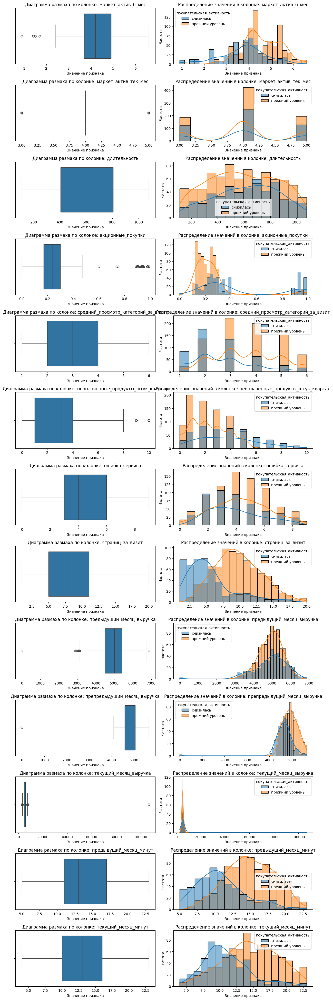

In [ ]:
plot_box_hist_chart(market, hue='покупательская_активность')

Заметен  очень большой выброс в выручке по одному клиенту. Посмотрим, что это за клиент.

In [ ]:
market.query('текущий_месяц_выручка > 20000')

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут
id,,,,,,,,,,,,,,,,,
215380,снизилась,премиум,нет,1.7,4,637,0.94,техника для красоты и здоровья,3,2,4,7,6077.0,5051.0,106862.2,12,14


In [ ]:
money.query('id == 215380')

,id,прибыль
32,215380,3.88


Мы видим, что это премиум пользователь, зарегистрированный более 2 лет назад (вероятно постоянный клиент), и у него высокая доля покупок по акциям (94%). При этом его покупательская активность в последнее время снизилась. Очень похоже на целевой сегмет клиентов в рамках настоящего исследования, который, к тому же совершил покупку на крупную сумму в последнем месяце.

Однако, учитывая огромную разницу в сумме выручки с другими клиентами, наличие такого выброса в данных может существенно снизить качество модели машинного обучения. Поэтому от выброса а данных лучше избавиться.

Посколько аномальная запись всего 1 из 1300, то можем без последствий удалить ее из выборки.

In [ ]:
# удалим пользователя из всех файлов
market = market.query('id != 215380')
market_file = market_file.query('id != 215380')
market_money = market_money.query('id != 215380')
market_time = market_time.query('id != 215380')
money = money.query('id != 215380')

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍




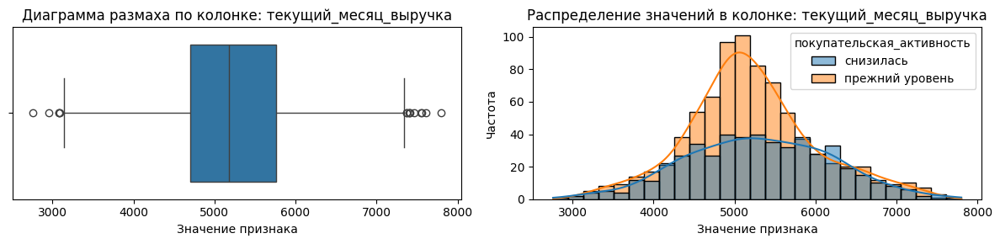

In [ ]:
# Распределение признака после удаления выброса
plot_box_hist_chart(market.query('текущий_месяц_выручка <= 20000')[['текущий_месяц_выручка', 'покупательская_активность']], hue='покупательская_активность')

Теперь распределение имеет нормальный вид.

**money**

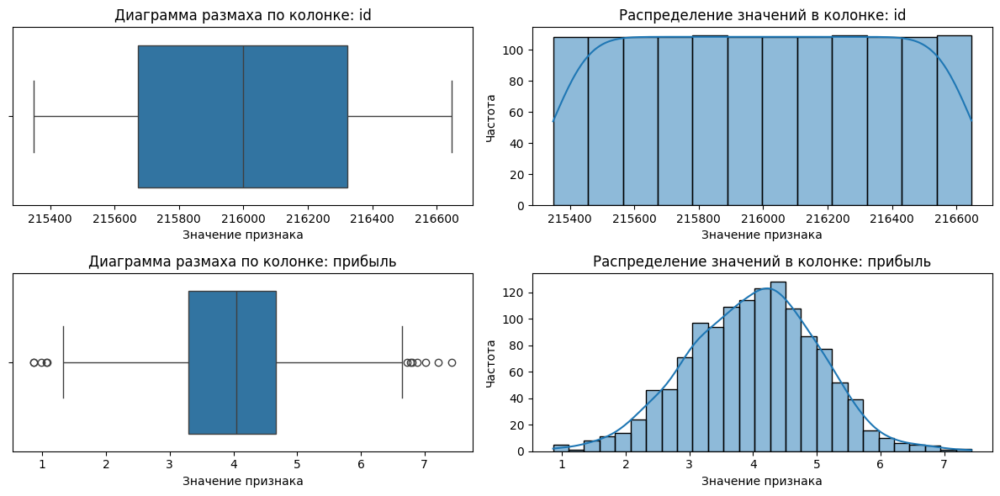

In [ ]:
plot_box_hist_chart(money)

**1. Выбросы и анализ числовых признаках:**

**`market`:**

- `маркет_актив_6_мес`: выбросы представляют собой покупателей, которым приходило 1-2 маркетинговых сообщений в последние 6 месяцев. Возможно это малоактивные пользователи или нецелевой сегмент магазина. Заметно, что пользователям с прежней активностью в среднем приходило больше маркетинговых сообщений за последние полгода.
- `маркет_актив_тек_мес`: было всего 3 категории пользователей, которым приходило 3,4,5 сообщений соответственно. Данные не являются выбросами.
- `акционные_покупки`: на графиках выделяется подгруппа пользователей с высокой долей покупок по акциям (>80%). Либо это новые пользователи, которые разово пришли по акциям и больше не делали заказы, либо постоянные, которые дожидаются акций на любимые товары. Заметно, что спад активности произошел в основном у любителей акций, возможно это связано с маркетинговой политикой компании в последнее время.
- `средний_просмотр_категорий_за_визит`: ПОльзователи с прежней активностью просматривают в среднем больше категорий товаров за визит, чем пользователи, у которых активность снизилась.
- `неоплаченные_продукты_штук_квартал`: небольшое количество пользователей имеют 9 или 10 продуктов в корзине, которые не были оплачены. В основном большое количество неоплаченных товаров имеет категория пользователей, у которых активность снизилась в последнее время.
- `ошибка_сервиса`: Категория пользователей со сниженной активностью даже немного реже сталкивалась с ошибками в работе сервиса. Вероятно это происходит по тому, что более активные пользователи больше времени проводят на сайте и чаще сталкиваются с ошибками. В целом, кажется, такие ошибки не сильно влияют на снижение активности пользователей.
- `страниц_за_визит`: Пользователи с прежней активность просматривают намного больше страниц за визит в среднем, чем пользователи с низкой активностью.
- `предыдущий_месяц_выручка` и `текущий_месяц_выручка`: Каких-то различий в размерах выручки клиентов с разной активностью в предыдущем месяце не выявлено. В колонке `текущий_месяц_выручка` заметен <u>существенный выброс</u> - один покупатель с очень большой выручкой. Вероятно, данный пользователей на самом деле совершил крупную покупку, однако наличие такого большого выброса может существенно снизить качество моделей классификации. ПОэтому данные об этом пользователе были удалены из всех таблиц.
- `препредыдущий_месяц_выручка`: Два месяца назад у категории пользователей со сниженной активностью наблюдалась более низкая выручка, чем у пользователей с прежним уровнем активности. Возможно, в последние два месяца компания начала менять свою маркетинговую политику и разница в предыдущем и в текущем месяца уже не так очевидна.
- `предыдущий_месяц_минут` и `текущий_месяц_минут`: В среднем пользователи с прежней активностью тратят больше времени на сайте, чем пользователи со сниженной активностью.

Других явных аномалий в количественных признаках таблицы `market` не видно, все значения находятся в рамках естественных и объяснимых границ и не являются аномалиями.

**`money`:**
- есть небольшие выбросы в колонке с прибылью, которую приносят клиенту интернет-магазина. Выбросы есть как справа, так и слева и объясняются естественными причинами. Не являются аномалиями

**2. Распределения числовых признаков:**

**`market`:**

- `маркет_актив_6_мес`: распределение признака близко к нормальному.
- `маркет_актив_тек_мес`:признак имеет всего 3 значения, что недостаточно для оценки формы распределения, но судя по распределению данных среди трех категорий оно также близко к нормальному.
- `длительность`: распеределение имеет вид нормального с широким колоколом, что делает его похожим на равномерное. Видно как число регистраций новый пользователей интернет-магазин сначала росло, но после какого-то момента начало снижаться. Это подтверждает первоначальное предположение о снижении эффективности привлечения новых клиентов.
- `акционные_покупки`: график показывает <u>бимодальное распределением</u> признака (два пика нормального распределения). Выделяется группа пользователей, покупающих преимущественно акционные товары.
- `средний_просмотр_категорий_за_визит`, `неоплаченные_продукты_штук_квартал`, `ошибка_сервиса`, `страниц_за_визит`: распределение блико к нормальному.
- `предыдущий_месяц_выручка`, `текущий_месяц_выручка` и `препредыдущий_месяц_выручка`: распределение признаков имеет вид нормального. На графике заметна небольшая группа пользователей с 0 выручкой, которые ничего не купили за прошедший период.
- `предыдущий_месяц_минут` и `текущий_месяц_минут`: признак распределен нормально

**`money`:**
- `прибыль`: признак распределен нормально.

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Тут обновил выводы, учитывая, что графики строил по сводному файлу. Добавились дополнительные колонки по выручке и минутам за разные периоды. Плюс добавил небольшие наблюдения о различиях в группах по целевому признаку. В целом, выводы существенно не поменялись.
</div>

#### Категориальные признаки

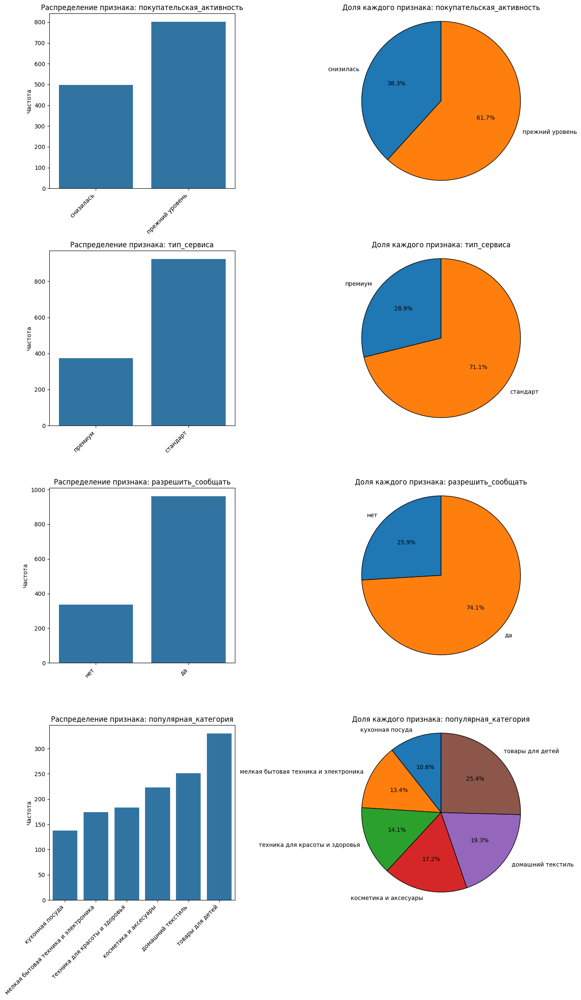

In [ ]:
plot_bar_pie_chart(market, y_label='Частота')

- `покупательская_активность`: Снижение активности наблюдается у 38% пользователей (у 62% она осталась на прежнем уровне). Учитывая, что это целевая переменная, то наличие небольшого дисбаланса классов может привести к тому, что модель может немного чаще предсказывать неизменность активности пользователей. А значит такие клиенты не будут учитываться при проведении маркетинговых мероприятий и магазин недополучит прибыль. При построении модели машинного обучения рекомендуется учитывать наличие такого дисбаланса в целевой переменной, чтобы избежать завышенной оценки покупателськой способности.
- `тип_сервиса`: Большинство пользователей (71%) относится к категории "стандарт".
- `разрешить сообщать`: Большиство пользователей (74%) согласно получать маркетинговые материалы.
- `популярная категория`: У пользователей в выборке есть 6 популярных категорий, наиболее популярная "товары для детей" (25.4%). Распределение по остальным категориям выглядит сбалансированно.


<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>

Успех:

    

- Правильно что продолжаешь практику с прошлого проекта и строишь 2 типа графиков для количественных признаков
    

- Хорошо что используешь subplots, seaborn,   стоит стремиться к красивому и компактному оформлению графиков


- Для  разных типов данных используешь  соответствующие графики
    

- Написана функция для графика - полезно, особенно если много однотипного кода

    
    
- Есть выводы по увиденному




<div class="alert alert-warning">


Совет 🤔:

   
- можно пойти дальше  и для графиков распределений сделать разбивку по таргету. Так мы можем получить дополнительную информацию для лучшего понимания наших данные, может что-то пригодится для раздела сегментации. Если использовать seaborn, это можно сделать с помощью аргумента [hue](https://www.statology.org/seaborn-histogram-hue/). В результате мы получим наложенные (в разбивки по таргету) 2 гистограммы (boxplot тоже неплохо добавить) для каждого количественного признака. И о категориальных незабываем. Будет красиво и информативно.
  

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Спасибо! Немного поменял функцию `plot_box_hist_chart`, добавил параметр hue для целевой переменной, а также kde=True, чтобы нахожить приближенный график непрерывного распределения на гистограмму.
</div>



<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>


Совет:

    
- для гистограмм по выручке и минутам, стоит предварительно сделать группировку по "период" (у нас будет 3 графика по выручке и 2 по минутам), это разумно, ведь именно в таком виде мы используем их      

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Так и сделал, спасибо! Стало более наглядно
</div>

### Активность клиентов

Для целей построения модели выберем активных клиентов, т.е. только тех у которых были покупки в последние 3 месяца.

Этот показатель можно отследить по наличию у магазина выручки, полученной от данного клиента в любом из трех последних месяцев.

Удалим из выборки клиентов, у которых хотя бы в одном из 3х месяцев выручка была равно 0.

In [ ]:
# найдем неактивных клиентов
market[(market['препредыдущий_месяц_выручка'] == 0) |
       (market['предыдущий_месяц_выручка'] == 0) |
       (market['текущий_месяц_выручка'] == 0)]

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут
id,,,,,,,,,,,,,,,,,
215348,снизилась,премиум,да,3.4,5,121,0.0,товары для детей,6,2,1,5,0.0,0.0,3293.1,13,14
215357,снизилась,стандарт,да,3.9,5,154,0.0,техника для красоты и здоровья,3,3,9,5,0.0,0.0,5986.3,12,6
215359,снизилась,стандарт,да,4.6,5,110,0.0,домашний текстиль,4,2,4,2,0.0,0.0,4735.0,13,11


In [ ]:
market.shape

(1299, 17)

В выборке есть 3 неактивных пользователя, уберем их из выборки.

In [ ]:
# Найдем индексы неактивных клиентов
inactive_clients_index = market[(market['препредыдущий_месяц_выручка'] == 0) |
                                 (market['предыдущий_месяц_выручка'] == 0) |
                                 (market['текущий_месяц_выручка'] == 0)].index

# Удалим неактивных клиентов из выборки
market = market.drop(inactive_clients_index)

In [ ]:
market.shape

(1296, 17)



<div class="alert alert-danger">
<font size="5"><b>Комментарий ревьюера</b></font>



Ошибка ❌:



по заданию мы убираем клиентов которые не проявили активность хотя бы в одном из 3 месяцев. Можешь объяснить почему мы это делаем?





<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Исправил. Думаю, чтобы не было утечки целевого признака. Если пользователь ничего не покупал, то тут не только снижение активности, а полное ее отсутствии. То есть его активность уже снизилась еще до того, как мы делаем прогноз.
    
</div>

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Совет 🤔:


А я думаю причина в том что Ноль - это может быть не показателем торговой активности, а того что человек например уезжал, или ещё не был нашим клиентом, или это какой-то разовый покупатель.  Вот поэтому и не стоит добавлять в анализ "шумовые данные"

### Снижение активности пользователей

In [ ]:
# временно добавим столбец с общей выручкой, чтобы проанализировать активность пользователей за все три периода
market['общая_выручка'] = market['препредыдущий_месяц_выручка'] + market['предыдущий_месяц_выручка']  + market['текущий_месяц_выручка']

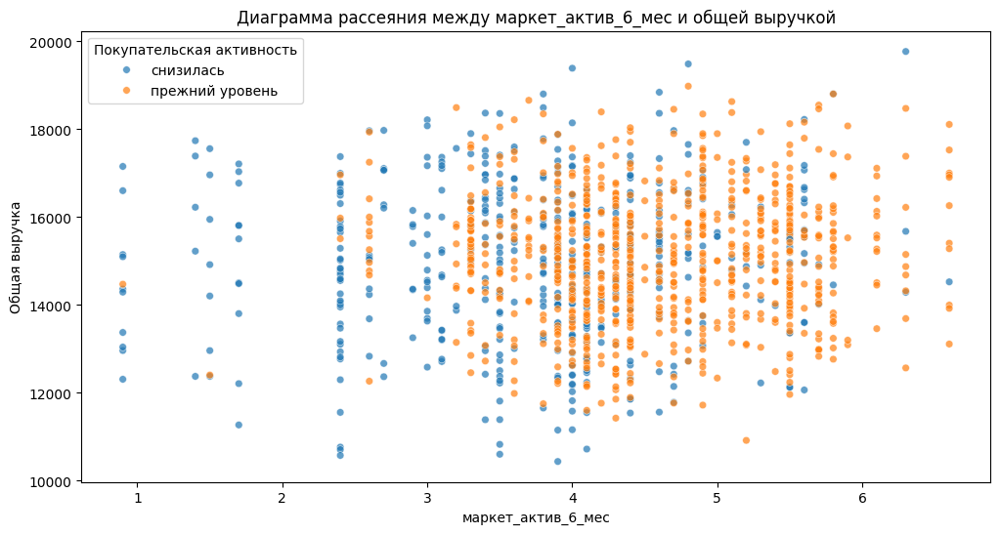

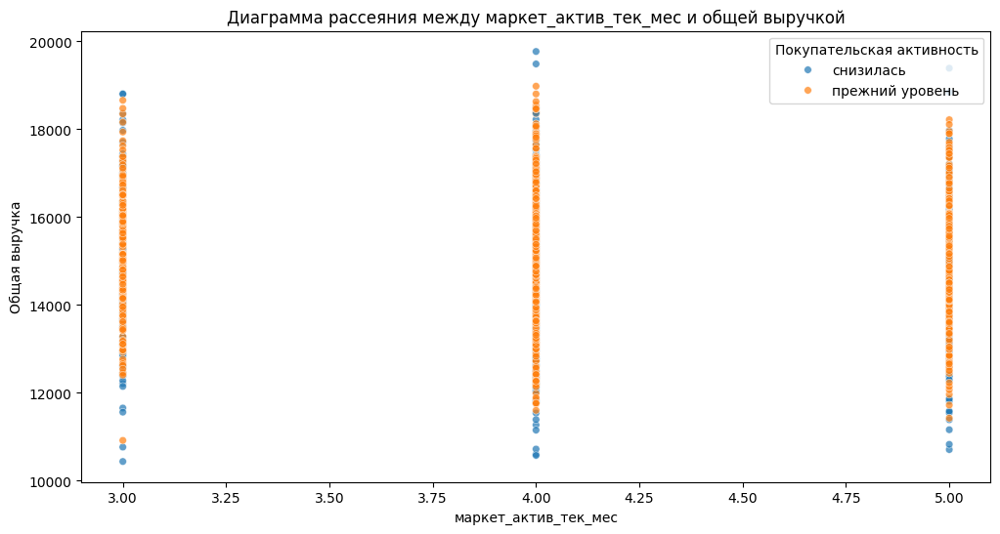

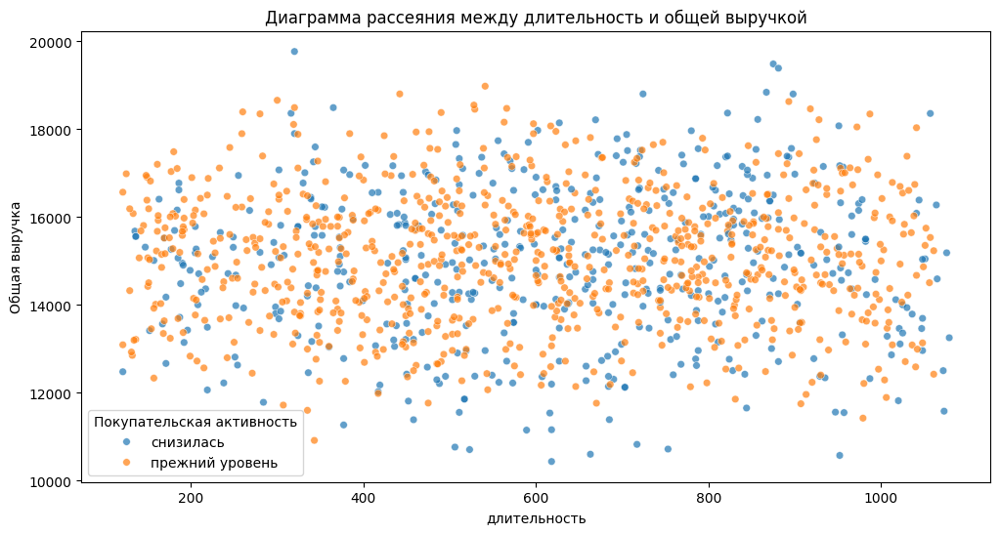

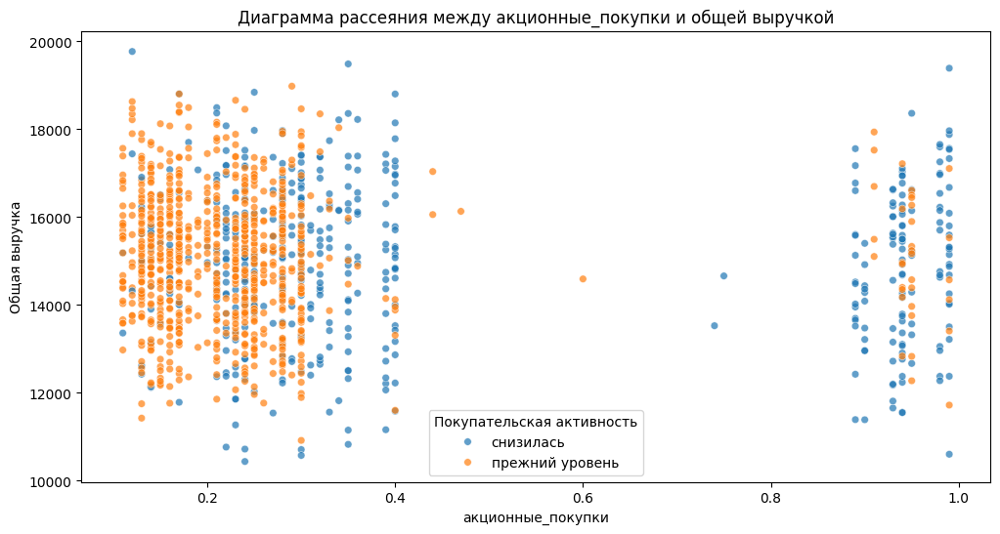

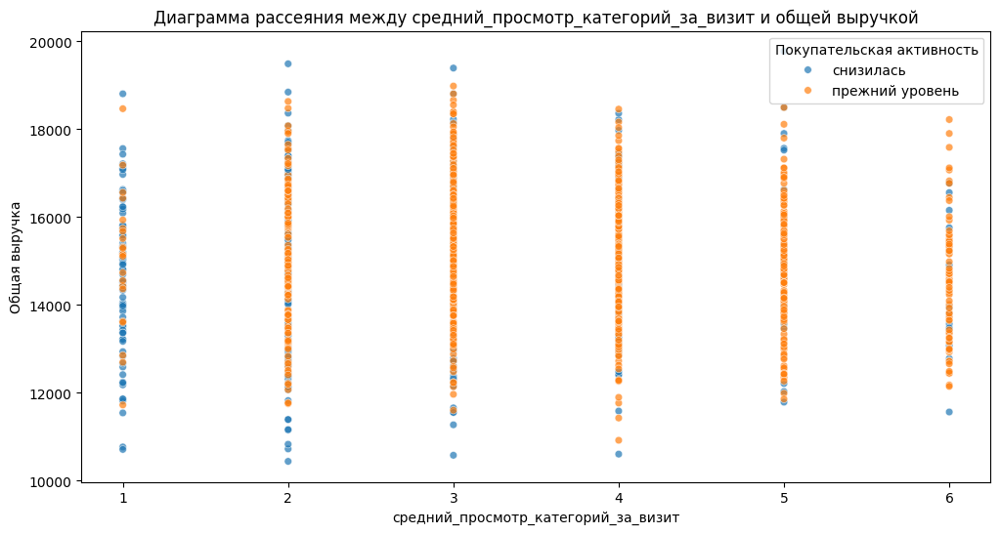

...

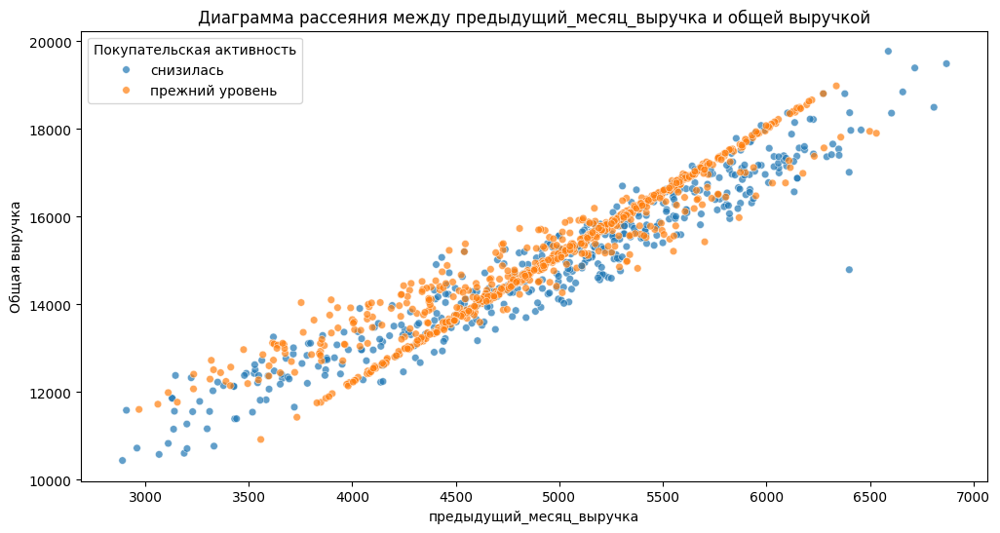

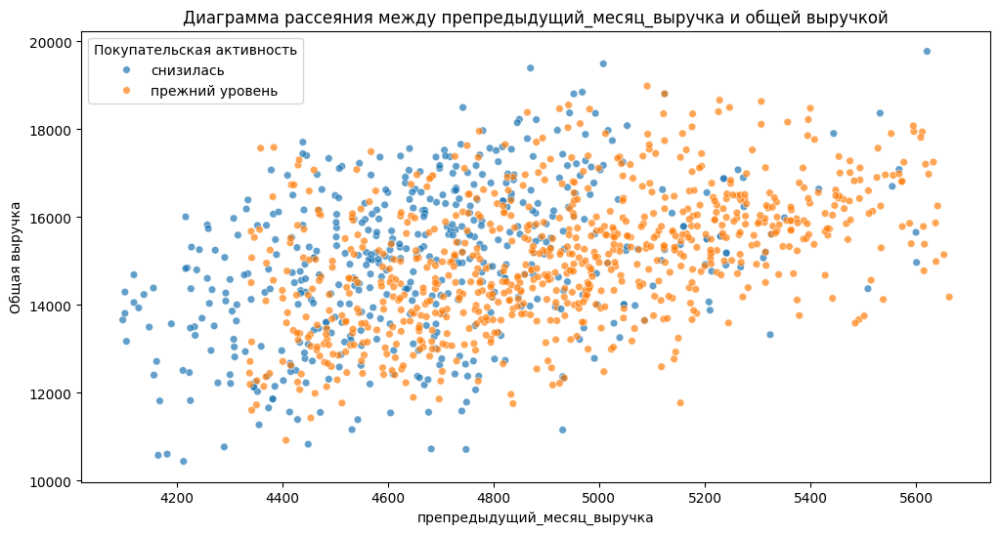

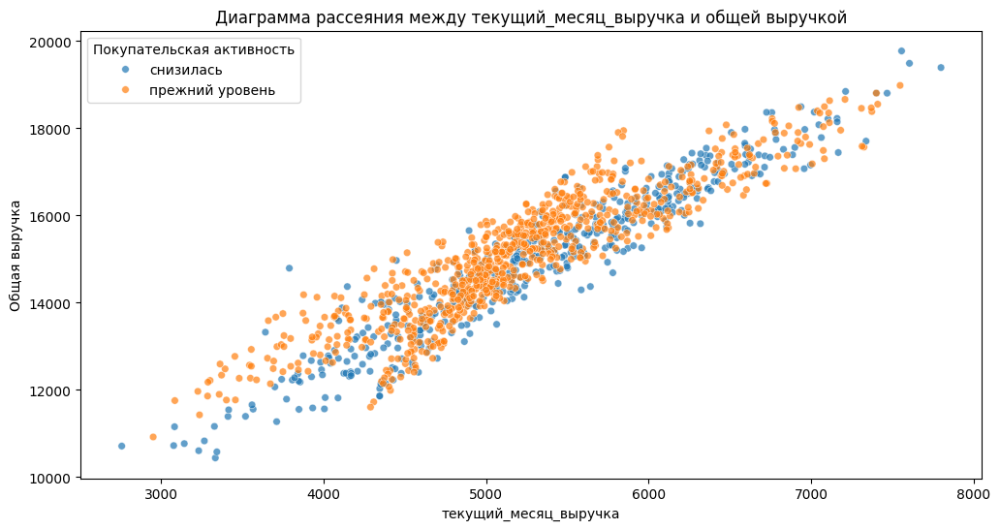

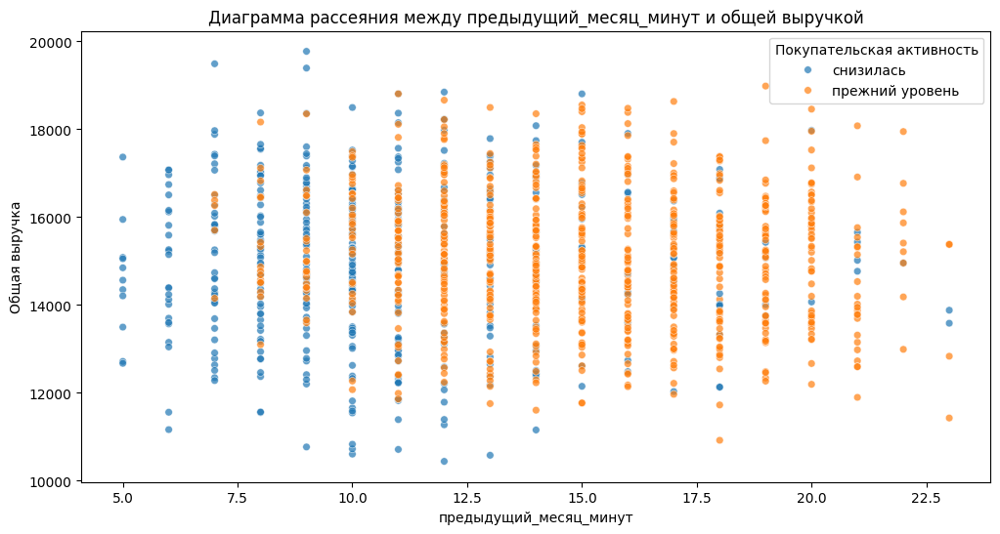

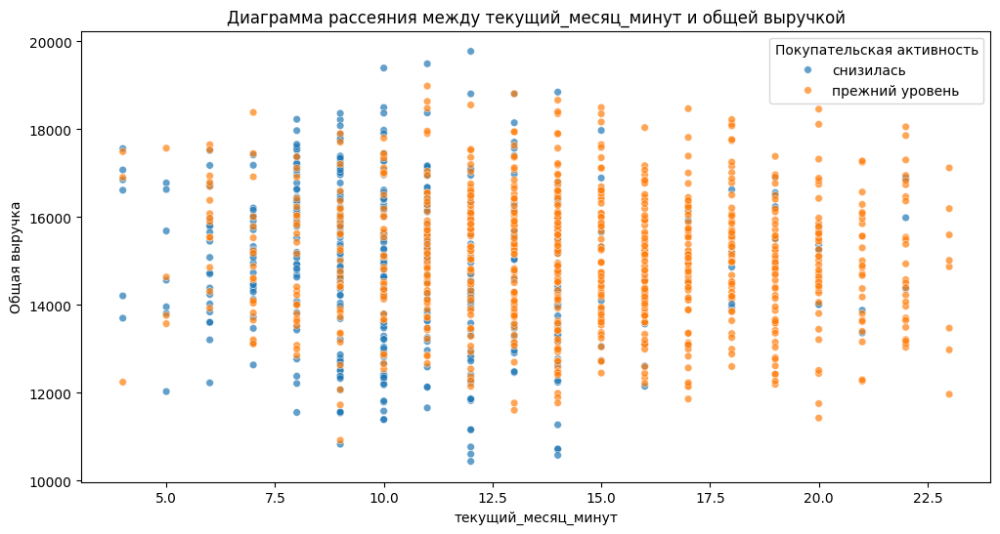

In [ ]:
# Фильтруем только количественные данные
quantitative_cols = market.select_dtypes(include='number').columns

# Проходим по количественным столбцам для построения диаграмм рассеяния
for col in quantitative_cols:
    if col not in ['общая_выручка', 'покупательская_активность']:
        plt.figure(figsize=(12, 6))
        sns.scatterplot(data=market, x=col, y='общая_выручка', hue='покупательская_активность', alpha=0.7, s=30)
        plt.title(f'Диаграмма рассеяния между {col} и общей выручкой')
        plt.xlabel(col)
        plt.ylabel('Общая выручка')
        plt.legend(title='Покупательская активность')
        plt.show()

На графиках заметно, что сниженние активности налюдалась в основном среди:
- пользователей с большой долей покупок акционных товаров.
- пользователей с большим количество неоплаченных товаров в корзине.
- пользователей, посещяющих не более 3 страниц интернет-магазина.

На графике зависимости выручки предыдущего месяца и общей выручки заметна четкая прямая линия из покупателей с прежней активностью. Вероятно, это и есть наш целевой сегмент постоянных покупателей. Такие же, но чуть менее явные линии видны и на графиках зависимости общей выручки от выручки за предыдущие периоды.


<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍




<div class="alert alert-warning">

Совет 🤔:





- Можно посмотреть scatter_plot между id и акционными покупками. Можно кое что интересное увидеть и дать этому обьяснение


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Заметил, когда делал сегментацию) Сначала в выборке как будто идут пользователи с высокой вероятность снижения активности, а дальше с высоким. Даже проверил, может есть связь с длительностью регистрации на сайте (думал id присваиваются последовательно и в основном отваливаются старые пользователи, которые раньше зарегистрировались), но нет, связи с длительностью не было. Очевидно это не все пользователи интернет магазин, а какая-то часть. Может быть это связано с особенностью формировании выборки (возможно так сработал алгоритм стратификации данных или что-то в этом духе), а айди был присвоен после.
    
А еще интересно, что если в матрицу корреляции добавить колонку id, то она показывает 100% корреляцию со всеми другими признаками. Возможно `id` формировался как закодированные значения признаков в других колонках или сами данные синтетические и созданы каким-то алгоритмом.
    
Но на анализ это никак не влияет, поэтому не стал расписывать подробней.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



Действительно можно было подумать о том что ID содержит какое-то временную характеристику, но действительно это не бьётся с "длительностью".

    А еще интересно, что если в матрицу корреляции добавить колонку id, то она показывает 100%
    
    
Верно.  Иногда забывают убрать id, получая стопроцентную точность прогноза.
    
    
    Возможно id формировался как закодированные значения признаков в других колонках или сами данные синтетические и созданы каким-то алгоритмом    
    
Согласен, скорее всего имеем дело с каким-то синтетическим датасетом    


Кроме того, на графиках заметно что связь между `акционные_покупки` и целевым признаком нелинейная. Выделяются две явные группы пользователей:

- в основном покупают только по акциям (более 80% покупок по акциям);
- не обращают внимание на акции (доля покупок по акциям <40%).

Учитывая нелинейнойсть связи, вероятно, лучше  заменить  признак `акционные_покупки` на **категориальный**, делящий пользователей на 2 категории:
- пользователи, которые чаще совершают покупки по акциям (>=50% покупок);и
- пользователи, которые чаще покупают товары без акций (<50% покупок).

In [ ]:
# Добавление нового столбца с условиями в таблицу
market['акционные_покупки_категория'] = market['акционные_покупки'].apply(lambda x: 'по_акциям' if x >= 0.5 else 'без_акций' if x < 0.5 else 'без категории')


In [ ]:
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,общая_выручка,акционные_покупки_категория
id,,,,,,,,,,,,,,,,,,,
215349,снизилась,премиум,да,4.4,4,819,0.75,товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10,14659.6,по_акциям
215350,снизилась,стандарт,нет,4.9,3,539,0.14,домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13,15341.9,без_акций
215351,снизилась,стандарт,да,3.2,5,896,0.99,товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13,17561.4,по_акциям
215352,снизилась,стандарт,нет,5.1,3,1064,0.94,товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11,16274.0,по_акциям
215353,снизилась,стандарт,да,3.3,4,762,0.26,домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10,15251.0,без_акций


In [ ]:
market['акционные_покупки_категория'].value_counts()

,count
акционные_покупки_категория,
без_акций,1129
по_акциям,167


In [ ]:
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,общая_выручка,акционные_покупки_категория
id,,,,,,,,,,,,,,,,,,,
215349,снизилась,премиум,да,4.4,4,819,0.75,товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10,14659.6,по_акциям
215350,снизилась,стандарт,нет,4.9,3,539,0.14,домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13,15341.9,без_акций
215351,снизилась,стандарт,да,3.2,5,896,0.99,товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13,17561.4,по_акциям
215352,снизилась,стандарт,нет,5.1,3,1064,0.94,товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11,16274.0,по_акциям
215353,снизилась,стандарт,да,3.3,4,762,0.26,домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10,15251.0,без_акций


### Выводы

1. **Основные характеристики пользователей**

- *Количество пользователей*: 1300 с уникальными идентификаторами от 215348 до 216647.
- *Покупательская активность*: У большинства пользователей уровень активности остался прежним.
- *Тип сервиса*: Преобладает стандартный тип сервиса.
- *Разрешение на сообщения*: Большинство пользователей согласны получать уведомления.
- *Маркетинговая активность*: Среднее количество сообщений за последние 6 месяцев составляет 4.25, что немного ниже в текущем месяце (4.01).
- *Длительность регистрации*: Средний срок регистрации пользователей — около 602 дней.
- *Акционные покупки*: Около 25% покупок совершаются по акциям.
- *Популярная категория*: Товары для детей.

2. **Выбросы и аномалии**

- *Выбросы*: Один пользователь с аномально высокой выручкой был удалён из выборки, так как его данные могли исказить качество моделей.
- *Числовые признаки*: В основном, выбросы не наблюдаются, за исключением некоторых категорий, где пользователи получали минимальное количество сообщений или имели высокую долю акционных покупок.

3. **Распределения признаков**

- *Числовые признаки* имеют нормальное распределение, за исключением акционных покупок, которые демонстрируют бимодальное распределение.
- *Категориальные признаки*: 38% пользователей показали снижение активности, что может привести к недостаточной предсказательной способности модели.

4. **Объединение данных**

- Данные о выручке и времени на сайте успешно объединены, что позволяет провести дальнейший анализ.

5. **Снижение активности пользователей**

Снижение активности наблюдается среди:
- Пользователей с высокой долей акционных покупок.
- Пользователей с большим количеством неоплаченных товаров.
- Пользователей, посещающих менее 3 страниц за визит.

6. **Наблюдения**

- *Дисбаланс классов*: Возмождно стоит учесть дисбаланс в целевой переменной при построении моделей.


<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:


👍 Подробный промежуточный вывод в конце

## Корреляционный анализ

Построим диаграмму рассеивания по всем признакам в таблице `market`.

In [ ]:
quantitative_cols = market.select_dtypes(include=['number']).columns.tolist()

In [ ]:
market[quantitative_cols]

,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,общая_выручка
id,,,,,,,,,,,,,,
215349,4.4,4,819,0.75,4,4,2,5,5216.0,4472.0,4971.6,12,10,14659.6
215350,4.9,3,539,0.14,5,2,1,5,5457.5,4826.0,5058.4,8,13,15341.9
215351,3.2,5,896,0.99,5,0,6,4,6158.0,4793.0,6610.4,11,13,17561.4
215352,5.1,3,1064,0.94,3,2,3,2,5807.5,4594.0,5872.5,8,11,16274.0
215353,3.3,4,762,0.26,4,1,1,4,4738.5,5124.0,5388.5,10,10,15251.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216643,6.6,3,318,0.24,5,3,3,11,3664.0,4704.0,4741.7,14,7,13109.7
216644,5.1,4,454,0.21,6,2,3,9,4729.0,5299.0,5353.0,12,11,15381.0
216645,4.1,3,586,0.20,3,2,5,7,5160.0,5334.0,5139.2,12,18,15633.2


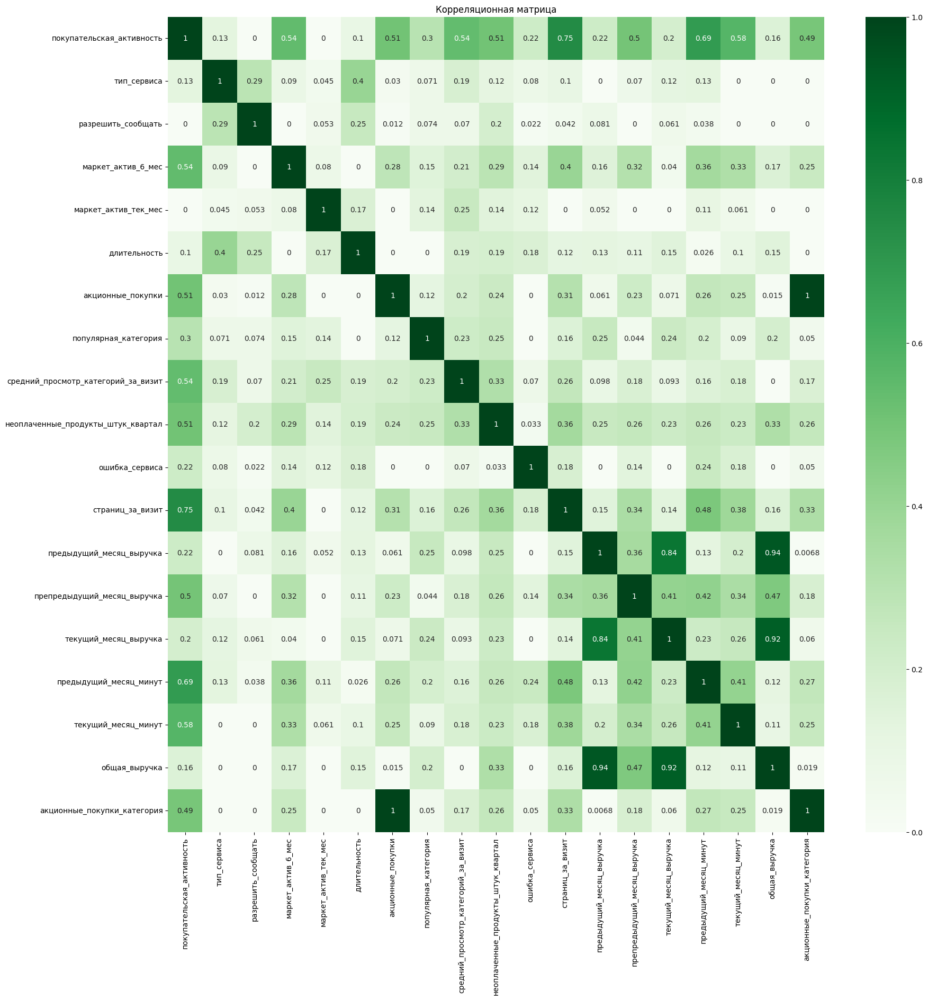

In [ ]:
# построим корреляционную матрицу по таблице всей таблицу market
plt.figure(figsize=(20, 20))
sns.heatmap(market
            .phik_matrix(interval_cols=quantitative_cols),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица")
plt.show()

Отдельно посмотрим на корреляции в разрезе по целевому признаку.

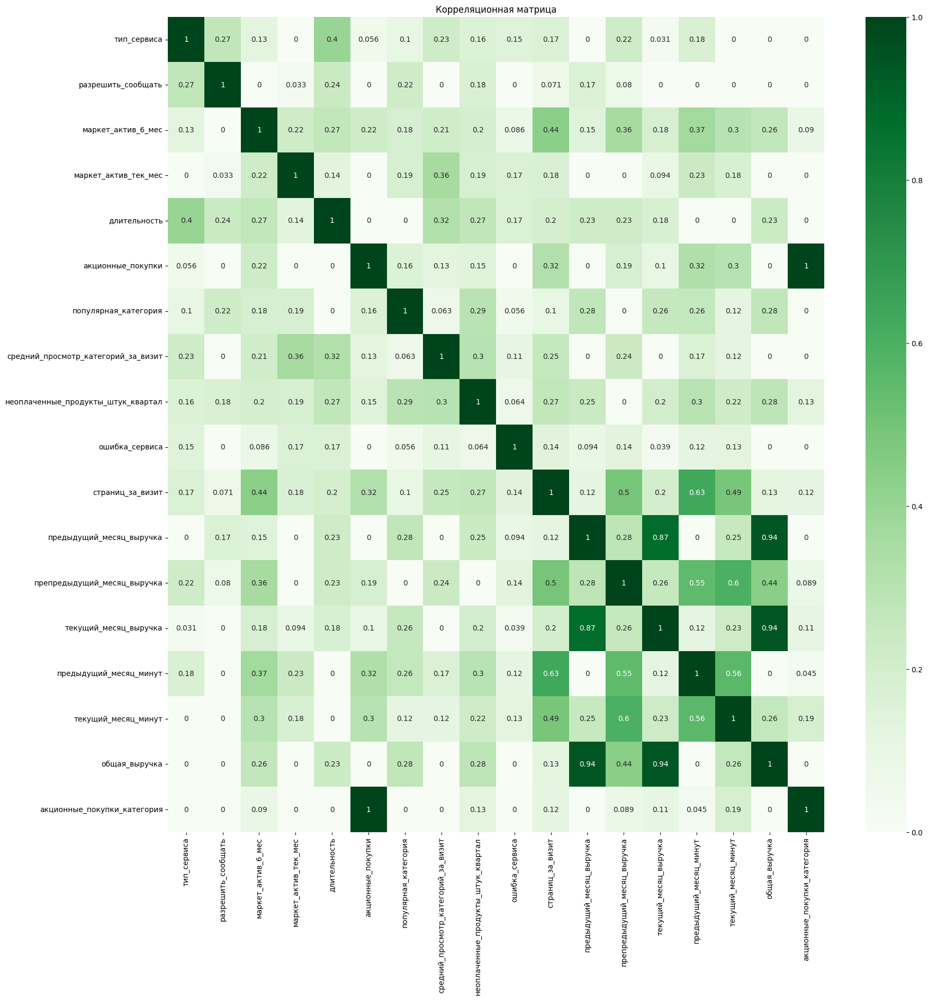

In [ ]:
# построим корреляционную матрицу по таблице всей таблицу market
plt.figure(figsize=(20, 20))
sns.heatmap(market.query('покупательская_активность == "снизилась"')
            .phik_matrix(interval_cols=quantitative_cols),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица")
plt.show()

Заметно, что у пользователей со сниженной активностью сильно коррелирована выручка за препредыдущий месяц и акционные покупки (0.9). Вероятно, 2 месяца назад проходили какие-то большие акции, что стимулировало покупки у данной группы клиентов. В предыдущем месяце кореляция уменьшилась (0.63), а в текущем месяце практически сошла на нет (0.12). Кажется, этот сегмент клиентов чувствителем к проведению акций, и основной вопрос в том, как увеличить его лояльность и стимулировать к неакционным покупкам (возможно, программы лояльности или мероприятия, направленные на увеличение длительности просмотра сайта и разных категорий товаров).

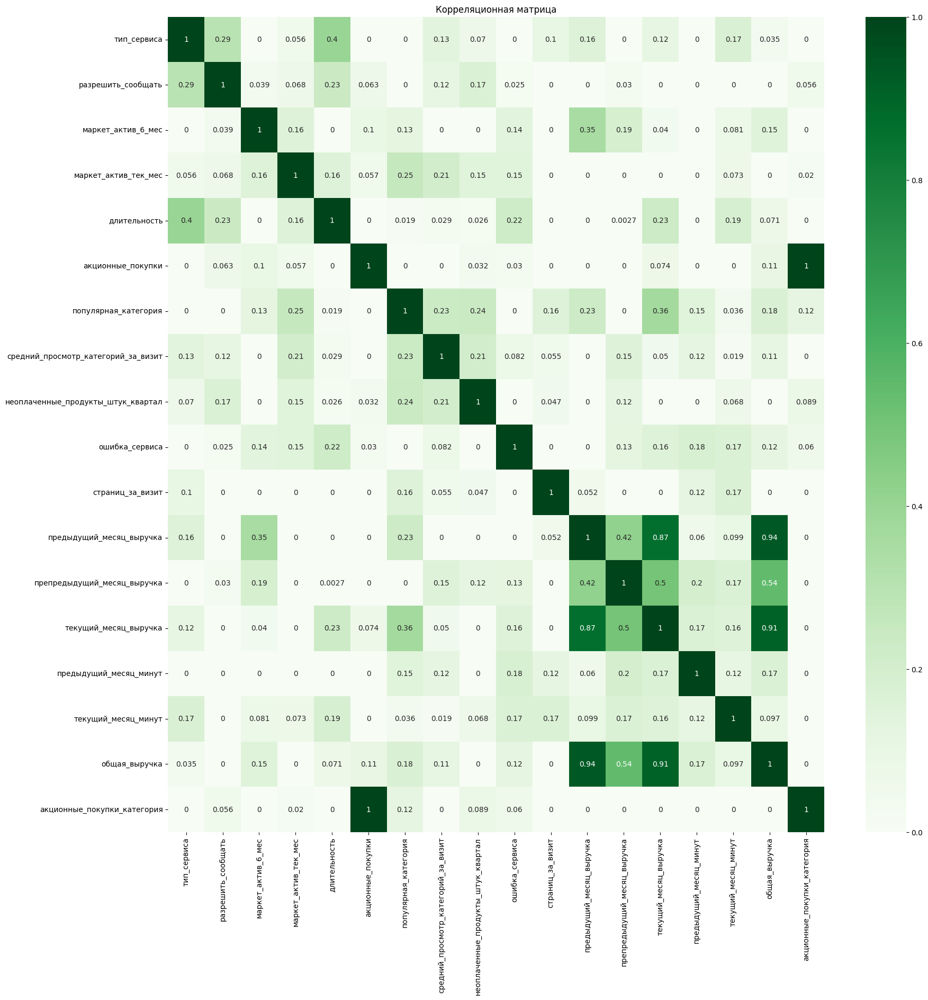

In [ ]:
# построим корреляционную матрицу по таблице всей таблицу market
plt.figure(figsize=(20, 20))
sns.heatmap(market.query('покупательская_активность == "прежний уровень"')
            .phik_matrix(interval_cols=quantitative_cols),
            annot=True,
            cmap='Greens'
           )
plt.title("Корреляционная матрица")
plt.show()

Пользователи с прежним уровнем активности практически не реагируют на проведение акций. В целом, данная группа похожа на постоянных и лояльных клиентов магазина. Тем не менее, у этой группы размер выручки коррелирует с маркетинговой активностью интернет-магазина. Возможно, для поддержания их интереса стоит сосредоточиться на улучшении взаимодействия с площадкой и периодической рассылать уведомления о новых товарах, особенно в их любимых категориях.  


<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



- здорово что использован phik, это позволяет тебе не обращать внимание на ограничения Пирсона/Спирмена
+ указан interval_cols

  


<div class="alert alert-warning">


Совет:



- для того чтобы чтобы лучше понять наши данные, предлагаю построить 2 матрицы коррелции, одну на данных покупателей со снижающей активностью, другую для сохраняющих активность, и посмотреть есть ли отличия. Даже если сильных отличий не будет, это тоже результат



<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Добавил дополнительно матрицы в разрезе по целевому признаку. Действительно, заметны интересны закономерности. Спасибо!
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



👍




Чтобы при построении моделей машинного обучения стобец "общая_выручка" не создавал мультиколлинеарность (коэф корреляции с выручкой за препредыдущий период = 0.91, а корреляция с целевой переменной ниже), удалим его из таблицы.

In [ ]:
market.drop('общая_выручка', axis=1, inplace=True)

Также поступим и с колонкой "акционные_покупки".

In [ ]:
market.drop('акционные_покупки', axis=1, inplace=True)

### Выводы

Больше всего коррелируют с целевой переменной следующие признаки:
- страниц_за_визит (0.75)
- предыдущий_месяц_минут (0.68)
- текущий_месяц_минут (0.58)
- маркет_актив_6_мес (0.54)
- средний_просмотр_категорий_за_визит (0.54)
- акционные_покупки_категория (0.49)
- препредыдущий_месяц_выручка (0.48)

Следующие признаки были исключены для избежания мультиколлинеарности:
- общая_выручка
- акционные_покупки

**Дополнительные наблюдения:**

1. Сегмент пользователей со сниженной активностью:

- Высокая корреляция между выручкой за препредыдущий месяц и акционными покупками (0.9) указывает на высокую чувствительность этой группы к акциям.
- Снижение корреляции в последующие месяцы (до 0.12) указывает на необходимость разработки стратегий для повышения лояльности этой группы клиентов и стимулирование покупок неакционных товаров, напрмиер разработка программ лояльности. Также полезным будут мероприятия, направленные на увеличения времени, проводимого на сайте, и количества просматриваемых категорий товаров.

2. Пользователи с прежним уровнем активности:

- Эта группа демонстрирует низкую реакцию на акции, что говорит о их стабильной лояльности.
- Корреляция выручки с маркетинговой активностью подразумевает, что для поддержания интереса стоит улучшить взаимодействие с клиентами и регулярно информировать их о новых товарах в любимых категориях. Возможно, следует поддерживать интерес данной группы через регулярные обновления и уведомления о новинках, а также улучшать опыт взаимодействия с платформой.

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>



Совет 🤔:


Создали столбцы а потом удалили...бывает. Для разнообразия можно было провести проверку на мультиколлинеарность с помощью VIF

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Кажется в основном курсе не было инфы про VIF. Может есть какие-нибудь ссылки где можно о нем почитать? Попробую на следующих проектах.
</div>

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Совет 🤔:


Каких-то специальных ссылок, в принципе это всё гуглится, например https://lifewithdata.com/2023/06/04/how-to-calculate-variance-inflation-factor-vif-in-python/

## Обучение моделей

### Описание признаков и выбор метрики

**Целевая переменная:** `покупательская_активность`

**Категориальные признаки (неранговые):**
- `тип_сервиса`
- `разрешить_сообщать`,
- `популярная_категория`

**Категориальные признаки (ранговые):**
- `акционные_покупки_категория`

**Количественные признаки:**
- `маркет_актив_6_мес`,
- `маркет_актив_тек_мес`,
- `длительность`,
- `средний_просмотр_категорий_за_визит`,
- `неоплаченные_продукты_штук_квартал`,
- `ошибка_сервиса`,
- `страниц_за_визит`,
- `препредыдущий_месяц_выручка`,
- `предыдущий_месяц_выручка`,
- `текущий_месяц_выручка`,
- `предыдущий_месяц_минут`,
- `текущий_месяц_минут`

**Выбор метрики:**

- **ROC-AUC**: Метрика поможет оценить общее качество работы модели вне зависимости от выбранного порога вероятности. Метрику можно использовать в случае, когда объектов с одним значением целевого признака больше, чем с другими. Метрика поможет выбрать лучшую модель.
- **Recall (TPR)**: Важно не упустить клиентов, активность которых снизилась, чтобы направить им персонализированную рекламу. Ложноположительные результаты при этом не критичны (желательно минимизировать FN и максимизировать Recall). Метрика поможет в калибровке лучшей модели, выбранной с учетом ROC-AUC.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



Логично




### Подготовка данных

In [ ]:
# Разделим данные на тренировочный и временный набор (тренировочный + валидационный_тестовый)
X_train, X_test_valid, y_train, y_test_valid = train_test_split(
    market.drop(['покупательская_активность'], axis=1),
    market['покупательская_активность'],
    test_size=TEST_VALID_SIZE,
    random_state=RANDOM_STATE,
    stratify=market['покупательская_активность']
)

# Теперь разделим валидационный_тестовый набор на валидационный и тестовый
X_valid, X_test, y_valid, y_test = train_test_split(
    X_test_valid,
    y_test_valid,
    test_size=VALID_SIZE,
    random_state=RANDOM_STATE,
    stratify=y_test_valid
)

# Проверим размеры выборок
X_train.shape, X_valid.shape, X_test.shape

((777, 16), (259, 16), (260, 16))

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Решил все же добавить валидационную выборку к данным, т.к. неразмеченных данных для тестирования нету.
    
Поэтому обучать будем на train, оценивать качество моделей также будет по метрикам при кросс-валидации на тренировочной выборке. Но также будем обращать внимание на оценку ROC_AUC на валидационной выборке. Это также поможет оценить переобученность/недообученность моделей и возможно донастроить какие-то параметры.
    
Итоговое качество лучшей модели оценим на test (test больше до этого нигде использовать не будем).
</div>

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Совет 🤔:


Минус такого решения в том что у нас и так данных немного,  а ты и без того их уменьшаешь.  А выгода только в том что у тебя получается двойная как бы проверка на валидации (кроссвалидация - .best_score_ + на вручную созданной валидационной выборке) - как будто бы минусов больше чем плюсов.
    


In [ ]:
y_train.unique()

array(['прежний уровень', 'снизилась'], dtype=object)

In [ ]:
# проверим кодировку
print(y_train[:3,])
print(y_valid[:3,])
print(y_test[:3,])

id
216375    прежний уровень
216325    прежний уровень
216286    прежний уровень
Name: покупательская_активность, dtype: object
id
216361    прежний уровень
216265    прежний уровень
215837          снизилась
Name: покупательская_активность, dtype: object
id
215746          снизилась
215616          снизилась
215951    прежний уровень
Name: покупательская_активность, dtype: object


In [ ]:
# Закодируем целевой признак
label_encoder = LabelEncoder()

# Зададим порядок кодирования, чтобы "снизилась" закодировалось 1.
y_label_classes = ['прежний уровень', 'снизилась']

label_encoder.fit(y_label_classes)

y_train = label_encoder.transform(y_train)
y_valid = label_encoder.transform(y_valid)
y_test = label_encoder.transform(y_test)

In [ ]:
# проверим кодировку
print(y_train[:3,])
print(y_valid[:3,])
print(y_test[:3,])

[0 0 0]
[0 0 1]
[1 1 0]


In [ ]:
# выведем названия закодированных классов [0, 1] соответственно
label_encoder.classes_

array(['прежний уровень', 'снизилась'], dtype='<U15')


<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



Плюс за проверку, лучше сделать так чтобы LabelEncoder гарантированно закодировал снизилась единицей





<div class="alert alert-warning">

Совет:

    

- константа лучше оставлять сразу после импортов библиотек, как их легче будет контролировать и изменять при надобности
    
    
    RANDOM_STATE = 42
    TEST_SIZE = 0.25



    

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Явно задал порядок в кодировании классов.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



Отлично что нашёл решение. Плохо что LabelEncoder не предполагает явного указания как что кодировать (Всё-таки для как f1, presicion, recall принципиально чтобы положительный класс кодировал   единицей),  поэтому приходится немножко костыли приделывать




### Создание пайплайнов

In [ ]:
# Создадим списки с названиями признаков

target_column =['покупательская_активность']

ohe_columns = [
    'тип_сервиса',
    'разрешить_сообщать',
    'популярная_категория'
]

ord_columns = ['акционные_покупки_категория']

num_columns = [
    'маркет_актив_6_мес',
    'маркет_актив_тек_мес',
    'длительность',
    'средний_просмотр_категорий_за_визит',
    'неоплаченные_продукты_штук_квартал',
    'ошибка_сервиса',
    'страниц_за_визит',
    'препредыдущий_месяц_выручка',
    'предыдущий_месяц_выручка',
    'текущий_месяц_выручка',
    'предыдущий_месяц_минут',
    'текущий_месяц_минут'
]



<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:


Тут всё логично

  

<div class="alert alert-warning">



Совет 🤔:



В будущем при предобработке данных можешь учитывать следующие моменты:

    
- если у категориального признака большое количество уникальных значений, применение One-Hot Encoding может привести к большому количеству новых признаков, это усложнит работу моделей
    
- у catboost и lighgbm есть собственные инструменты работы с категориальными данными, нужно только указать какие столбца содержат категориальные данные
    
- при работе с количественными признаками для линейных и метрических (модели в которых измеряется расстояние) моделей  обязательно делаем Scaler, в отличие от моделей на основе деревьев решений, для них Scaler не нужен
        

Можешь подумать над вопросом почему для линейных моделей некорректное использование OrdinalEncoder может вызвать больше проблем чем для случайного леса  или других моделей в основе которых лежат деревья решений   



<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Спасибо! OrdinalEncoder кодирует категориальные признаки числами в одной колонке (0, 1, 2, 3 и т.д.) и линейные модели могут воспринимать категории как упорядоченный набор признаков, хотя реально такой связи нету. Поэтому, наверное, можно кодировать им ранговые переменные даже в линейных моделях (например, плохо-нормально-хорошо), а вот другие не стоит.
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



Верно.  А модели в основе которых деревья решений (Дерево решений, случайный лес, бустинги ), там сплиты, и модели нелинейные,  поэтому проблема фальшивых закономерностей изза OE, нивелируются




In [ ]:
# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent', add_indicator=False)),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='error', sparse_output=False))
    ]
)

In [ ]:
# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                    ['без_акций', 'по_акциям']
                ],
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

In [ ]:
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', StandardScaler(), num_columns)
    ],
    remainder='passthrough'
)

In [ ]:
# создаём итоговый пайплайн с базовой моделью логистической регрессии
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', LogisticRegression(random_state=RANDOM_STATE))
])

In [ ]:
# учитывая, что возможно мы захотим поэксперементировать с добавление новых признаков и устранением дисбаланса классов
# создадим расширенную версию пайплайна для этого
pipe_final_imb = ImbPipeline([
    ('preprocessor', data_preprocessor),
    ('poly', 'passthrough'),
    ('sampler', 'passthrough'),
    ('models', LogisticRegression(random_state=RANDOM_STATE))
])

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



Здорово что обратил внимание на дисбаланс. Также можно было использовать class_weight



<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Я думал, что тут тоже можно было бы создать один общий пайплайн и также добавить в него селектор признаков. Но большая часть кода была уже написана пока разбирался и эксперементировал как все работает, и не очень хотелось все переписывать) Поэтому в итоге получилось три отдельных пайпа. Уже в следующем проекте попробую соединить все в один, чтобы можно было использовать его повторно в будущем.
    
class_weight я дальше пробую при переборе гиперпараметров в логистической регрессии, кажется из-за него метрики становятся хуже.
    
</div>

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Совет 🤔:


     class_weight я дальше пробую при переборе гиперпараметров в логистической регрессии, кажется из-за него метрики становятся хуже
    
Есть такое    

### Поиск лучшей модели

#### Базовая модель логистической регрессии

In [ ]:
# списки для хранения данных об обученных моделях
pipelines_names = []
pipelines = []
train_auc_cv = []
valid_auc = []

In [ ]:
pipe_final.fit(X_train, y_train)

y_valid_pred = pipe_final.predict(X_valid)
y_valid_proba = pipe_final.predict_proba(X_valid)[:, 1]

print(f'Метрика ROC-AUC на кросс-валидации (тренировочная выборка): {cross_val_score(pipe_final, X_train, y_train, cv=5, scoring="roc_auc").mean()}')
print(f'Метрика ROC-AUC на валидационной выборке: {roc_auc_score(y_valid, y_valid_proba)}')
base_model = pipe_final

Метрика ROC-AUC на кросс-валидации (тренировочная выборка): 0.8938787749723339
Метрика ROC-AUC на валидационной выборке: 0.9271464646464648


<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>



Совет 🤔:

Этот раздел кажется излишним.  Кроме того ты считаешь метрику на тренировочной выборке, а что она показывает?
И тест выборку лучше не использовать до момента выбора лучшей модели
    
    
Так что если хочешь оставь это, но лучше Используй cross_val_score    

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Решил все же оставить этот раздел, но вместо тестовой использовать валидационную выборку, чтобы оценить недообученность/переобученность модели.
    
Про кросс-валидацию согласен, исправил. Основным фактором при выборе модели будет оценка по кросс-валидации. Если оценка на кросс-валидации практически одинаковая, то будем также учитывать оценку на валидационной выборке, чтобы не выбрать переобученную/недообученную модель.
    
Везде ниже просмотрел весь код, чтобы тестовая выборка не использовалась и не упоминалась до того момента как выберем лучшую. Также добавил уточнения где используется кросс-валидация, а где просто roc-auc на одном предсказании.
    
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



👍




In [ ]:
# Сохраним результаты в соответствующие списки
pipelines_names.append('base_model')
pipelines.append(base_model)
train_auc_cv.append(cross_val_score(pipe_final, X_train, y_train, cv=5, scoring="roc_auc").mean())
valid_auc.append(roc_auc_score(y_valid, y_valid_proba))

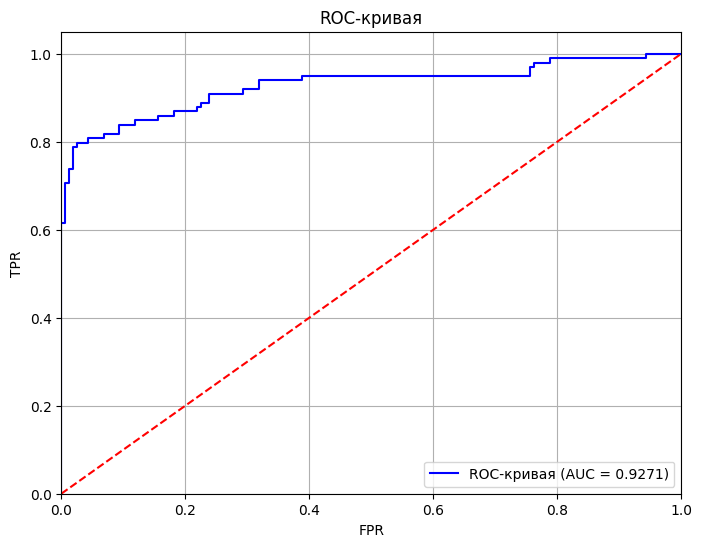

In [ ]:
plot_roc_curve(y_valid, y_valid_proba)

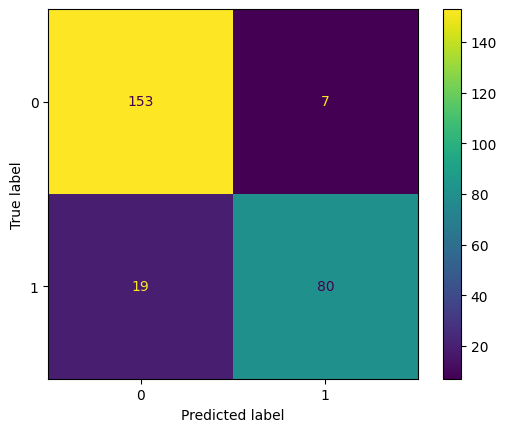

In [ ]:
# построим матрицу ошибок
plot_confusion_matrix(pipe_final, X_valid, y_valid)

Неплохое качество у базовой модели, но посмотрим можно ли лучше.

#### Подбор модели и гиперпараметров

##### RandomizedSearchCV

Попробуем перебрать разные варианты моделей и гиперпараметров с помощью RandomizedSearchCV, т.к. количество возможных вариантов достаточно велико для перебора другими методами:

In [ ]:
param_grid_randomized = [
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(1, 31),
        'models__min_samples_split': range(2, 21),
        'models__min_samples_leaf': range(1, 21),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(1, 51),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [LogisticRegression(random_state=RANDOM_STATE, solver='liblinear', penalty='l1')],
        'models__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [SVC(random_state=RANDOM_STATE, probability=True)],
        'models__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'models__gamma': [0.001, 0.01, 0.1, 1],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    }
]

Лучшая модель и её параметры:




Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models',
                 DecisionTreeClassifier(max_depth=10, min_samples_leaf=15,
                                        min_samples_split=19,
                                        random_state=42))])

Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка): 0.8836387347836215
Метрика ROC-AUC на валидационной выборке: 0.8929924242424243


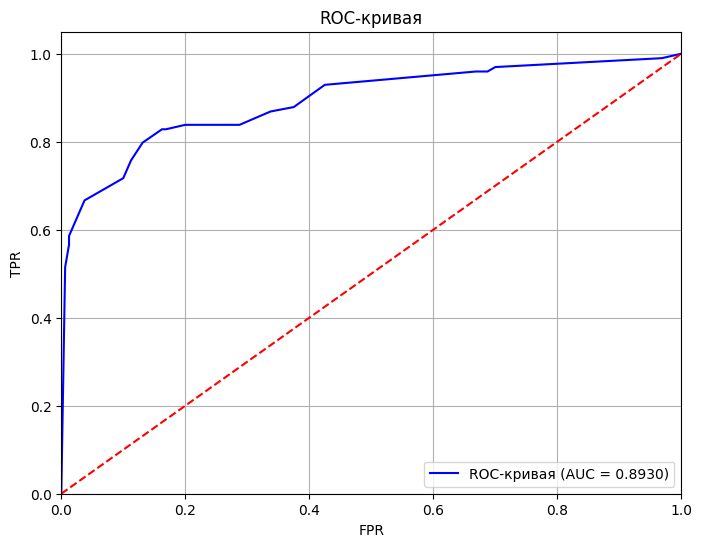

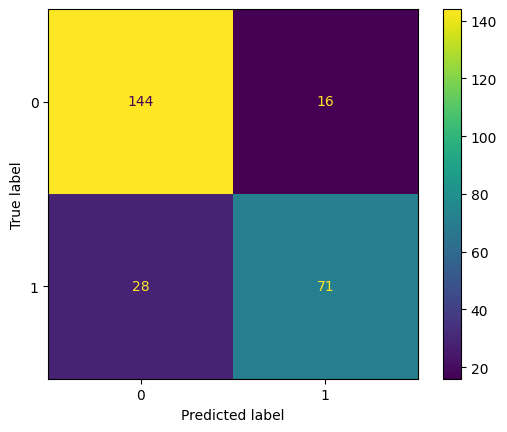

,rank_test_score,param_models,mean_test_score,params
183,1,DecisionTreeClassifier(random_state=42),0.883639,"{'preprocessor__num': 'passthrough', 'models__..."
149,2,DecisionTreeClassifier(random_state=42),0.883203,"{'preprocessor__num': StandardScaler(), 'model..."
112,2,DecisionTreeClassifier(random_state=42),0.883203,"{'preprocessor__num': 'passthrough', 'models__..."
92,2,DecisionTreeClassifier(random_state=42),0.883203,"{'preprocessor__num': MinMaxScaler(), 'models_..."
173,2,DecisionTreeClassifier(random_state=42),0.883203,"{'preprocessor__num': 'passthrough', 'models__..."



CPU times: user 1.95 s, sys: 226 ms, total: 2.18 s
Wall time: 19.2 s


In [ ]:
%%time

randomized_search, results = find_best_model_randomized(
    pipe_final,
    param_grid_randomized
)
print()

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍 %%time cv_results_




In [ ]:
# Сохраним результаты в соответствующие списки
pipelines_names.append('randomized_search.best_estimator_')
pipelines.append(randomized_search.best_estimator_)
train_auc_cv.append(randomized_search.best_score_)
valid_auc.append(roc_auc_score(y_valid, randomized_search.predict_proba(X_valid)[:, 1]))

Метрики стали хуже, чем было у базовой модели. Видимо алгоритм случайного поиск не справился с поиском лучшей модели, даже с большим числом итераций (200). Возможно количество попыток было недостаточным.

Чтобы сильно не увеличивать число попыток и время поиска, попробуем использовать другой алгоритм OptunaSearch.

<div class="alert alert-danger">
<font size="5"><b>Комментарий ревьюера</b></font>



Ошибка ❌:




Тут всё-таки поставлю красное, потому что ты слишком вольно используешь тестовый выборку.  Ты её используешь для сравнения результатов, а тестовая выборка - это имитация реального прогноза,  используем её только один раз в самом конце
    
    
Кроме того best_score_     это не Метрика на тренировочной выборке, это Метрика на кросс валидации, поэтому не надо её сравнивать с roc_auc_score(y_train, y_train_proba) -  тут ты обучил модель на данных и посмотрел на них же метрику, а best_score_ это Метрика на данных на которых модель не обучалась. Поэтому это разные метрики и сравнивать их не стоит и называть одним и тем же названием

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Согласен, исправил тут и далее.
</div>

##### OptunaSearchCV

В отличии от RandomizedSearchCV в OptunaSearchCV сетку параметров нужно подавать в виде словаря, а не списка.

Поэтому немного адаптируем сетку с входящими параметрами под новый инструмент. Так как один словарь представляет собой одну модель с различными настройками гиперпараметров, то перебирать модели придется в цикле.

In [ ]:
param_grid_optuna = [
    {
        'models': distributions.CategoricalDistribution([DecisionTreeClassifier(random_state=RANDOM_STATE)]),
        'models__max_depth': distributions.IntDistribution(1, 30),
        'models__min_samples_split': distributions.IntDistribution(2, 20),
        'models__min_samples_leaf': distributions.IntDistribution(1, 20),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([KNeighborsClassifier()]),
        'models__n_neighbors': distributions.IntDistribution(1, 50),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([LogisticRegression(
            random_state=RANDOM_STATE,
            solver='liblinear',
            penalty='l1'
        )]),
        'models__C': distributions.FloatDistribution(0.001, 100),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    },
    {
        'models': distributions.CategoricalDistribution([SVC(random_state=RANDOM_STATE, probability=True)]),
        'models__C': distributions.FloatDistribution(0.001, 100),
        'models__gamma': distributions.FloatDistribution(0.001, 1),
        'preprocessor__num': distributions.CategoricalDistribution([StandardScaler(), MinMaxScaler(), 'passthrough'])
    }
]

Лучшая модель: DecisionTreeClassifier с параметрами:



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models',
                 DecisionTreeClassifier(max_depth=14, min_samples_leaf=10,
                                        min_samples_split=20,
                                        random_state=42))])

Лучшая оценка ROC_AUC (кросс-валидация) на обучающем наборе: 0.8832025137359969
ROC-AUC оценка на валидационном наборе: 0.8945391414141415


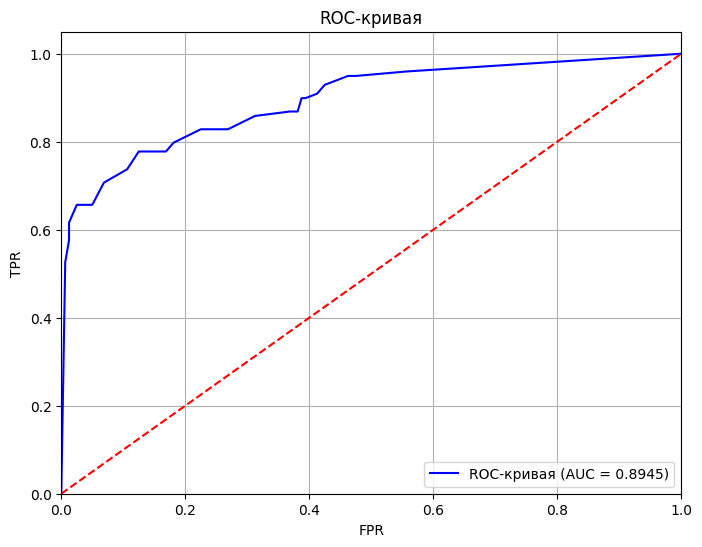

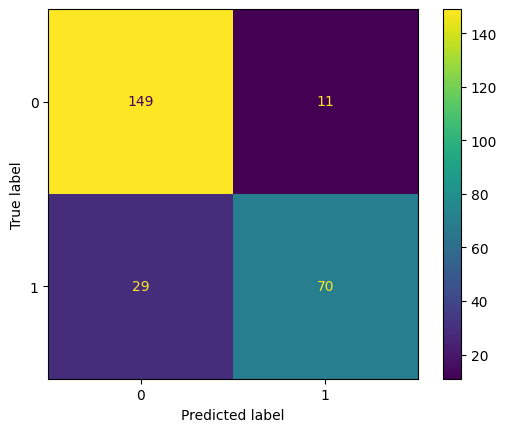

Лучшая модель: KNeighborsClassifier с параметрами:



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                  ['маркет_актив_6_мес',
                                                   'маркет_актив_тек_мес',
                                                   'длительность',
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models', KNeighborsClassifier(n_neighbors=20))])

Лучшая оценка ROC_AUC (кросс-валидация) на обучающем наборе: 0.8941394039887782
ROC-AUC оценка на валидационном наборе: 0.9049242424242424


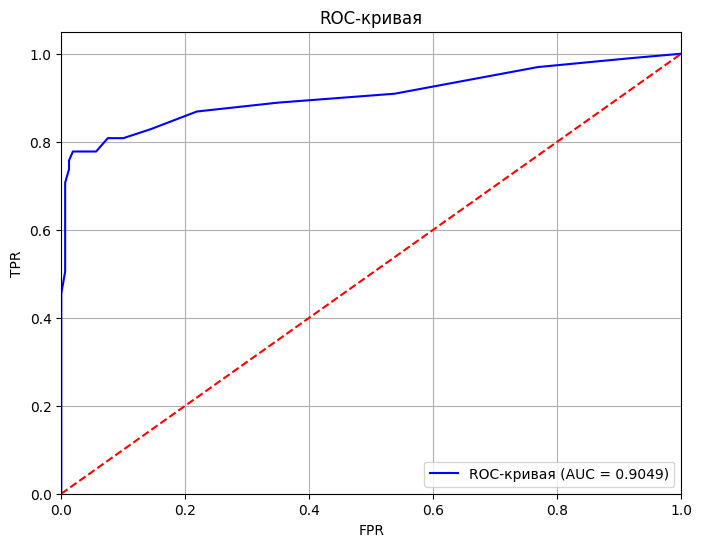

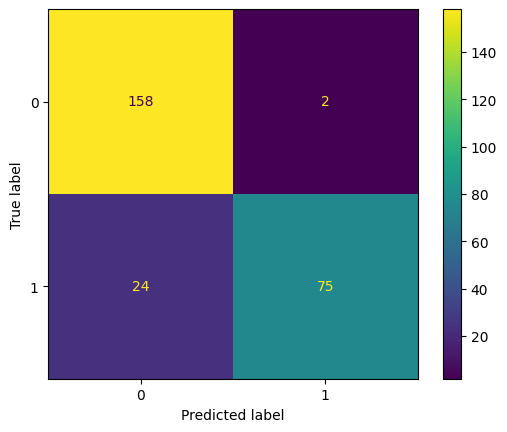

Лучшая модель: LogisticRegression с параметрами:



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'длительность',
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models',
                 LogisticRegression(C=9.05173001043461, penalty='l1',
                                    random_state=42, solver='liblinear'))])

Лучшая оценка ROC_AUC (кросс-валидация) на обучающем наборе: 0.8946414565010581
ROC-AUC оценка на валидационном наборе: 0.9263888888888889


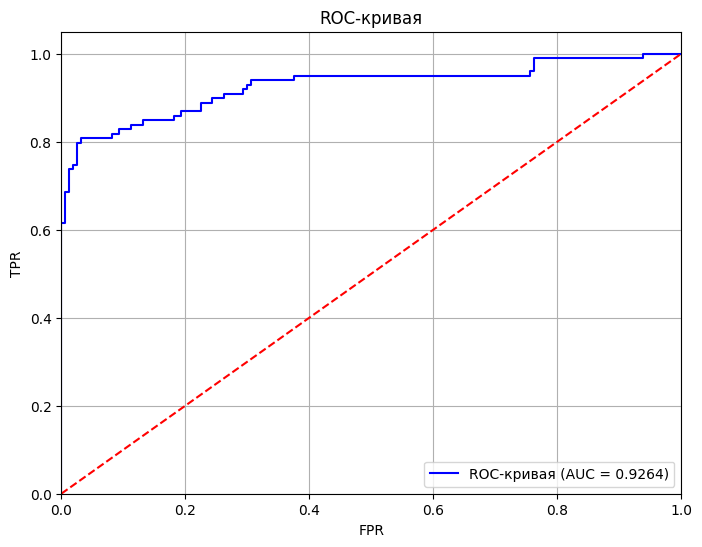

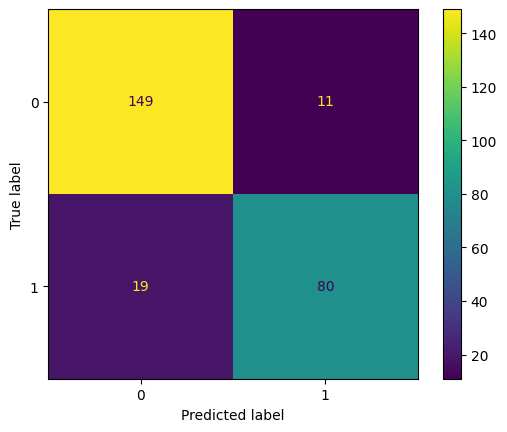

Лучшая модель: SVC с параметрами:



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'длительность',
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models',
                 SVC(C=89.31066986758924, gamma=0.2701807036080126,
                     probability=True, random_state=42))])

Лучшая оценка ROC_AUC (кросс-валидация) на обучающем наборе: 0.9150132506261286
ROC-AUC оценка на валидационном наборе: 0.9131313131313131


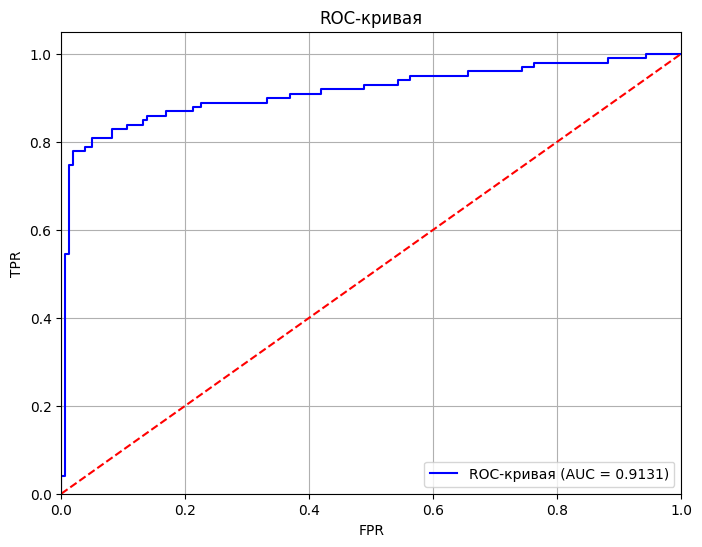

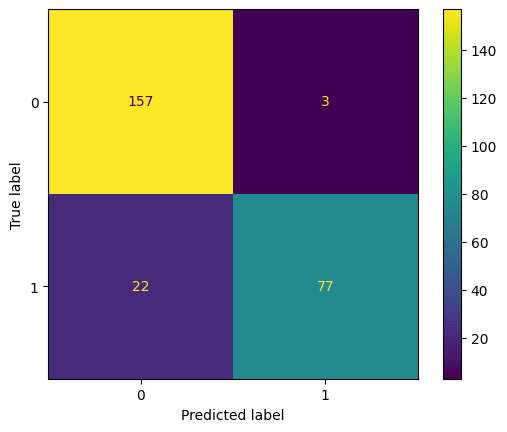

,params,best_estimator,best_score,roc_auc_test
0,{'models': CategoricalDistribution(choices=(De...,"(ColumnTransformer(remainder='passthrough',\n ...",0.883203,0.894539
1,{'models': CategoricalDistribution(choices=(KN...,"(ColumnTransformer(remainder='passthrough',\n ...",0.894139,0.904924
2,{'models': CategoricalDistribution(choices=(Lo...,"(ColumnTransformer(remainder='passthrough',\n ...",0.894641,0.926389
3,{'models': CategoricalDistribution(choices=(SV...,"(ColumnTransformer(remainder='passthrough',\n ...",0.915013,0.913131



CPU times: user 41 s, sys: 961 ms, total: 41.9 s
Wall time: 41 s


In [ ]:
%%time

best_optuna_model, optuna_models_dict, results_df = \
find_best_model_optuna(
    pipe_final,
    param_grid_optuna
)
print()

In [ ]:
for key, model in optuna_models_dict.items():
    # Сохраним результаты в соответствующие списки
    pipelines_names.append(f"optuna_models_dict['{key}']")  # Сохраняем имя модели
    pipelines.append(model)       # Сохраняем саму модель

    model.fit(X_train, y_train)

    # Получаем AUC
    train_auc_cv.append(cross_val_score(model, X_train, y_train, cv=5, scoring='roc_auc').mean())
    valid_auc.append(roc_auc_score(y_valid, model.predict_proba(X_valid)[:,1]))

Выведем лучшую модель в результате поиска OptunaSearchCV и ее метрики:

In [ ]:
best_optuna_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'длительность',
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models',
                 SVC(C=89.31066986758924, gamma=0.2701807036080126,
                     probability=True, random_state=42))])

In [ ]:
# Получение лучшей оценки на тренировочной выборке
print(f'Метрика ROC-AUC на кросс-валидации (тренировочная выборка): {cross_val_score(best_optuna_model, X_train, y_train, cv=5, scoring="roc_auc").mean()}')

# Прогнозы на валидационном наборе
y_valid_proba = best_optuna_model.predict_proba(X_valid)[:, 1]
roc_auc = roc_auc_score(y_valid, y_valid_proba)

print(f'Метрика ROC-AUC на валидационной выборке: {roc_auc}')

Метрика ROC-AUC на кросс-валидации (тренировочная выборка): 0.9150132506261286
Метрика ROC-AUC на валидационной выборке: 0.9131313131313131


#### Полиномизация и сэмплирование признаков

Отталкиваясь от лучшей найденной модели, попробуем еще ее немного улучшить с помощью полиномизация признаков и устранения дизбаланса классов методом SMOTE. Также попробуем разные ядра.

Параметров немного, поэтому используем полный перебор GridSearchCV.

In [ ]:
param_grid_svc = [
    {
        'models': [best_optuna_model.named_steps['models']],
        'poly': [PolynomialFeatures(include_bias=False), 'passthrough'],
        'sampler': [SMOTE(random_state=RANDOM_STATE), 'passthrough'],
        'models__kernel': ['linear', 'rbf']
    }

]

Лучшая модель и её параметры:




Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('poly', 'passthrough'), ('sampler', 'passthrough'),
                ('models',
                 SVC(C=89.31066986758924, gamma=0.2701807036080126,
                     probability=True, random_state=42))])

Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка): 0.9150132506261286
Метрика ROC-AUC на валидационной выборке: 0.9131313131313131


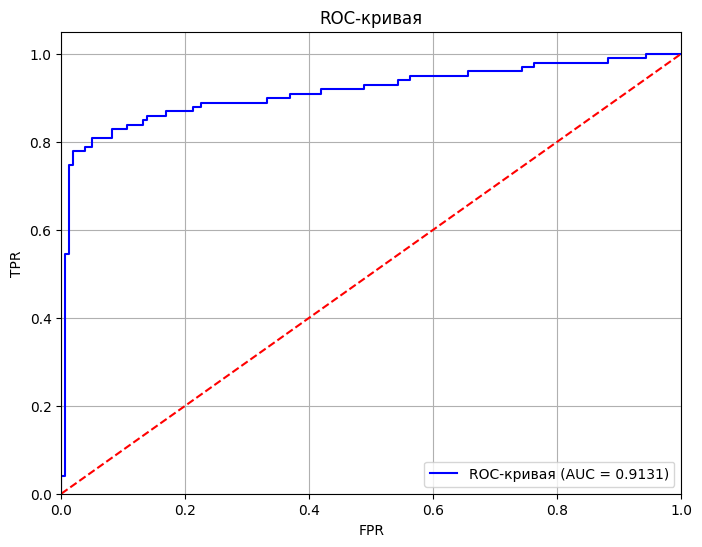

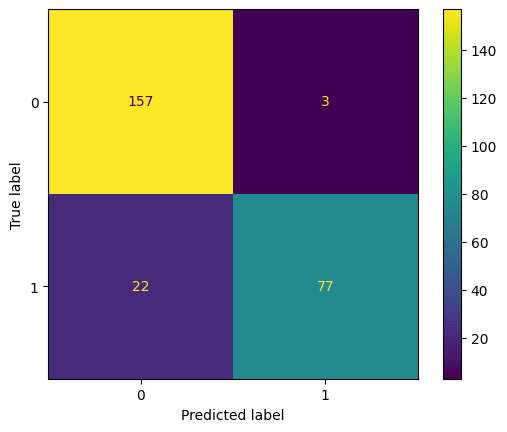

,rank_test_score,param_models,mean_test_score,params
7,1,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.915013,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
6,2,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.913832,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
3,3,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.893890,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
2,4,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.891717,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
1,5,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.845796,"{'models': SVC(C=89.31066986758924, gamma=0.27..."



CPU times: user 759 ms, sys: 224 ms, total: 983 ms
Wall time: 25.9 s


In [ ]:
%%time

grid_search_svc, results = find_best_model_grid(
    pipe_final_imb,
    param_grid_svc
)
print()

Лучшая можель по прежнему та же, что была выбрана ранее. Полиномизация и сэмплирование не пригодилось. Попробуем еще полиномиальное ядро с разными степенями.

In [ ]:
# Сохраним результаты в соответствующие списки
pipelines_names.append('grid_search_svc.best_estimator_')  # Сохраняем имя модели
pipelines.append(grid_search_svc.best_estimator_)       # Сохраняем саму модель

# Получаем AUC
train_auc_cv.append(grid_search_svc.best_score_)
valid_auc.append(roc_auc_score(y_valid, grid_search_svc.best_estimator_.predict_proba(X_valid)[:,1]))

In [ ]:
param_grid_svc_poly = [
    {
        'models': [best_optuna_model.named_steps['models']],
        'poly': [PolynomialFeatures(include_bias=False), 'passthrough'],
        'sampler': [SMOTE(random_state=RANDOM_STATE), 'passthrough'],
        'models__kernel': ['poly'],  # Используем только полиномиальное ядро
        'models__degree': range(2, 6)  # Добавляем степени для полиномиального ядра
    }
]

Лучшая модель и её параметры:




Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('poly', PolynomialFeatures(include_bias=False)),
                ('sampler', SMOTE(random_state=42)),
                ('models',
                 SVC(C=89.31066986758924, degree=2, gamma=0.2701807036080126,
                     kernel='poly', probability=True, random_state=42))])

Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка): 0.8801493243636788
Метрика ROC-AUC на валидационной выборке: 0.875189393939394


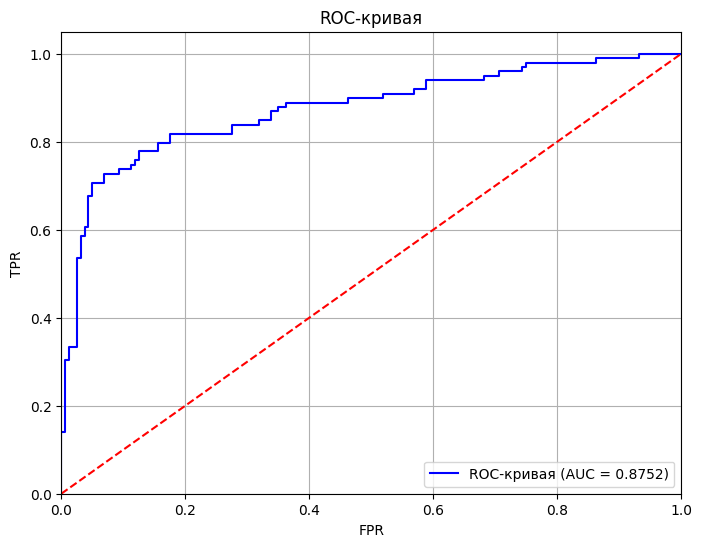

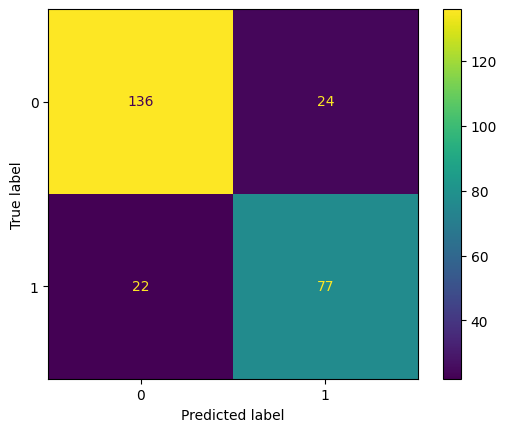

,rank_test_score,param_models,mean_test_score,params
0,1,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.880149,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
1,2,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.880050,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
15,3,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.878440,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
6,4,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.873382,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
14,5,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.872393,"{'models': SVC(C=89.31066986758924, gamma=0.27..."



CPU times: user 912 ms, sys: 191 ms, total: 1.1 s
Wall time: 11.8 s


In [ ]:
%%time

grid_search_svc_poly, results = find_best_model_grid(
    pipe_final_imb,
    param_grid_svc_poly
)
print()

<div class="alert alert-danger">
<font size="5"><b>Комментарий ревьюера</b></font>



Ошибка ❌:



здорово что использовал optuna,  осталось только убрать использование тестовой выборки


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
В OptunaSearch и в других функциях поменял код, чтобы теперь лучшая модель выбиралась не по метрике на валидационной выборке, а на кросс-валидации тренировочной. Тестовую отовсюду убрал
    
</div>

In [ ]:
# Сохраним результаты в соответствующие списки
pipelines_names.append('grid_search_svc_poly.best_estimator_')  # Сохраняем имя модели
pipelines.append(grid_search_svc_poly.best_estimator_)       # Сохраняем саму модель

# Получаем AUC
train_auc_cv.append(grid_search_svc_poly.best_score_)
valid_auc.append(roc_auc_score(y_valid, grid_search_svc_poly.best_estimator_.predict_proba(X_valid)[:,1]))

Полономинальное ядро отработало хуже. Оставим предыдущий варинт.

### Селектор признаков

In [ ]:
# обновим пайплайн и добавим в него отбор признаков
pipe_final_imb_selector = ImbPipeline([
    ('preprocessor', data_preprocessor),
    ('selector', 'passthrough'),
    ('models', LogisticRegression(random_state=RANDOM_STATE))
])

In [ ]:
len(best_optuna_model.named_steps['preprocessor'].get_feature_names_out())

20

In [ ]:
param_grid_svc_selector = [
    {
        'models': [best_optuna_model.named_steps['models']],
        'selector' : [SelectKBest(score_func=f_classif), SelectKBest(score_func=mutual_info_classif)],
        'selector__k': range(1, len(best_optuna_model.named_steps['preprocessor'].get_feature_names_out()))
    }

]

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍SelectKBest




Лучшая модель и её параметры:




Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('selector',
                 SelectKBest(k=17,
                             score_func=<function mutual_info_classif at 0x7c5a407a98a0>)),
                ('models',
                 SVC(C=89.31066986758924, gamma=0.2701807036080126,
                     probability=True, random_state=42))])

Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка): 0.9133079362999202
Метрика ROC-AUC на валидационной выборке: 0.9077020202020202


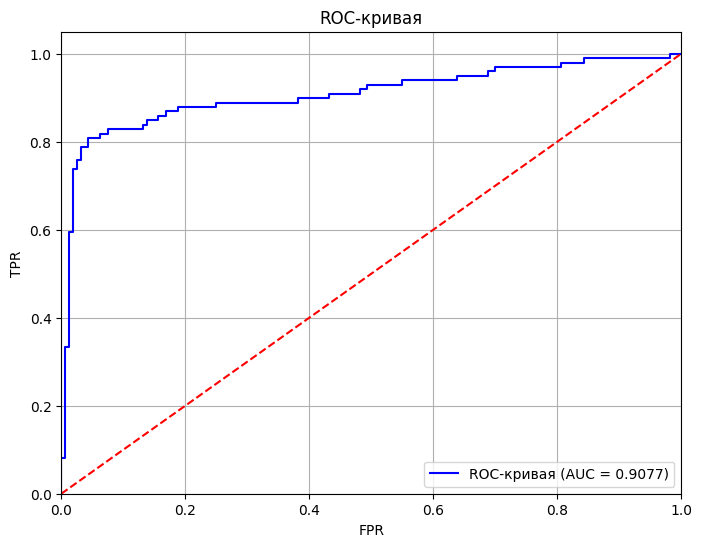

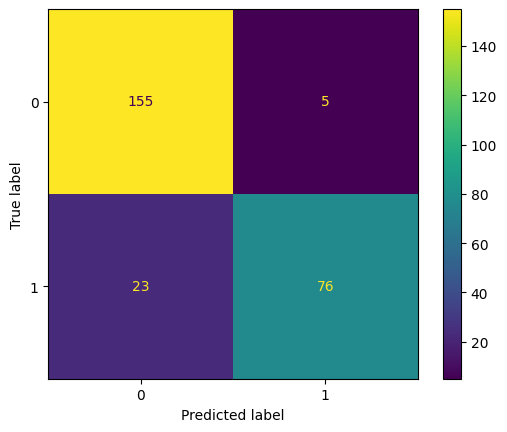

,rank_test_score,param_models,mean_test_score,params
35,1,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.913308,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
18,2,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.912463,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
36,3,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.911853,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
17,4,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.910566,"{'models': SVC(C=89.31066986758924, gamma=0.27..."
15,5,"SVC(C=89.31066986758924, gamma=0.2701807036080...",0.910489,"{'models': SVC(C=89.31066986758924, gamma=0.27..."



CPU times: user 1.08 s, sys: 199 ms, total: 1.28 s
Wall time: 18.8 s


In [ ]:
%%time

grid_search_svc_selector, results = find_best_model_grid(
    pipe_final_imb_selector,
    param_grid_svc_selector
)
print()

In [ ]:
# Сохраним результаты в соответствующие списки
pipelines_names.append('grid_search_svc_selector.best_estimator_')  # Сохраняем имя модели
pipelines.append(grid_search_svc_selector.best_estimator_)       # Сохраняем саму модель

# Получаем AUC
train_auc_cv.append(grid_search_svc_selector.best_score_)
valid_auc.append(roc_auc_score(y_valid, grid_search_svc_selector.best_estimator_.predict_proba(X_valid)[:,1]))

ROC_AUC при кросс-валидации на тренировочной выборке немного вырос, если использовать SelectKBest(k=18, function mutual_info), однако качество на валидационной выборке немного упало. Это говорит о том, что возможно модель немного переобучилась и сильней подстроилась под тренировочные данные. Будем использовать исходную модель, без селектора, т.к. в ней метрики на тренировочной и валидационной выбоке практически совпадают.

<div class="alert alert-danger">
<font size="5"><b>Комментарий ревьюера</b></font>



Ошибка ❌:




И снова используешь тестовую выборку. Это всё называется подгонка

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Понял, исправил.
</div>

### Dummy-модели

Для сравнения проверим, как поведут себя различные примитивные модели и какие предсказания они дадут. Выберем из них лучшую и запишем в общую таблицу для сравнения.

In [ ]:
param_grid_dummy = [
    {
        'models': [DummyClassifier(random_state=RANDOM_STATE)],
        'models__strategy': ['most_frequent', 'prior', 'stratified', 'uniform'],
    },
    {
        'models': [DummyClassifier(random_state=RANDOM_STATE, strategy='constant')],
        'models__constant': [0]
    }
]

Лучшая модель и её параметры:




Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleI...
                                                   'маркет_актив_тек_мес',
                                                   'длительность',
                                                   'средний_просмотр_категорий_за_визит',
                                                   'неоплаченные_продукты_штук_квартал',
                                                   'ошибка_сервиса',
                                                   'страниц_за_визит',
                                                   'препредыдущий_месяц_выручка',
                                                   'предыдущий_месяц_выручка',
                                                   'текущий_месяц_выручка',
                                                   'предыдущий_месяц_минут',
                                                   'текущий_месяц_минут'])])),
                ('models',
                 DummyClassifier(random_state=42, strategy='most_frequent'))])

Метрика лучшей модели ROC-AUC на кросс-валидации (тренировочная выборка): 0.5
Метрика ROC-AUC на валидационной выборке: 0.5


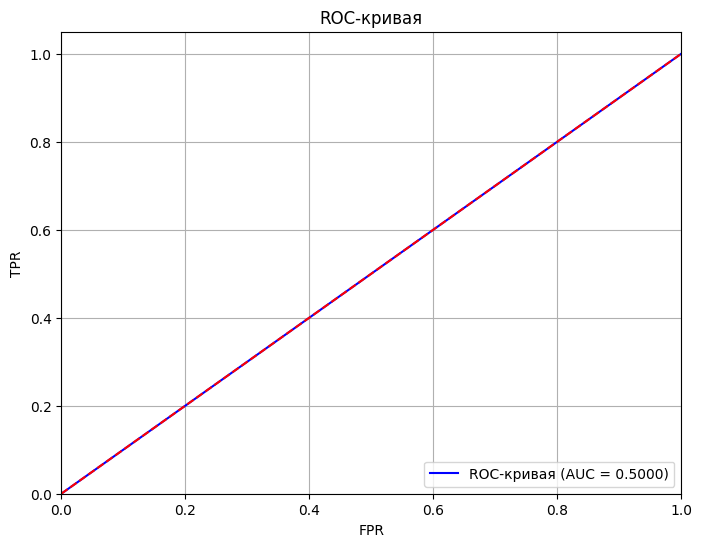

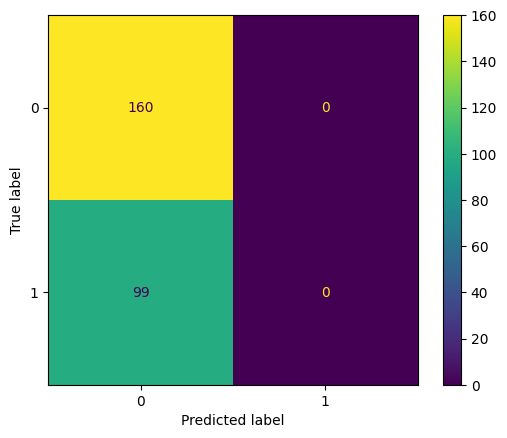

,rank_test_score,param_models,mean_test_score,params
0,1,DummyClassifier(random_state=42),0.500000,"{'models': DummyClassifier(random_state=42), '..."
1,1,DummyClassifier(random_state=42),0.500000,"{'models': DummyClassifier(random_state=42), '..."
3,1,DummyClassifier(random_state=42),0.500000,"{'models': DummyClassifier(random_state=42), '..."
4,1,"DummyClassifier(random_state=42, strategy='con...",0.500000,"{'models': DummyClassifier(random_state=42, st..."
2,5,DummyClassifier(random_state=42),0.467459,"{'models': DummyClassifier(random_state=42), '..."



CPU times: user 472 ms, sys: 130 ms, total: 603 ms
Wall time: 958 ms


In [ ]:
%%time

grid_search_dummy, results_dummy = find_best_model_grid(
    pipe_final,
    param_grid_dummy
)
print()

Dummy-модель со стратегией 'most_frequent' показала лучший результат. Во всех случая она предсказывала неизменность активности пользователей.

In [ ]:
# Сохраним результаты в соответствующие списки
pipelines_names.append('grid_search_dummy.best_estimator_')  # Сохраняем имя модели
pipelines.append(grid_search_dummy.best_estimator_)       # Сохраняем саму модель

# Получаем AUC
train_auc_cv.append(grid_search_dummy.best_score_)
valid_auc.append(roc_auc_score(y_valid, grid_search_dummy.best_estimator_.predict_proba(X_valid)[:,1]))

### Лучшая модель

Соберем статистику по обученным моделям в таблицу и выберем модель, которая лучше всего показала себя на тренировочной выборке.

In [ ]:
aggregated_stats = pd.DataFrame({
    'Модель': [pipeline.named_steps['models'] for pipeline in pipelines],
    'Обученный пайплайн': pipelines,
    'Пайплай хранится в переменной': pipelines_names,
    'ROC_AUC_CV (тренировочная)': train_auc_cv,
    'ROC_AUC (валидационная)': valid_auc
})

In [ ]:
# Создадим маски для максимума и второго максимума
mask_max = aggregated_stats['ROC_AUC_CV (тренировочная)'] == aggregated_stats['ROC_AUC_CV (тренировочная)'].max()
mask_second_max = aggregated_stats['ROC_AUC_CV (тренировочная)'] == aggregated_stats['ROC_AUC_CV (тренировочная)'].nlargest(2).iloc[-1]

# Функция для применения стилей
def highlight_max_and_second_max(s, mask_max, mask_second_max):
    styles = ['' for _ in range(len(s))]
    if mask_max.any():
        styles[mask_max.argmax()] = 'background-color: green'  # Максимум
    if mask_second_max.any():
        styles[mask_second_max.argmax()] = 'background-color: yellow'  # Второй максимум
    return styles

# Применим стилизацию
aggregated_stats_styled = aggregated_stats.style.apply(
    highlight_max_and_second_max,
    mask_max=mask_max,
    mask_second_max=mask_second_max,
    axis=0
)

# Отобразим стилизованный DataFrame
aggregated_stats_styled

,Модель,Обученный пайплайн,Пайплай хранится в переменной,ROC_AUC_CV (тренировочная),ROC_AUC (валидационная)
0,LogisticRegression(random_state=42),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', sparse_output=False))]), ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория']), ('ord', Pipeline(steps=[('simpleImputer_before_ord', SimpleI... ['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'предыдущий_месяц_минут', 'текущий_месяц_минут'])])), ('models', LogisticRegression(random_state=42))])",base_model,0.893879,0.927146
1,"DecisionTreeClassifier(max_depth=10, min_samples_leaf=15, min_samples_split=19, random_state=42)","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', sparse_output=False))]), ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория']), ('ord', Pipeline(steps=[('simpleImputer_before_ord', SimpleI... 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'предыдущий_месяц_минут', 'текущий_месяц_минут'])])), ('models', DecisionTreeClassifier(max_depth=10, min_samples_leaf=15, min_samples_split=19, random_state=42))])",randomized_search.best_estimator_,0.883639,0.892992
2,"DecisionTreeClassifier(max_depth=14, min_samples_leaf=10, min_samples_split=20, random_state=42)","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', sparse_output=False))]), ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория']), ('ord', Pipeline(steps=[('simpleImputer_before_ord', SimpleI... 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'предыдущий_месяц_минут', 'текущий_месяц_минут'])])), ('models', DecisionTreeClassifier(max_depth=14, min_samples_leaf=10, min_samples_split=20, random_state=42))])",optuna_models_dict['DecisionTreeClassifier'],0.883203,0.894539
3,KNeighborsClassifier(n_neighbors=20),"Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', sparse_output=False))]), ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория']), ('ord', Pipeline(steps=[('simpleImputer_before_ord', SimpleI... ['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'предыдущий_месяц_минут', 'текущий_месяц_минут'])])), ('models', KNeighborsClassifier(n_neighbors=20))])",optuna_models_dict['KNeighborsClassifier'],0.894139,0.904924
4,"LogisticRegression(C=9.05173001043461, penalty='l1', random_state=42, solver='liblinear')","Pipeline(steps=[('preprocessor', ColumnTransformer(remainder='passthrough', transformers=[('ohe', Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(drop='first', sparse_output=False))]), ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория']), ('ord', Pipeline(steps=[('simpleImputer_before_ord', SimpleI... 'длительн

Лучшая модель SVC, с соответствующими параметрами, была найдена с помощью OptunaSearchCV (выделена желтым цветом в таблице).

При попытке улучшить ее с помощью селектора признаков, качество модели на тренировочных данных при кросс-валидации немного выросло (выделена зеленым в таблице), однако метрика ROC_AUC на валидационной выборке наоборот снизилась. Это может говорить о том, что модель, вероятно, немного переобучилась на тренировочных данных и удалила лишние признаки, которые все же имели значение. В целом, разницы в метриках несущественные и можно было бы использовать любую из предложенных моделей.

Для дальнейшего анализа в качестве лучшей модели будем использовать исходную SVC модель (выделена желтым в таблице), т.к. предположительно она должна работь более устойчиво.

In [ ]:
# Запишем лучшую модель в переменную
best_model = optuna_models_dict['SVC']

Посмотрим, как покажет себя выбранная модель на тестовой выборке.

Матрица ошибок на тестовой выборке


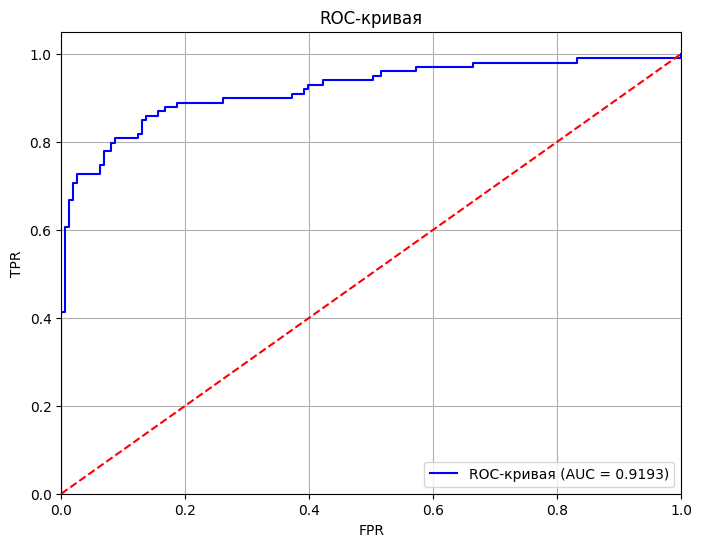

График ROC-AUC на тестовой выборке


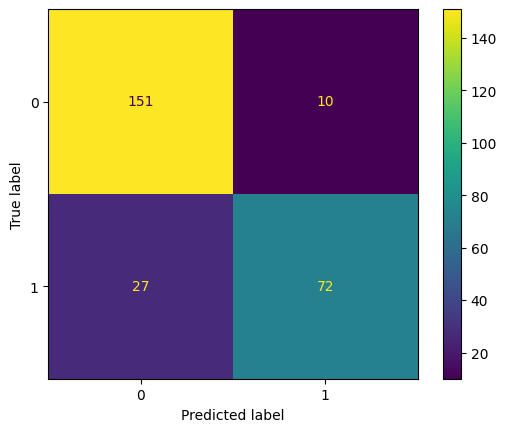

Метрика ROC-AUC на кросс-валидации (тренировочная выборка): 0.9150132506261286
Метрика ROC-AUC на валидационной выборке: 0.9131313131313131
Метрика ROC-AUC на тренировочной выборке: 0.9193173975782671


In [ ]:
y_valid_pred = best_model.predict(X_valid)
y_valid_proba = best_model.predict_proba(X_valid)[:, 1]

y_test_pred = best_model.predict(X_test)
y_test_proba = best_model.predict_proba(X_test)[:, 1]


# Построение ROC кривой и матрицы ошибок
print("Матрица ошибок на тестовой выборке")
plot_roc_curve(y_test, y_test_proba)
print("График ROC-AUC на тестовой выборке")
plot_confusion_matrix(best_model, X_test, y_test)

print(f'Метрика ROC-AUC на кросс-валидации (тренировочная выборка): {cross_val_score(best_model, X_train, y_train, cv=5, scoring="roc_auc").mean()}')
print(f'Метрика ROC-AUC на валидационной выборке: {roc_auc_score(y_valid, y_valid_proba)}')
print(f'Метрика ROC-AUC на тренировочной выборке: {roc_auc_score(y_test, y_test_proba)}')

Видим, что метрики на всех трех выборках почти совпадают, значит модель работает устойчиво.

Попробуем посмотреть, получится ли максимизировать Recall не потеряв в качестве модели.

Best threshold: 0.0
Accuracy: 0.38076923076923075
Recall: 1.0
Precision: 0.38076923076923075
ROC AUC: 0.9193173975782671


,Порог,Accuracy,Precision,Recall,Количество «правильных единичек»,Количество False Positive,Количество False Negative,"Количество ""правильных нулей"""
0,y_pred_0.000,0.380769,0.380769,1.000000,99,161,0,0
1,y_pred_0.010,0.392308,0.384314,0.989899,98,157,1,4
2,y_pred_0.020,0.446154,0.406639,0.989899,98,143,1,18
3,y_pred_0.030,0.484615,0.423581,0.979798,97,132,2,29
4,y_pred_0.040,0.515385,0.438914,0.979798,97,124,2,37
...,...,...,...,...,...,...,...,...
95,y_pred_0.960,0.761538,1.000000,0.373737,37,0,62,161
96,y_pred_0.970,0.742308,1.000000,0.323232,32,0,67,161
97,y_pred_0.980,0.723077,1.000000,0.272727,27,0,72,161
98,y_pred_0.990,0.684615,1.000000,0.171717,17,0,82,161


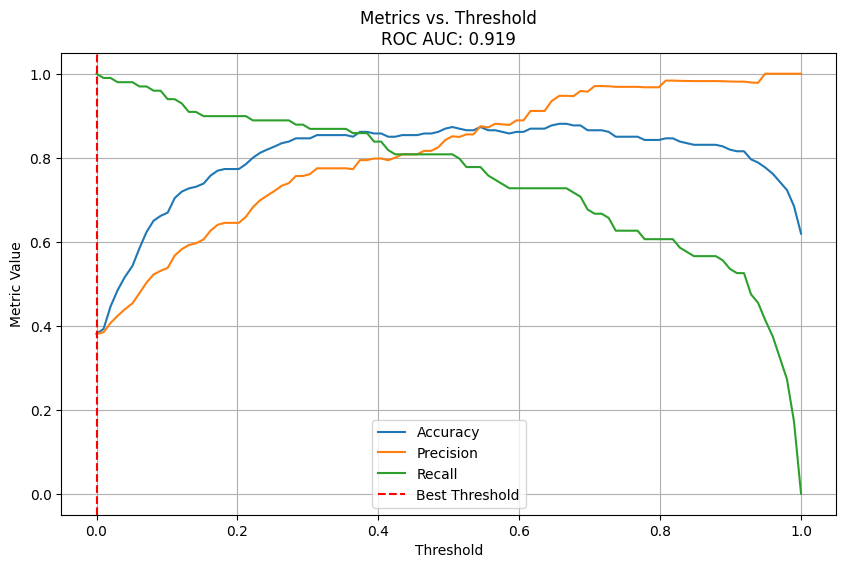

In [ ]:
best_threshold, best_precision, results_df = find_optimal_threshold_recall(best_model, X_test, y_test, num=100)

Видно, что максимальный Recall достигается при пороге классификации 0%, что эквивалентно просто проставлению моделью всем предсказанным значениям предсказаного класса 1 (активность уменьшилась). Это противоречит первоначальной задаче по выделению целевого сегмента для направления персонализированной рекламы. Получается, что персонализированную рекламу придется направлять всем клиентам.

В целом, метрики первоначальной модели с порогом классификации 50% удовлетворительные, не будем их менять и оставим модель как есть.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



Отлично.  Всё весьма информативно и наглядно




### Выводы

1. **Подготовка данных:**

- Исходная выборка была разбита на три: тренировочную, валидационную и тестовую в пропорции: 3-1-1 (60%-20%-20%)
- Целевая переменная была закодирована с помощью LabelEncoder.
- Категориальные признаки были закодированы OneHotEncoder и OrdinalEncoder (ранговые).
- Для масштабирования данных использовались: StandardScaler() и MinMaxScaler().

2. **Сборка пайплайна, подбор моделей и гиперпараметров:**

- Был создан пайплайн, для обработки данных, обучения моделей и получения предсказаний.
- Выбор лучшей модели производился из: KNeighborsClassifier(), DecisionTreeClassifier(), LogisticRegression(), SVC(), DummyClassifier().
- Для перебора моделей и гиперпараметров были использованы: RandomizedSearchCV(), GridSearchCV(), OptunaSearchCV().
- В результате поиска в качестве самой лучшей модели была выбрана модель со следующими параметрами:

In [ ]:
print(aggregated_stats.loc[5, "Модель"])
print(f'ROC_AUC_CV (тренировочная): {round(aggregated_stats.loc[5, "ROC_AUC_CV (тренировочная)"], 4)}')
print(f'ROC_AUC (валидационная): {round(aggregated_stats.loc[5, "ROC_AUC (валидационная)"], 4)}')
print(f'ROC_AUC (тестовая): {round(roc_auc_score(y_test, y_test_proba), 4)}')

SVC(C=89.31066986758924, gamma=0.2701807036080126, probability=True,
    random_state=42)
ROC_AUC_CV (тренировочная): 0.915
ROC_AUC (валидационная): 0.9131
ROC_AUC (тестовая): 0.9193


3. **Дальнейшее улучшение модели:**

- Для дальнейшего улучшения выбранной модели были попробованы:
 - Полиномизация признаков с помощью PolynomialFeatures();
 - Сэмплирование (устранение дизбаланса целевого класса) с помощью SMOTE().
- Сэмплирование и полиномизация не улучшили качество модели.
- Была сделана попытка подобрать порог классификации для минимизации ложноотрицательной ошибки (максимизации Recall), однако максимальное значение метрики Recall достигалось на пороге классификации 0%. При таком пороге всем пользователям предсказывалось бы снижение активности, что делает модель бессмысленной. Поэтому порог классификации был оставлен без изменений.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:

    
Отличный раздел    

- pipelines + ColumnTransformer + подбор гиперпараметров
- 'passthrough' не забыт
- drop='first’ указан
- 2 способа масштабирование и кодирования


Попробовал сверх того что требуется в проекте - это всегда приветствуется
    
     

<div class="alert alert-warning">


Совет 🤔:

  

- также можно провести оценку на адекватность прогноза, в качестве базовой используя константную. [Dummy Models](https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyClassifier.html), это удобная обертка для константных моделей. Сразу скажу что ничего интересного там не будет, зато можно будет дополнительно покопаться в вариантах стратегий наивных моделей


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Для интереса добавил выше, перед выбором лучшей модели. Спасибо!
</div>

## Анализ важности признаков лучшей модели

### SHAP

Оценим важность признаков для лучшей модели с помощью метода SHAP.

In [ ]:
best_preprocessor = best_model.named_steps['preprocessor']
models = best_model.named_steps['models']

In [ ]:
feature_names = best_preprocessor.get_feature_names_out()

In [ ]:
# Обработка данных
X_train_processed = best_preprocessor.fit_transform(X_train)
X_test_processed = best_preprocessor.transform(X_test)

# Преобразование обратно в DataFrame с сохранением названий колонок
X_train_processed = pd.DataFrame(X_train_processed, columns=best_preprocessor.get_feature_names_out())
X_test_processed = pd.DataFrame(X_test_processed, columns=best_preprocessor.get_feature_names_out())

# Проверка результатов
display(X_train_processed.head())
display(X_test_processed.head())

,ohe__тип_сервиса_стандарт,ohe__разрешить_сообщать_нет,ohe__популярная_категория_косметика и аксесуары,ohe__популярная_категория_кухонная посуда,ohe__популярная_категория_мелкая бытовая техника и электроника,ohe__популярная_категория_техника для красоты и здоровья,ohe__популярная_категория_товары для детей,ord__акционные_покупки_категория,num__маркет_актив_6_мес,num__маркет_актив_тек_мес,num__длительность,num__средний_просмотр_категорий_за_визит,num__неоплаченные_продукты_штук_квартал,num__ошибка_сервиса,num__страниц_за_визит,num__препредыдущий_месяц_выручка,num__предыдущий_месяц_выручка,num__текущий_месяц_выручка,num__предыдущий_месяц_минут,num__текущий_месяц_минут
0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.528009,-1.429866,-1.057681,1.284134,-0.935931,-1.129944,-0.322557,0.881455,-1.118709,-2.159349,-0.376414,1.420356
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.641460,-1.429866,1.019609,-0.944694,-0.935931,-0.102482,0.916942,0.717127,0.502791,0.448909,0.641771,0.453543
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.155771,1.397121,-0.829540,0.541191,-0.935931,1.438711,-0.570457,0.030470,-0.620282,-0.368317,0.387225,-1.721785
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.141367,1.397121,-1.393890,-1.687637,1.573448,-1.643675,-1.562057,-2.094060,-0.053725,-0.425102,-1.140052,-0.271566
4,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.438504,-0.016373,-0.401274,-0.201751,-0.434055,-0.102482,0.669043,1.262932,-0.420194,-1.197141,2.169048,0.453543


,ohe__тип_сервиса_стандарт,ohe__разрешить_сообщать_нет,ohe__популярная_категория_косметика и аксесуары,ohe__популярная_категория_кухонная посуда,ohe__популярная_категория_мелкая бытовая техника и электроника,ohe__популярная_категория_техника для красоты и здоровья,ohe__популярная_категория_товары для детей,ord__акционные_покупки_категория,num__маркет_актив_6_мес,num__маркет_актив_тек_мес,num__длительность,num__средний_просмотр_категорий_за_визит,num__неоплаченные_продукты_штук_квартал,num__ошибка_сервиса,num__страниц_за_визит,num__препредыдущий_месяц_выручка,num__предыдущий_месяц_выручка,num__текущий_месяц_выручка,num__предыдущий_месяц_минут,num__текущий_месяц_минут
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.141367,-0.016373,1.511915,-0.201751,-0.935931,1.952442,-0.570457,0.265224,-2.476294,-1.295609,-0.885506,-0.996676
1,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.254817,1.397121,1.011604,-0.944694,2.075324,0.924980,-0.818357,-1.565862,0.940259,0.982328,-0.885506,-1.238379
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.230872,-1.429866,-0.545363,2.027076,-0.935931,-0.616213,0.421143,-0.512400,-0.326246,-0.415920,-0.121868,1.178653
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.042321,1.397121,-0.653430,0.541191,-0.935931,0.411249,-0.818357,-0.465449,-0.888500,-1.316752,1.405409,0.211840
4,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.056725,-0.016373,1.475892,-0.944694,-1.437806,-1.129944,-0.818357,0.981226,-0.671918,-1.492424,1.150863,0.453543


Напомним группировку входящих признаков, попытаем понять изменения в какой группе признаков больше всего влияет на снижение активности:

![image.png](attachment:image.png)

In [ ]:
# Уменьшаем размер выборки с помощью k-means
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=RANDOM_STATE)
kmeans.fit(X_train_processed)
background_data = kmeans.cluster_centers_

# Создаем объект SHAP Permutation Explainer с уменьшенной выборкой
explainer = shap.PermutationExplainer(best_model.named_steps['models'].decision_function, background_data)

# Рассчитываем значения SHAP
shap_values = explainer(X_test_processed)

PermutationExplainer explainer: 261it [00:47,  4.55it/s]


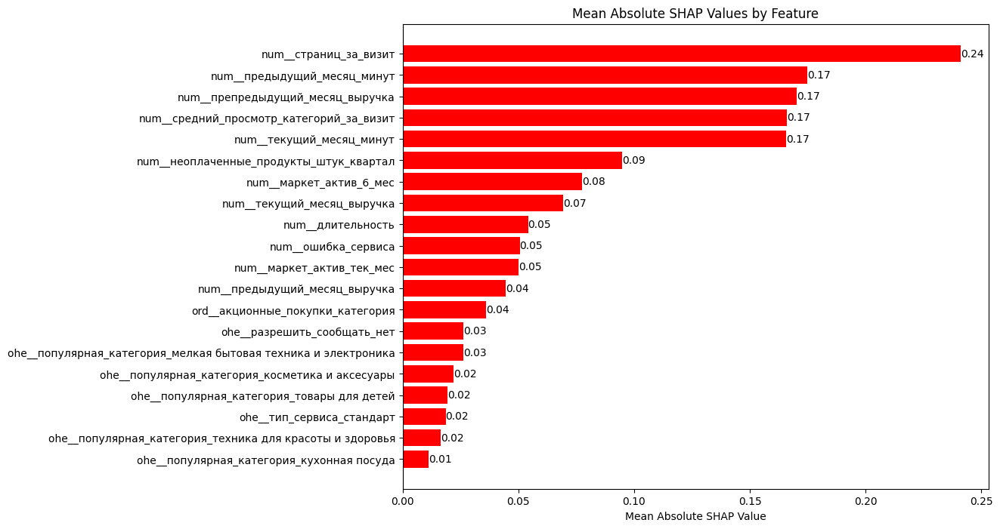

In [ ]:
shap_values_array = shap_values.values

# Сортируем абсолютные значения SHAP
mean_shap_values = np.mean(np.abs(shap_values_array), axis=0)
sorted_indices = np.argsort(mean_shap_values)[::-1]

# Пример имен признаков
feature_names = best_preprocessor.get_feature_names_out()

# Создаем график с увеличенной высотой
plt.figure(figsize=(10, 8))  # Увеличена высота графика
bars = plt.barh(np.array(feature_names)[sorted_indices], mean_shap_values[sorted_indices], color='red')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Mean Absolute SHAP Values by Feature')
plt.axvline(0, color='black', lw=0.8)
plt.gca().invert_yaxis()  # Инвертируем ось Y для правильного порядка

# Добавляем подписи значений
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.2f}',
             va='center')

plt.show()

График значений SHAP (Mean Absolute SHAP Values) демонстрирует, как каждый параметр влияет на модель, предсказывающую снижение активности покупателей. Вот основные моменты анализа:

**Ключевые параметры:**
- `num_страниц_за_визит` (0.24): Это значение наибольшее, что указывает на то, что количество страниц, просматриваемых за один визит, сильно влияет на предсказание. Чем больше страниц, тем выше вероятность снижения активности.
- `num_предыдущий_месяц_минут` (0.18): Время, проведенное в предыдущем месяце, также имеет заметное влияние.
- `num_препредыдущий_месяц_выручка` (0.17): Выручка в препредыдущем месяце влияет на активность пользователей спустя 2 месяца.
- `num_средний_просмотр_категорий_за_визит` (0.17): Средний просмотр категорий за визит характеризует продуктовое поведение покупателя, также важен для предсказания вероятности снижения активности пользователя.
- `num_текущий_месяц_минут` (0.17): Второй по значимости параметр, показывающий, что время, проведенное в текущем месяце, также важно для предсказаний.


**Параметры со средним влиянием:**
- Параметры, такие `num_неоплаченные_продукты_штук_квартал` (0.09) и `num_маркет_актив_6_мес` (0.08), имеют среднее влияние на предсказания, что значит, что они также важны, но не так критичны, как первые три.

**Низкое влияние:**
- Параметры, такие как `популярная_категория` или `тип_сервис`, имеют минимальное влияние на модель, что может указывать на их незначимость в контексте предсказания активности.


Необходимо сфокусироваться на ключевых параметрах, так как они могут предоставить наиболее ценную информацию для улучшения стратегии взаимодействия с клиентами.

Параметры с низким значением могут быть исключены из модели или требуют дополнительного анализа, чтобы понять, почему они не влияют на предсказания.

In [ ]:
# Посмотрим какие категории признаков влияют на предсказания активности пользователя больше всего
shap_values_df = pd.DataFrame(data=[np.array(feature_names)[sorted_indices], mean_shap_values[sorted_indices]],
                              index=['Входящий признак', 'абсолютный SHAP value']).T
shap_values_df['абсолютный SHAP value'] = shap_values_df['абсолютный SHAP value'].astype('float')

In [ ]:
# Добавим в таблицу категорию признака
feature_groups = {
    "Коммуникация с клиентом": [
        'ohe__тип_сервиса_стандарт',
        'ohe__разрешить_сообщать_нет',
        'num__маркет_актив_6_мес',
        'num__маркет_актив_тек_мес',
        'num__длительность'

    ],
    "Продуктовое поведение": [
        'ohe__популярная_категория_мелкая бытовая техника и электроника',
        'ohe__популярная_категория_техника для красоты и здоровья',
        'ohe__популярная_категория_косметика и аксесуары',
        'ohe__популярная_категория_товары для детей',
        'ohe__популярная_категория_кухонная посуда',
        'ord__акционные_покупки_категория',
        'num__неоплаченные_продукты_штук_квартал',
        'num__средний_просмотр_категорий_за_визит'

    ],
    "Поведение на сайте": [
        'num__текущий_месяц_минут',
        'num__предыдущий_месяц_минут',
        'num__страниц_за_визит',
        'num__ошибка_сервиса'
    ],
    "Финансовое поведение": [
        'num__текущий_месяц_выручка',
        'num__предыдущий_месяц_выручка',
        'num__препредыдущий_месяц_выручка'
    ]
}

In [ ]:
# Обратный словарь для поиска категорий по признакам
feature_to_category = {feature: category for category, features in feature_groups.items() for feature in features}

# Добавление столбца с категориями
shap_values_df['Категория'] = shap_values_df['Входящий признак'].map(feature_to_category)

shap_values_df

,Входящий признак,абсолютный SHAP value,Категория
0,num__страниц_за_визит,0.240925,Поведение на сайте
1,num__предыдущий_месяц_минут,0.174682,Поведение на сайте
2,num__препредыдущий_месяц_выручка,0.170116,Финансовое поведение
3,num__средний_просмотр_категорий_за_визит,0.165894,Продуктовое поведение
4,num__текущий_месяц_минут,0.165767,Поведение на сайте
5,num__неоплаченные_продукты_штук_квартал,0.094859,Продуктовое поведение
6,num__маркет_актив_6_мес,0.077624,Коммуникация с клиентом
7,num__текущий_месяц_выручка,0.069249,Финансовое поведение
8,num__длительность,0.054176,Коммуникация с клиентом
9,num__ошибка_сервиса,0.050588,Поведение на сайте


In [ ]:
# Найдем сумму коэффициентов abs SHAP values по категориям и нормализуем ее.
(shap_values_df.groupby('Категория')['абсолютный SHAP value'].sum().sort_values(ascending=False) /
    shap_values_df['абсолютный SHAP value'].sum())

,абсолютный SHAP value
Категория,
Поведение на сайте,0.411822
Продуктовое поведение,0.255473
Финансовое поведение,0.185051
Коммуникация с клиентом,0.147654


Видим, что больше всего влияет на активность пользователя влияет его поведение на сайте и продуктовое поведение.

Вероятно, что для удержания клиентов нужно сфокусироваться на удержании его на сайте и увеличить просмотр различных категорий товаров. В качестве вариантов увеличения такой активности можно рассмотреть следующие варианты:

**1. Персонализированные рекомендации:** Использовать данные о популярности категорий и предпочтениях пользователей для создания персонализированных страниц с рекомендациями продуктов.

**2. Улучшение навигации:** Оптимизировать структуру сайта, чтобы пользователи могли легко находить интересующие их категории, особенно популярные.

**3. Акции и специальные предложения:** Разработать акции для категорий с высоким интересом пользователей.

**4. Интерактивный контент на сайте:** Внедрить розыгрышы или опросы, чтобы вовлечь пользователей и помочь им выбрать продукты на основе их предпочтений.

**5. Улучшение пользовательского опыта (UX):** Сократить время загрузки страниц и улучшите адаптивность сайта для мобильных устройств, чтобы увеличить время, проведенное пользователями на сайте.

Посмотрим подробней на то, как каждый признак в отдельности влияет на предсказание вероятности снижения активности пользователя.

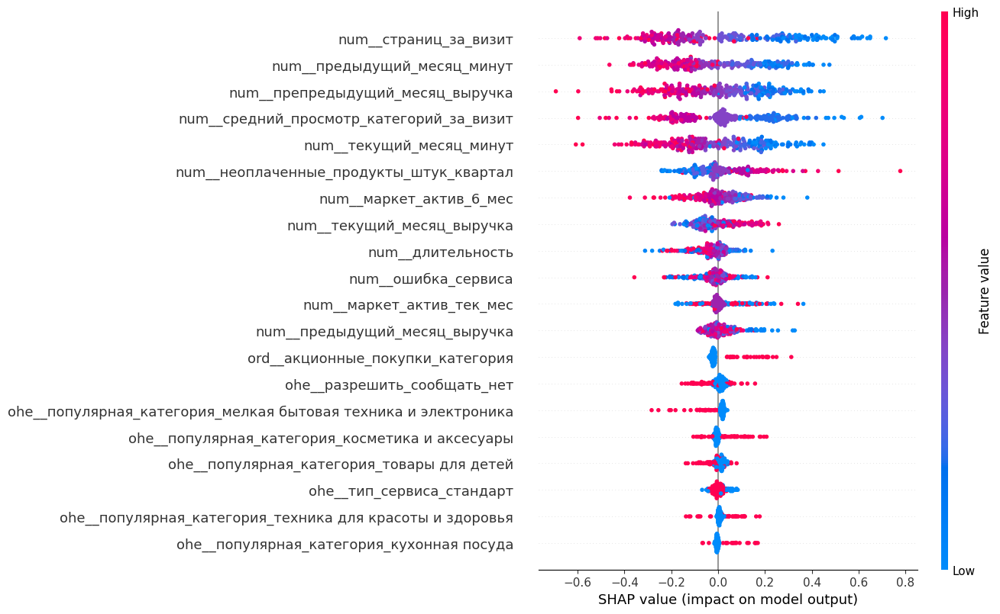

In [ ]:
shap.plots.beeswarm(shap_values, max_display=22)

Существенно уменьшают вероятность снижения активости пользователя следующие факторы:
- Среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.
- Количество минут, проведённых на сайте в текущем и предыдущем месяце.
- Средний просмотр категорий за визит в течение последнего месяца.
- Выручка за предпредыдущий месяц (т.е. снижение выручки в текущем месяце вероятно приведет к снижение покупательской активности через 2 месяца).
- Среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев.

Следовательно, чтобы удержать активных пользователей, необходимо в первую очередь ориентироваться на эти признаки, когда будем искать наш целевой сегмент.

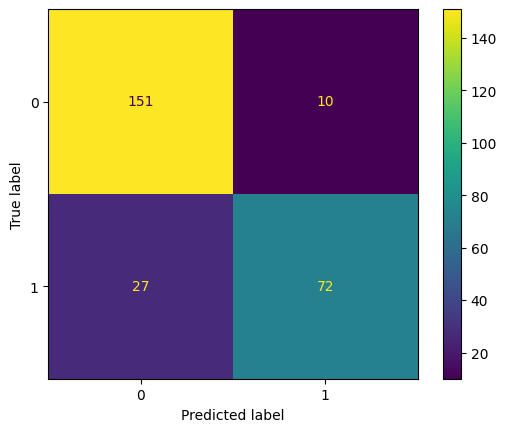

In [ ]:
# Посмотрим подробней на confusion matrix и на значения, в которых модель делала ошибочные предсказания
plot_confusion_matrix(best_model, X_test, y_test)

In [ ]:
# Подтянем в X_test предсказанные и фактические значения целевого признака
X_test_full = pd.DataFrame(X_test)

y_test_proba = best_model.predict_proba(X_test)[:,1]
y_test_pred = best_model.predict(X_test)

X_test_full['вероятность_снижения_покупательской_активности'] = y_test_proba
X_test_full['предсказанная_покупательская_активность'] = y_test_pred
X_test_full['реальная_покупательская_активность'] = y_test

X_test_full = X_test_full.reset_index()

In [ ]:
X_test_full.head()

,id,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,вероятность_снижения_покупательской_активности,предсказанная_покупательская_активность,реальная_покупательская_активность
0,215746,премиум,да,4.4,4,987,техника для красоты и здоровья,3,1,8,6,3222.0,4932.0,4169.7,10,9,без_акций,0.506941,0,1
1,215616,стандарт,нет,4.0,5,862,товары для детей,2,7,6,5,5604.0,4308.0,6055.1,10,8,без_акций,0.980116,1,1
2,215951,стандарт,да,5.5,3,473,домашний текстиль,6,1,3,10,4721.0,4667.0,4897.8,13,18,без_акций,0.082443,0,0
3,216224,стандарт,да,4.3,5,446,мелкая бытовая техника и электроника,4,1,5,5,4329.0,4683.0,4152.2,19,14,без_акций,0.017617,0,0
4,216235,премиум,нет,4.2,4,978,кухонная посуда,2,0,2,5,4480.0,5176.0,4006.8,18,15,без_акций,0.106334,0,0


Посмотрим на отдельные примеры неверно классифицированных объектов. Для этого отфильтруем такие наблюдения по двум критериям:

- Истинное значение целевого признака — 1 (активность снизилась)
- Вероятность принадлежность к классу 1 была оценена ниже чем 0.3 (модель предсказала, что активность не изменится)

In [ ]:
X_test_full[(X_test_full['реальная_покупательская_активность']==1)&(X_test_full['вероятность_снижения_покупательской_активности']<0.3)].sort_values(by='вероятность_снижения_покупательской_активности')

,id,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,вероятность_снижения_покупательской_активности,предсказанная_покупательская_активность,реальная_покупательская_активность
251,215825,премиум,да,4.3,4,951,домашний текстиль,3,3,4,10,5063.5,5053.0,5202.6,17,15,без_акций,0.000754,0,1
68,215802,стандарт,да,3.4,4,698,кухонная посуда,4,3,4,11,4955.0,5154.0,5257.9,11,20,без_акций,0.024487,0,1
201,215677,премиум,да,4.6,4,993,домашний текстиль,2,3,9,11,4829.0,4538.0,5211.2,17,16,без_акций,0.059209,0,1
234,215913,стандарт,нет,4.0,4,243,косметика и аксесуары,2,2,6,13,4640.0,4995.0,5078.1,16,12,без_акций,0.077451,0,1
164,215907,стандарт,да,6.6,3,839,косметика и аксесуары,3,3,4,15,4830.0,4779.0,4915.8,14,11,без_акций,0.093600,0,1
121,215925,стандарт,нет,4.9,4,450,мелкая бытовая техника и электроника,2,2,4,13,4458.0,5028.0,4094.0,23,12,без_акций,0.098287,0,1
134,215824,стандарт,нет,3.9,5,852,косметика и аксесуары,3,0,2,7,4950.5,4781.0,5227.4,15,12,без_акций,0.112994,0,1
77,215806,стандарт,нет,5.8,3,660,товары для детей,4,1,3,12,4787.5,4507.0,5160.6,16,7,без_акций,0.125937,0,1
53,215810,стандарт,нет,4.4,4,417,товары для детей,3,0,6,10,5515.0,4663.0,6383.4,16,10,без_акций,0.129856,0,1
165,215939,стандарт,да,2.6,3,966,товары для детей,3,1,6,9,4709.5,5509.0,4146.6,15,22,без_акций,0.145988,0,1


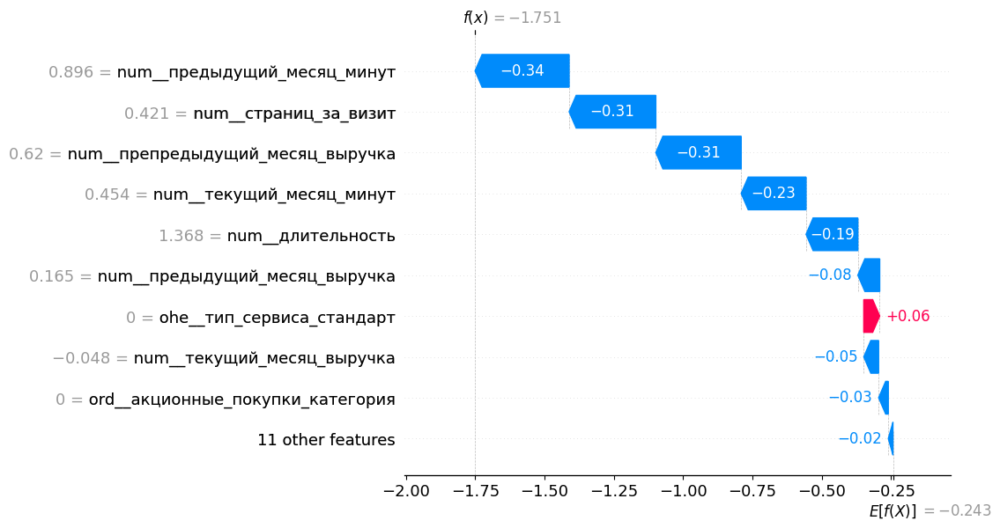

In [ ]:
shap.plots.waterfall(shap_values[251])

Поведение на сайте и продуктовое поведение данного пользователя достаточно хорошие (много времени проводит на сайте, выручка в последние месяцы выросла и т.д.), поэтому модель не предсказала снижение его активности, хотя фактически это произошло.

Также посмотрим случай, когда модель ошиблась, предсказав снижение активности, а его не произошло:

In [ ]:
X_test_full[(X_test_full['реальная_покупательская_активность']==0)&(X_test_full['вероятность_снижения_покупательской_активности']>0.7)].sort_values(by='вероятность_снижения_покупательской_активности', ascending=False)

,id,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,вероятность_снижения_покупательской_активности,предсказанная_покупательская_активность,реальная_покупательская_активность
103,216636,премиум,да,2.4,4,996,кухонная посуда,3,4,5,6,5644.5,4860.0,6454.4,10,14,без_акций,0.945345,1,0
16,216115,стандарт,нет,4.4,4,808,мелкая бытовая техника и электроника,4,2,0,3,4802.5,4543.0,5157.4,11,9,без_акций,0.806865,1,0
194,215764,стандарт,да,4.0,4,539,косметика и аксесуары,2,2,5,7,5878.5,4359.0,7325.4,15,5,без_акций,0.701301,1,0


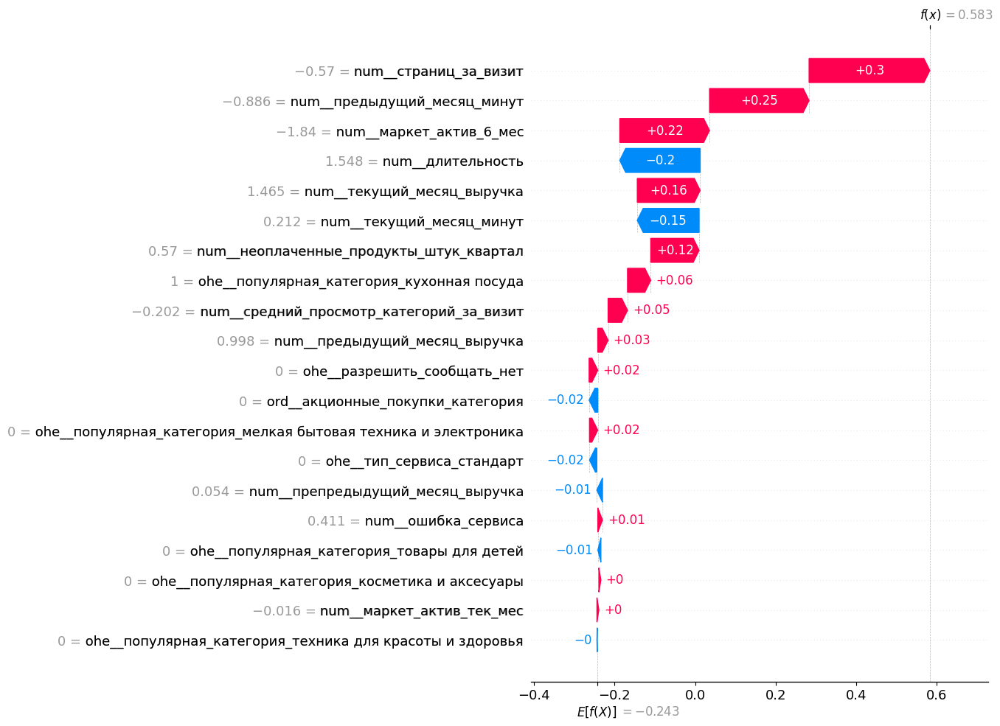

In [ ]:
shap.plots.waterfall(shap_values[103], max_display=22)

Данный пользователь проявляет большу активность на сайте, проводит нанем много времени и посещает много страниц, получает много маркетинговых сообщений и выручка от него в последнем месяце сильно выросла. Поэтому модель и не смогла предсказать снижение его активности.

### Permutation importance

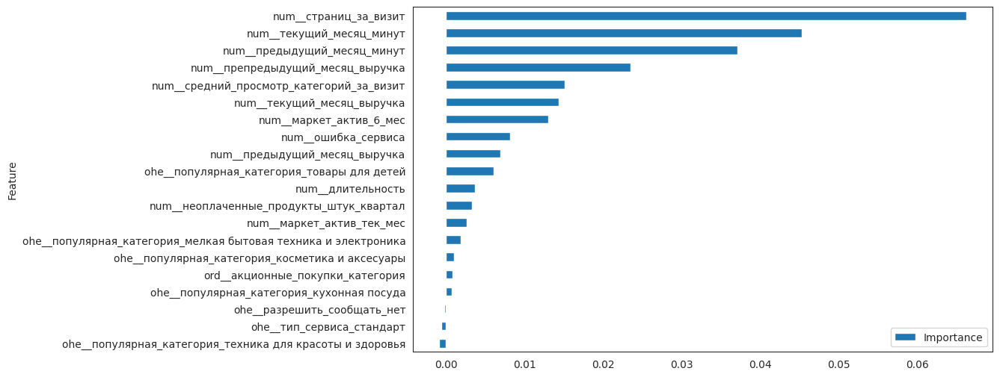

In [ ]:
# Оценка важности признаков
result = permutation_importance(best_model.named_steps['models'], X_test_processed, y_test, scoring='roc_auc', random_state=RANDOM_STATE)



feature_importance = pd.DataFrame({'Feature': X_test_processed.columns, 'Importance': result['importances_mean']})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
sns.set_style('white')
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))
plt.show()

Проверим важность признаков после их перестановки.

**Сохранение важности:**
Важность признаков не изменилась после перестановки, это может указывать на то, что модель действительно стабильно оценивает их значимость.

**Адекватность уровня обучения:**
Сохранение значимости признаков может свидетельствовать о том, что модель адекватно обучилась на тренировочной выборке.

### Выводы

**Важные факторы для удержания пользователей**
- Среднее количество страниц, просмотренных за визит.
- Время, проведенное на сайте в текущем и предыдущем месяце.
- Средний просмотр категорий за визит.
- Выручка за предпредыдущий месяц.
- Среднемесячное значение маркетинговых коммуникаций.

Адекватность предсказаний модели проверена на лодноположительных и ложноотрицательных ошибках, важность признаков не изменилась после перестановки.

  
    
<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



- есть график важности факторов, график аккуратный
    
    
- есть выводы о том, какие факторы сильнее/слабее влияют
    

- плюс за использование .beeswarm,  ведь он даёт гораздо больше информации    
    
    
-  permutation_importance   
     
     


## Сегментация покупателей

Выделим нужный нам сегмент покупателей, проанализируем его и предложим, как увеличить его покупательскую активность. Используем данные моделирования, данные о прибыли покупателей и исходные данные (если понадобятся).

Ниже несколько примеров сегментов, перечисленные в задании:

- Группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.
- Группа клиентов, которые покупают только технику, то есть товары с длинным жизненным циклом.
- Группа клиентов, которые покупают товары из категории «Товары для себя» (новая категория, которую можно выделить на основе текущих) или «Товары для детей».
- Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью.

Одной из задач исследования является поиск сегмента постоянных клиентов, чтобы по возможности удерживать активность с помощью персонализированной рекламы. Попробуем найти такой сегмент.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



отличное начало,  сразу прописал логику своих дальнейших действий




### Сегменты покупателей

Добавим к исходной таблице информацию о прибыли, полученной с каждого клиента.

In [ ]:
print(market.shape)
print(money.shape)

(1296, 17)
(1299, 2)


In [ ]:
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория
id,,,,,,,,,,,,,,,,,
215349,снизилась,премиум,да,4.4,4,819,товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10,по_акциям
215350,снизилась,стандарт,нет,4.9,3,539,домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13,без_акций
215351,снизилась,стандарт,да,3.2,5,896,товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13,по_акциям
215352,снизилась,стандарт,нет,5.1,3,1064,товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11,по_акциям
215353,снизилась,стандарт,да,3.3,4,762,домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10,без_акций


In [ ]:
money.head()

,id,прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


In [ ]:
money = money.set_index('id')

In [ ]:
money.head()

,прибыль
id,
215348,0.98
215349,4.16
215350,3.13
215351,4.87
215352,4.21


In [ ]:
market_full = market.merge(money, how='left', left_index=True, right_index=True)

In [ ]:
market_full.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,прибыль
id,,,,,,,,,,,,,,,,,,
215349,снизилась,премиум,да,4.4,4,819,товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10,по_акциям,4.16
215350,снизилась,стандарт,нет,4.9,3,539,домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13,без_акций,3.13
215351,снизилась,стандарт,да,3.2,5,896,товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13,по_акциям,4.87
215352,снизилась,стандарт,нет,5.1,3,1064,товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11,по_акциям,4.21
215353,снизилась,стандарт,да,3.3,4,762,домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10,без_акций,3.95


In [ ]:
market_full.shape

(1296, 18)

In [ ]:
market_full.isna().sum()

,0
покупательская_активность,0
тип_сервиса,0
разрешить_сообщать,0
маркет_актив_6_мес,0
маркет_актив_тек_мес,0
длительность,0
популярная_категория,0
средний_просмотр_категорий_за_визит,0
неоплаченные_продукты_штук_квартал,0
ошибка_сервиса,0


Данные успешно подтянулись.

Отдельно также подтянем данные о прибыли в тестовую выборку.

In [ ]:
X_test_full = X_test_full.merge(money, how='left', left_on='id', right_index=True)

In [ ]:
X_test_full.head()

,id,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,...,предыдущий_месяц_выручка,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,вероятность_снижения_покупательской_активности,предсказанная_покупательская_активность,реальная_покупательская_активность,прибыль
0,215746,премиум,да,4.4,4,987,техника для красоты и здоровья,3,1,8,...,3222.0,4932.0,4169.7,10,9,без_акций,0.506941,0,1,3.26
1,215616,стандарт,нет,4.0,5,862,товары для детей,2,7,6,...,5604.0,4308.0,6055.1,10,8,без_акций,0.980116,1,1,3.49
2,215951,стандарт,да,5.5,3,473,домашний текстиль,6,1,3,...,4721.0,4667.0,4897.8,13,18,без_акций,0.082443,0,0,4.29
3,216224,стандарт,да,4.3,5,446,мелкая бытовая техника и электроника,4,1,5,...,4329.0,4683.0,4152.2,19,14,без_акций,0.017617,0,0,3.99
4,216235,премиум,нет,4.2,4,978,кухонная посуда,2,0,2,...,4480.0,5176.0,4006.8,18,15,без_акций,0.106334,0,0,4.37


In [ ]:
X_test_full.shape

(260, 21)

Для начала произведем сегментацию клиентов по категориям, указанным в задании:
- Группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.
- Группа клиентов, которые покупают только технику, то есть товары с длинным жизненным циклом.
- Группа клиентов, которые покупают товары из категории «Товары для себя» (новая категория, которую можно выделить на основе текущих) или «Товары для детей».
- Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью.

#### Сегментация 1: Группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.

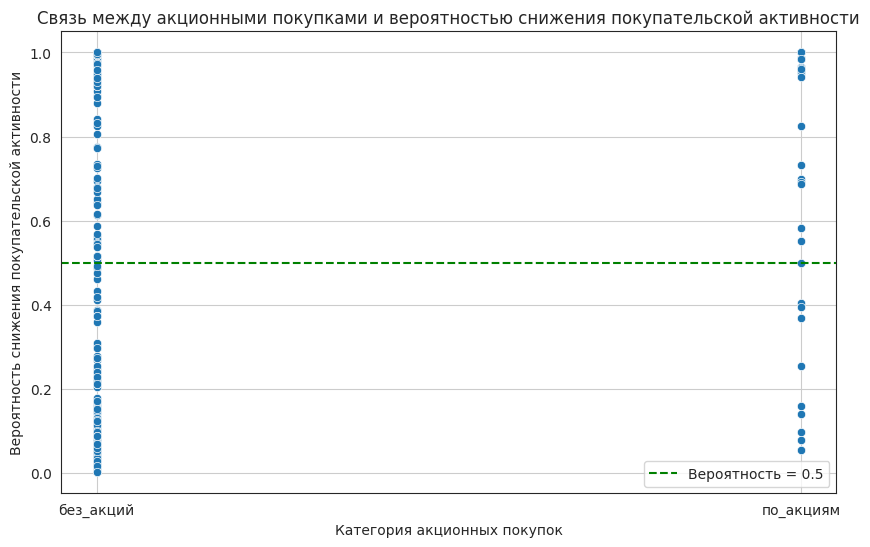

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=X_test_full, x='акционные_покупки_категория', y='вероятность_снижения_покупательской_активности')
plt.title('Связь между акционными покупками и вероятностью снижения покупательской активности')
plt.xlabel('Категория акционных покупок')
plt.ylabel('Вероятность снижения покупательской активности')

# Добавляем горизонтальную линию
plt.axhline(y=0.5, color='green', linestyle='--', label='Вероятность = 0.5')

plt.grid(True)
plt.legend()
plt.show()

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>



Совет 🤔:


Может просто столбиковые графики использовать,  посчитав средние значения для 4 вараинтов?

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Тут уже не менял, но в целом согласен что scatter не очень наглядный для категориальных данных. Изначально строил по доли покупок по акциям (первоначальный столбец, до конвертации его в категориальный). Возможно стоило его подтянуть для наглядности.
</div>

**Сегментация 1:**

|                                    | Высокая вероятность снижения активности | Низкая вероятность снижения активности |
|------------------------------------|------------------------------|-----------------------------|
| **Высокая доля покупок по акциям** | Группа 1                     | Группа 3                    |
| **Низкая доля покупок по акциям**  | Группа 2                     | Группа 4                    |


**Группа 1:** Высокая вероятность снижения активности и высокая доля покупок по акциям
Эта группа характеризуется потребителями, которые активно участвуют в акциях и скидках, но, несмотря на это, существует высокая вероятность снижения их покупательской активности. Возможно, они реагируют на временные предложения, но в долгосрочной перспективе могут потерять интерес к бренду или продукту.

**Группа 2:** Низкая вероятность снижения активности и высокая доля покупок по акциям
Потребители этой группы активно участвуют в акциях и скидках, но при этом их покупательская активность стабильна. Это означает, что они не только реагируют на предложения, но и демонстрируют лояльность к бренду, что делает их ценными клиентами.

**Группа 3:** Высокая вероятность снижения активности и низкая доля покупок по акциям
В этой группе находятся потребители, которые не очень заинтересованы в акциях и скидках, и их активность, скорее всего, снизится. Это может быть связано с недостаточным интересом к продукту или нерегулярным использованием услуг.

**Группа 4:** Низкая вероятность снижения активности и низкая доля покупок по акциям
Потребители этой группы не участвуют в акциях и имеют низкую активность. Они могут быть менее заинтересованы в продукте или бренде, что делает их менее предсказуемыми и потенциально трудными для привлечения.

Нас интересует группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности, т.е. Группа 1. Произведем сегментацию и посмотрим средние финансовые показатели каждой группы.

In [ ]:
def segnmentation_1(row):
    """
    Определяет группу сегментации на основе вероятности снижения покупательской активности
    и категории акционных покупок.

    Параметры:
    row: объект Series (например, строка DataFrame), содержащий данные о клиенте,
         включая вероятность снижения покупательской активности и категорию акционных покупок.

    Возвращает:
    str: Название группы ('Группа 1', 'Группа 2', 'Группа 3' или 'Группа 4').
    """

    # Проверяем, превышает ли вероятность снижения покупательской активности 0.5
    if row['вероятность_снижения_покупательской_активности'] >= 0.5:
        # Если вероятность высокая и покупка по акциям
        if row['акционные_покупки_категория'] == 'по_акциям':
            return 'Группа 1'  # Группа для клиентов с высокой вероятностью снижения активности
        else:
            return 'Группа 2'  # Группа для клиентов с высокой вероятностью, но без акционных покупок
    else:
        # Если вероятность ниже 0.5 и покупка по акциям
        if row['акционные_покупки_категория'] == 'по_акциям':
            return 'Группа 3'  # Группа для клиентов с низкой вероятностью снижения активности, но с акциями
        else:
            return 'Группа 4'  # Группа для клиентов с низкой вероятностью и без акционных покупок

In [ ]:
X_test_full['сегментация_1'] = X_test_full.apply(segnmentation_1, axis=1)

In [ ]:
# СОставим таблицу с финансовой статистикой по каждой группе
segment_1_stats = X_test_full.groupby('сегментация_1')[['препредыдущий_месяц_выручка',
       'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'прибыль']].mean()

In [ ]:
# Добавляем долю пользователей в результирующую таблицу
segment_1_stats['доля_пользователей'] = segment_1_stats.index.map(X_test_full['сегментация_1'].value_counts(normalize=True))

In [ ]:
segment_1_stats

,препредыдущий_месяц_выручка,предыдущий_месяц_выручка,текущий_месяц_выручка,прибыль,доля_пользователей
сегментация_1,,,,,
Группа 1,4714.120000,5062.680000,5350.136000,3.954800,0.096154
Группа 2,4605.442857,4810.885714,5188.851429,4.060286,0.269231
Группа 3,4862.000000,5129.666667,5616.155556,3.187778,0.034615
Группа 4,4938.826923,4886.342949,5133.951282,4.021859,0.600000


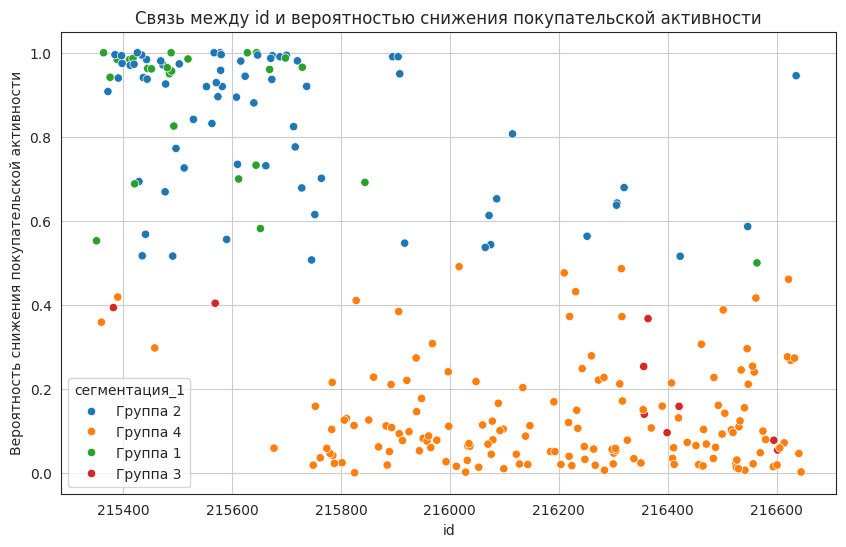

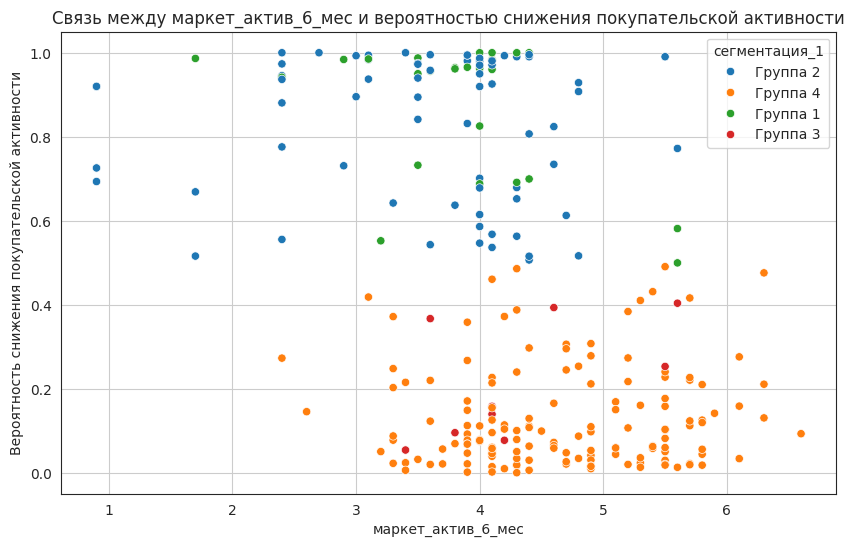

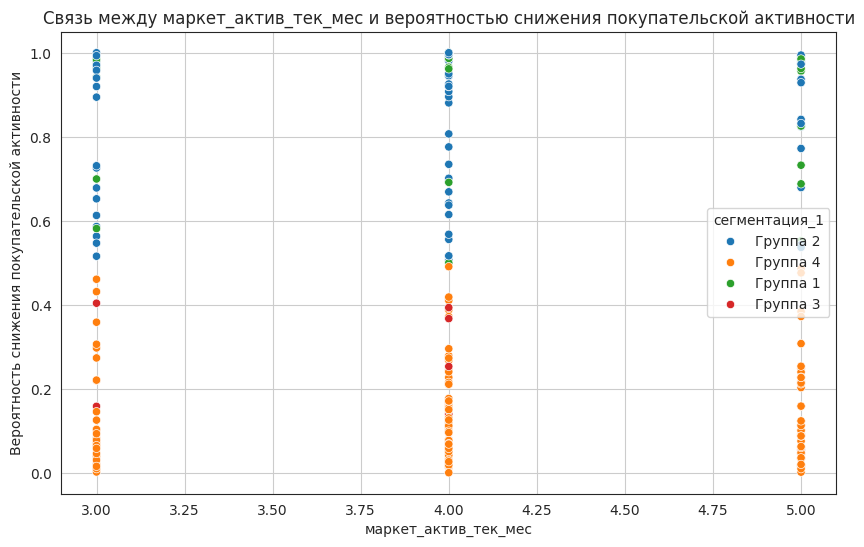

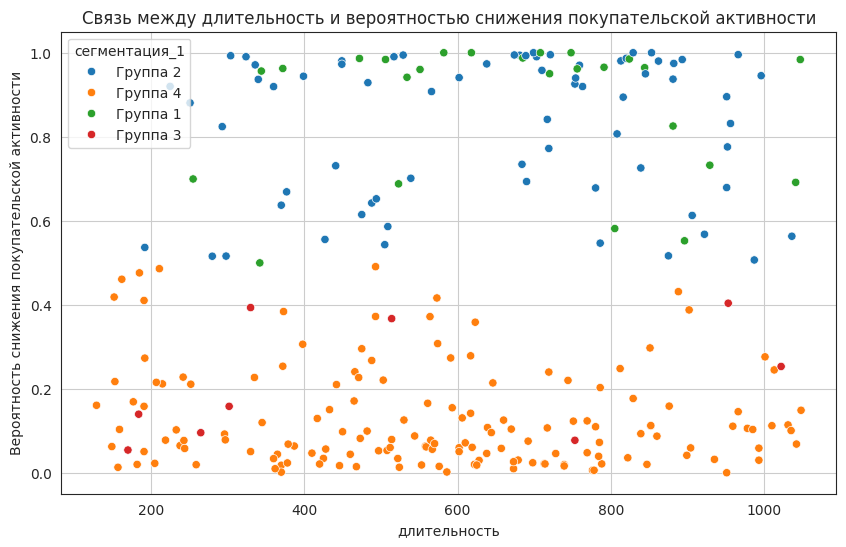

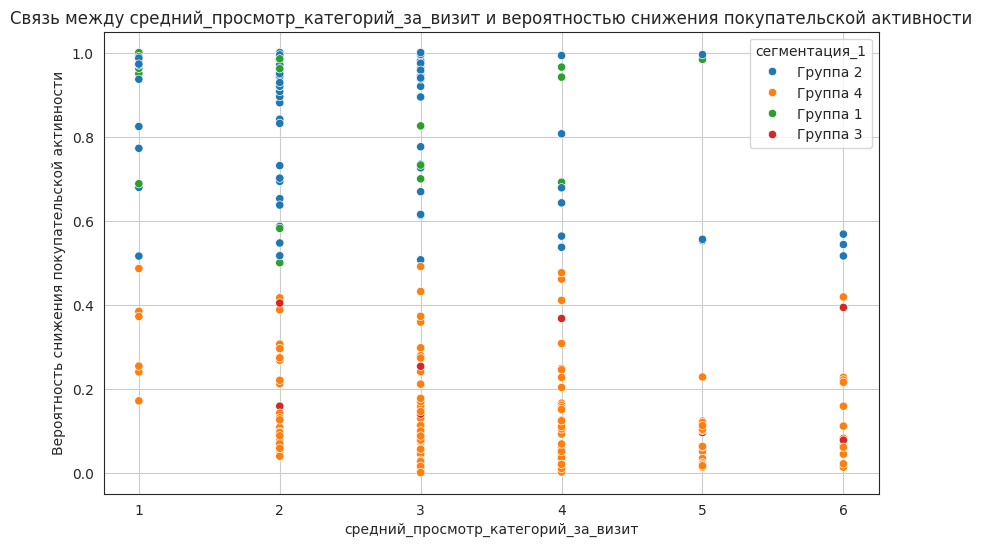

...

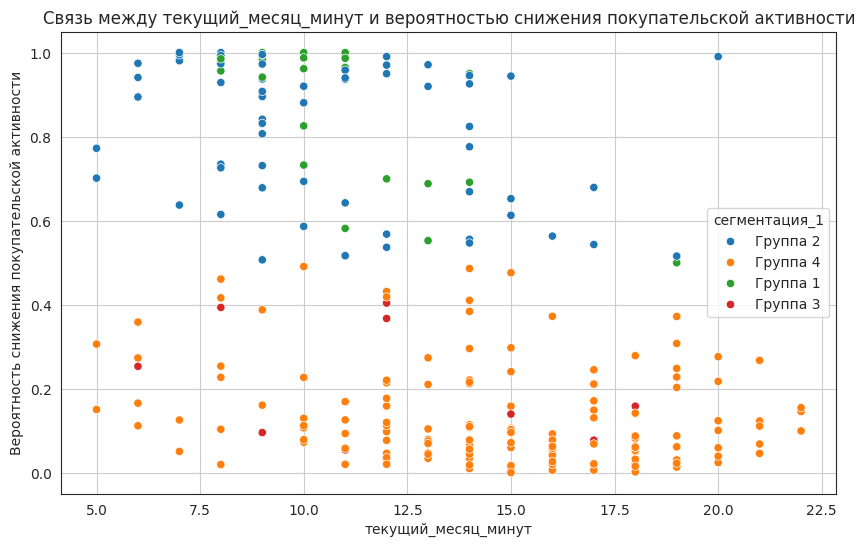

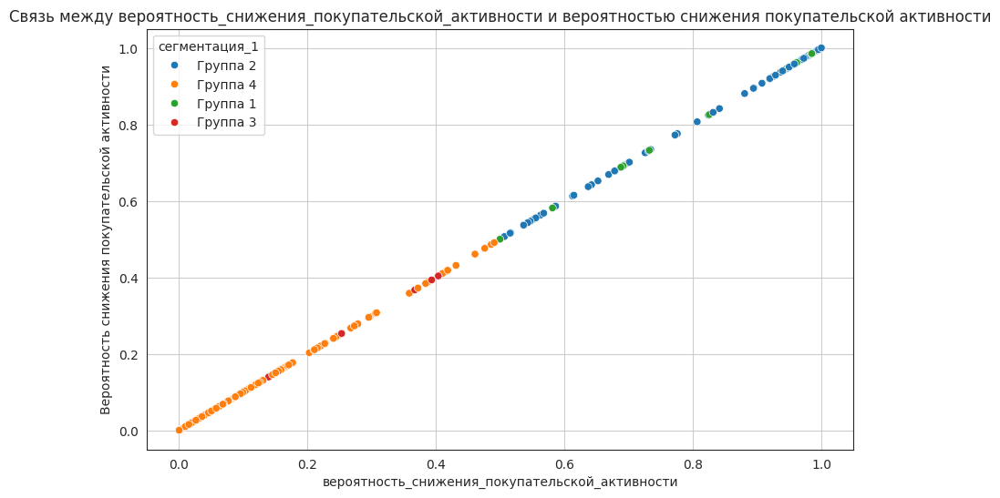

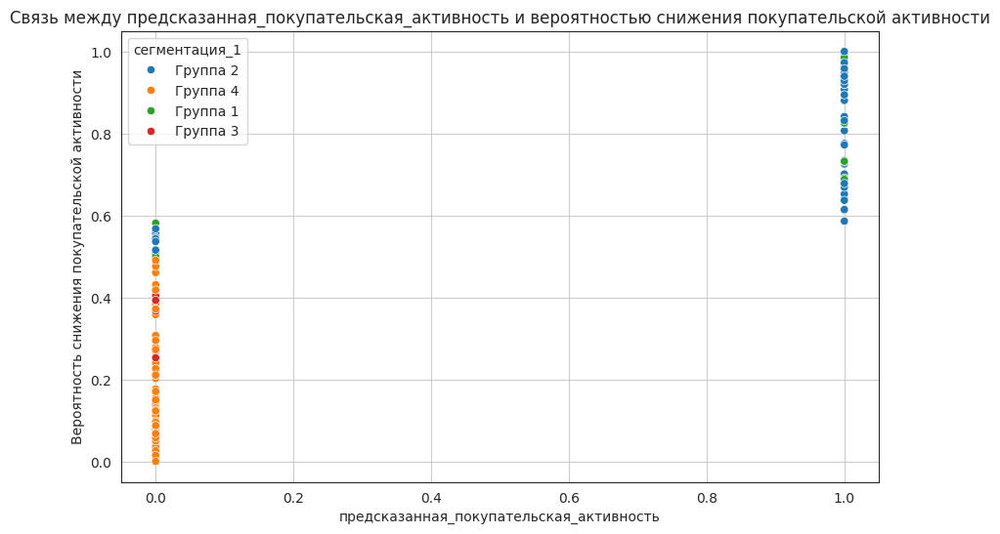

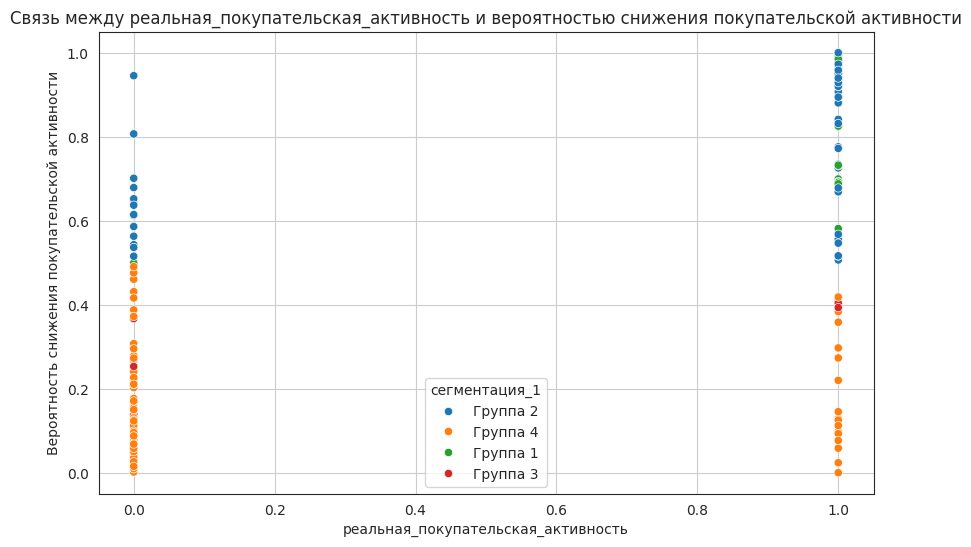

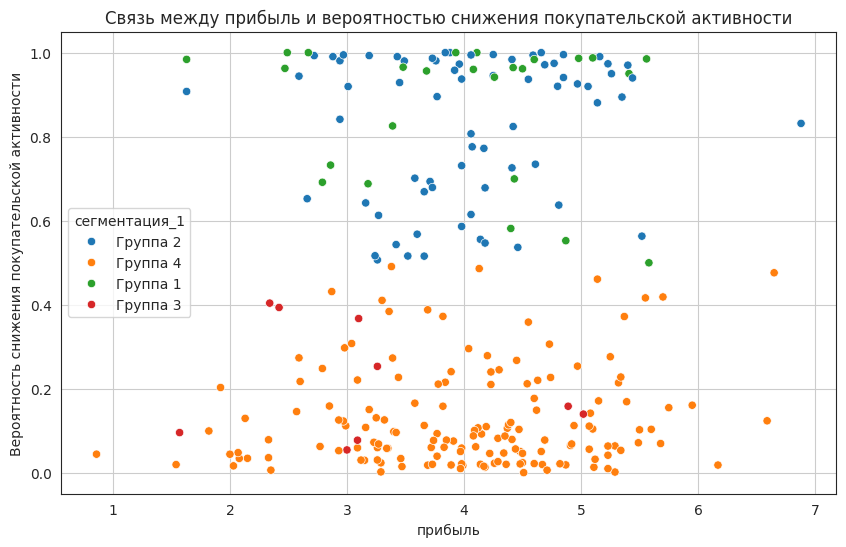

In [ ]:
for column in X_test_full.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=X_test_full, x=column, y='вероятность_снижения_покупательской_активности', hue='сегментация_1')
    plt.title(f'Связь между {column} и вероятностью снижения покупательской активности')
    plt.xlabel(column)
    plt.ylabel('Вероятность снижения покупательской активности')
    plt.grid(True)
    plt.show()

In [ ]:
def plot_pie_chart(dataframe, column, title=f'Распределение по категории: {column}'):
    """
    Строит круговую диаграмму по указанной колонке DataFrame.

    :param dataframe: pandas DataFrame
    :param column: строка - название колонки для анализа
    """
    # Подсчитываем количество каждой категории
    category_counts = dataframe[column].value_counts()

    # Настраиваем размер фигуры
    plt.figure(figsize=(10, 7))

    # Строим круговую диаграмму
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired(range(len(category_counts))))

    # Добавляем заголовок
    plt.title(title)

    # Обеспечиваем круговую форму
    plt.axis('equal')

    # Показываем график
    plt.show()

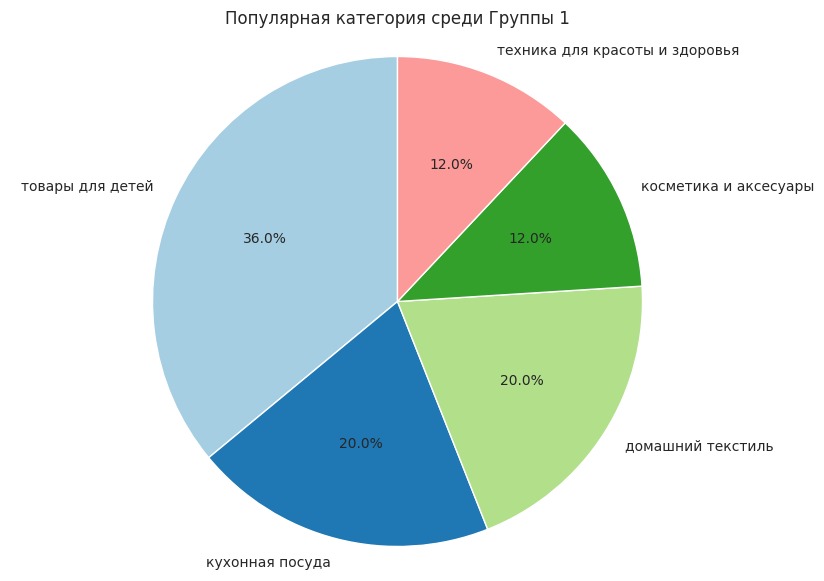

In [ ]:
plot_pie_chart(
    X_test_full.query('сегментация_1 == "Группа 1"'),
    'популярная_категория',
    'Популярная категория среди Группы 1')

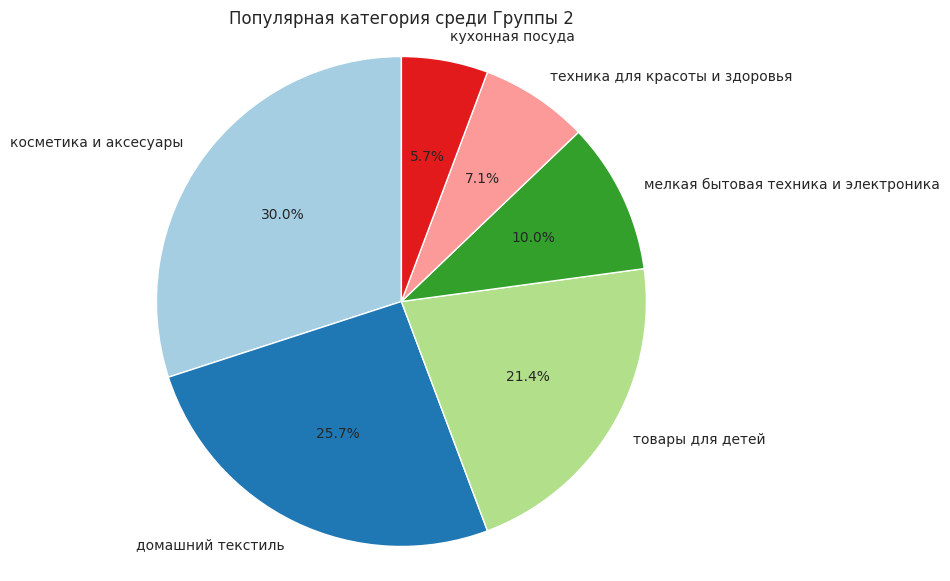

In [ ]:
plot_pie_chart(
    X_test_full.query('сегментация_1 == "Группа 2"'),
    'популярная_категория',
    'Популярная категория среди Группы 2')

**Группа 1 (повышение лояльности):**
- Несмотря на высокую вероятность снижения активности, демонстрирует рост выручки, что может быть связано с временными акциями. Однако в долгосрочной перспективе необходимо работать над удержанием клиентов.
- Рекомендуется мероприятия, направленные на повышение долгосрочной лояльности. Например, внедрить программу лояльности направленную на данную группу пользователей, предусматривающую систему бонусов за постоянные покупки, что будет стимулировать повторные транзакции.
- Самая популярная категория в этой группе: "Товары для детей" и "Домашний текстиль", следует уделить им особое внимание.

**Группа 2 (удержание интереса):**
- Группа 2 — наиболее стабильная и лояльная, что делает её приоритетной для маркетинговых стратегий.
- Рекомендуется оптимизировать процесс покупки и взаимодействия с интернет-магазином, чтобы сделать его более удобным и приятным, а также увеличить время проводимое на сайте.
- Самая популярная категория в этой группе: "Косметика и аксесуары" и "Домашний текстиль", следует уделить им особое внимание.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



👍




#### Сегментация 2: Группа клиентов, которые покупают только технику, то есть товары с длинным жизненным циклом.

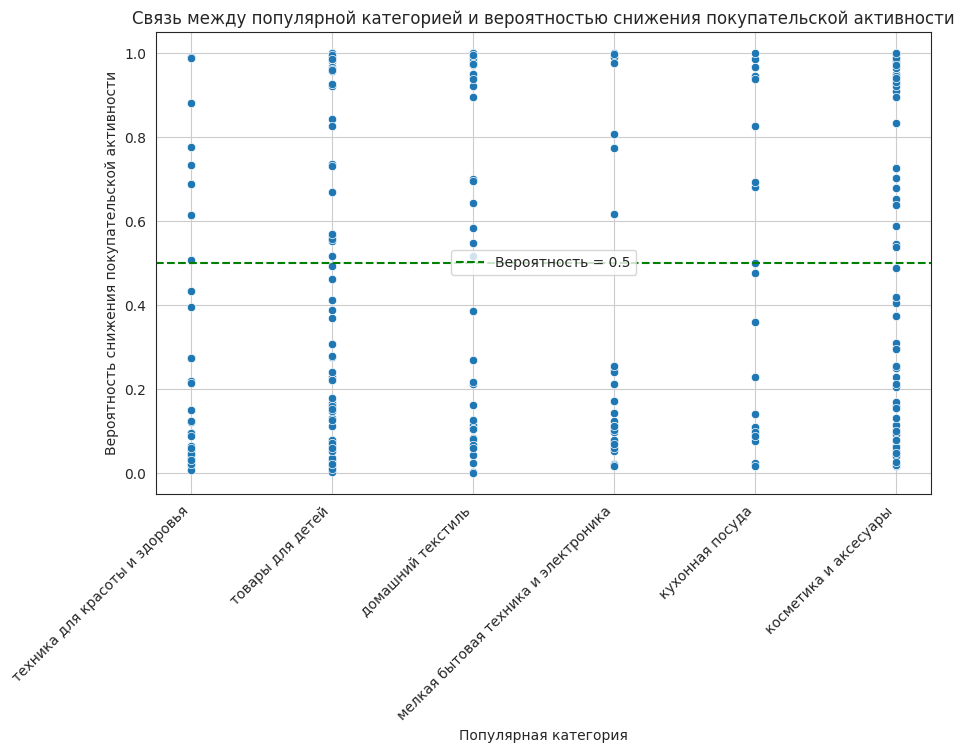

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=X_test_full, x='популярная_категория', y='вероятность_снижения_покупательской_активности')
plt.title('Связь между популярной категорией и вероятностью снижения покупательской активности')
plt.xlabel('Популярная категория')
plt.ylabel('Вероятность снижения покупательской активности')

# Добавляем горизонтальную линию
plt.axhline(y=0.5, color='green', linestyle='--', label='Вероятность = 0.5')

# Поворачиваем метки на оси X
plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.legend()
plt.show()

**Сегментация 2:**

|                                        | Высокая вероятность снижения активности | Низкая вероятность снижения активности |
|----------------------------------------|-----------------------------------------|----------------------------------------|
| **Товары с длинным жизненным циклом**  | Группа 1                                | Группа 3                               |
| **Товары с коротким жизненным циклом** | Группа 2                                | Группа 4                               |


- **Группа 1:** Высокая вероятность снижения активности, товары с длинным жизненным циклом.
- **Группа 2:** Высокая вероятность снижения активности, товары с коротким жизненным циклом.
- **Группа 3:** Низкая вероятность снижения активности, товары с длинным жизненным циклом.
- **Группа 4:** Низкая вероятность снижения активности, товары с коротким жизненным циклом.

Нас интересует Группа 1.

In [ ]:
X_test_full.head()

,id,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,...,препредыдущий_месяц_выручка,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,вероятность_снижения_покупательской_активности,предсказанная_покупательская_активность,реальная_покупательская_активность,прибыль,сегментация_1
0,215746,премиум,да,4.4,4,987,техника для красоты и здоровья,3,1,8,...,4932.0,4169.7,10,9,без_акций,0.506941,0,1,3.26,Группа 2
1,215616,стандарт,нет,4.0,5,862,товары для детей,2,7,6,...,4308.0,6055.1,10,8,без_акций,0.980116,1,1,3.49,Группа 2
2,215951,стандарт,да,5.5,3,473,домашний текстиль,6,1,3,...,4667.0,4897.8,13,18,без_акций,0.082443,0,0,4.29,Группа 4
3,216224,стандарт,да,4.3,5,446,мелкая бытовая техника и электроника,4,1,5,...,4683.0,4152.2,19,14,без_акций,0.017617,0,0,3.99,Группа 4
4,216235,премиум,нет,4.2,4,978,кухонная посуда,2,0,2,...,5176.0,4006.8,18,15,без_акций,0.106334,0,0,4.37,Группа 4


In [ ]:
def segnmentation_2(row):
    """
    Определяет группу сегментации на основе вероятности снижения покупательской активности
    и популярной категории товара.

    Параметры:
    row: объект Series (например, строка DataFrame), содержащий данные о клиенте,
         включая вероятность снижения покупательской активности и популярную категорию.

    Возвращает:
    str: Название группы ('Группа 1', 'Группа 2', 'Группа 3' или 'Группа 4').
    """

    # Проверяем, превышает ли вероятность снижения покупательской активности 0.5
    if row['вероятность_снижения_покупательской_активности'] >= 0.5:
        # Если вероятность высокая и популярная категория - мелкая бытовая техника и электроника
        if row['популярная_категория'] == 'мелкая бытовая техника и электроника':
            return 'Группа 1'  # Группа для клиентов с высокой вероятностью снижения активности и интересом к данной категории
        else:
            return 'Группа 2'  # Группа для клиентов с высокой вероятностью, но без интереса к данной категории
    else:
        # Если вероятность ниже 0.5 и популярная категория - мелкая бытовая техника и электроника
        if row['популярная_категория'] == 'мелкая бытовая техника и электроника':
            return 'Группа 3'  # Группа для клиентов с низкой вероятностью снижения активности, но с интересом к данной категории
        else:
            return 'Группа 4'  # Группа для клиентов с низкой вероятностью и без интереса к данной категории

In [ ]:
X_test_full['сегментация_2'] = X_test_full.apply(segnmentation_2, axis=1)

In [ ]:
# СОставим таблицу с финансовой статистикой по каждой группе
segment_2_stats = X_test_full.groupby('сегментация_2')[['препредыдущий_месяц_выручка',
       'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'прибыль']].mean()

In [ ]:
# Добавляем долю пользователей в результирующую таблицу
segment_2_stats['доля_пользователей'] = segment_2_stats.index.map(X_test_full['сегментация_2'].value_counts(normalize=True))

In [ ]:
segment_2_stats

,препредыдущий_месяц_выручка,предыдущий_месяц_выручка,текущий_месяц_выручка,прибыль,доля_пользователей
сегментация_2,,,,,
Группа 1,4570.142857,5065.571429,5554.00000,4.010000,0.026923
Группа 2,4639.125000,4862.159091,5205.62500,4.034318,0.338462
Группа 3,4905.347826,4925.369565,5091.93913,3.925652,0.088462
Группа 4,4939.380282,4895.443662,5171.31831,3.984577,0.546154


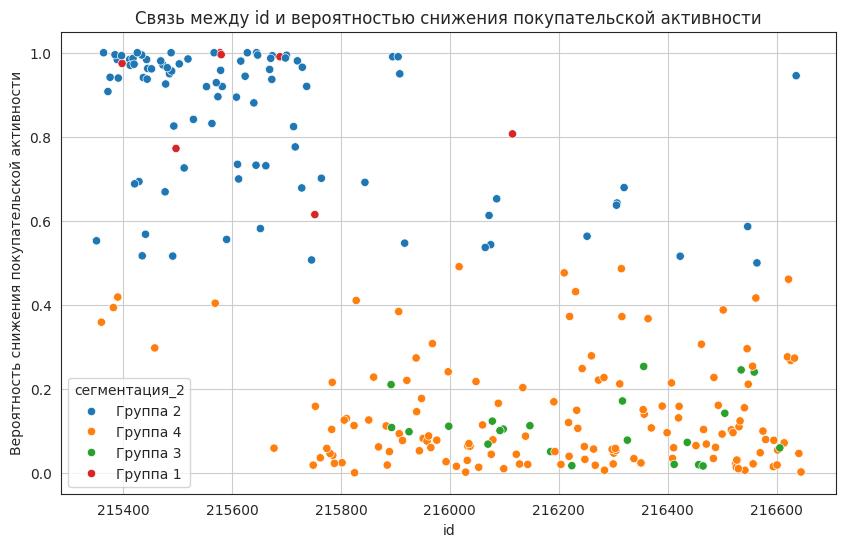

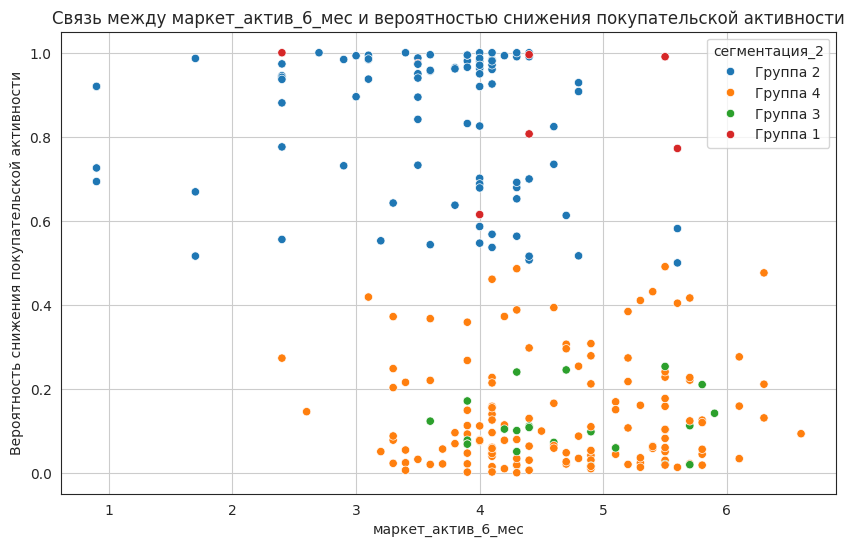

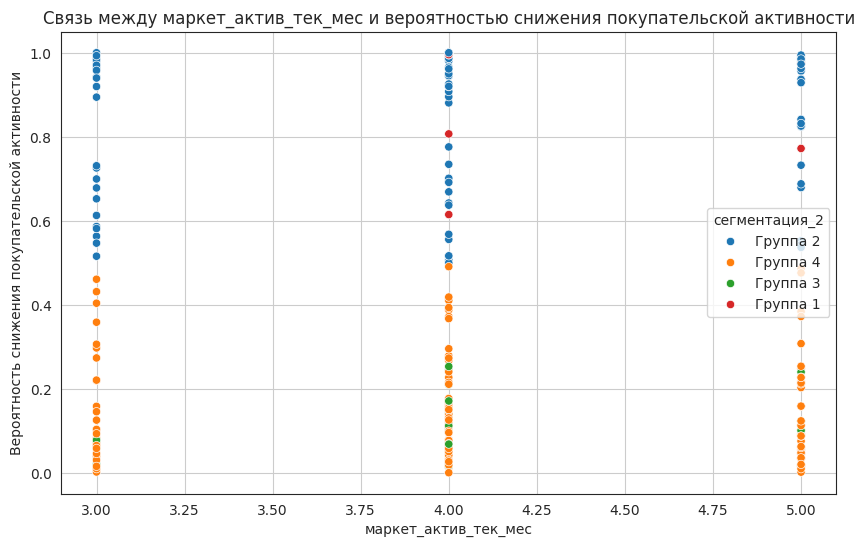

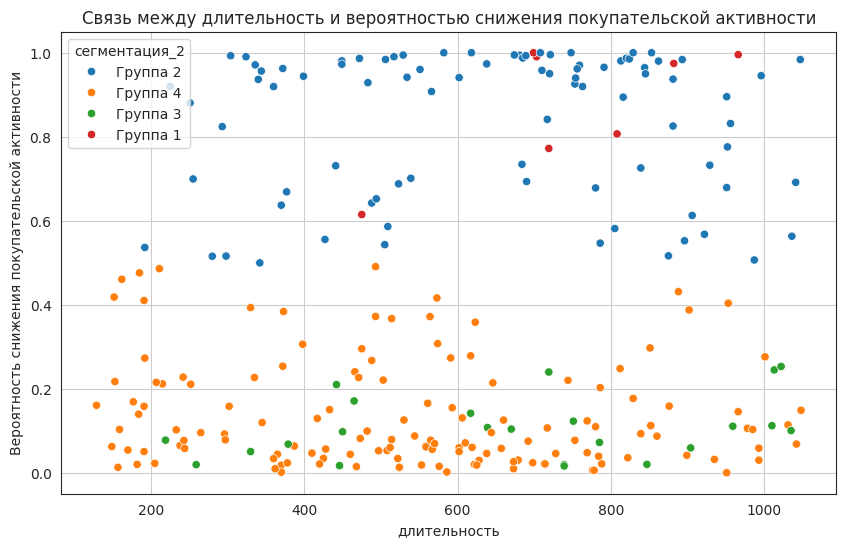

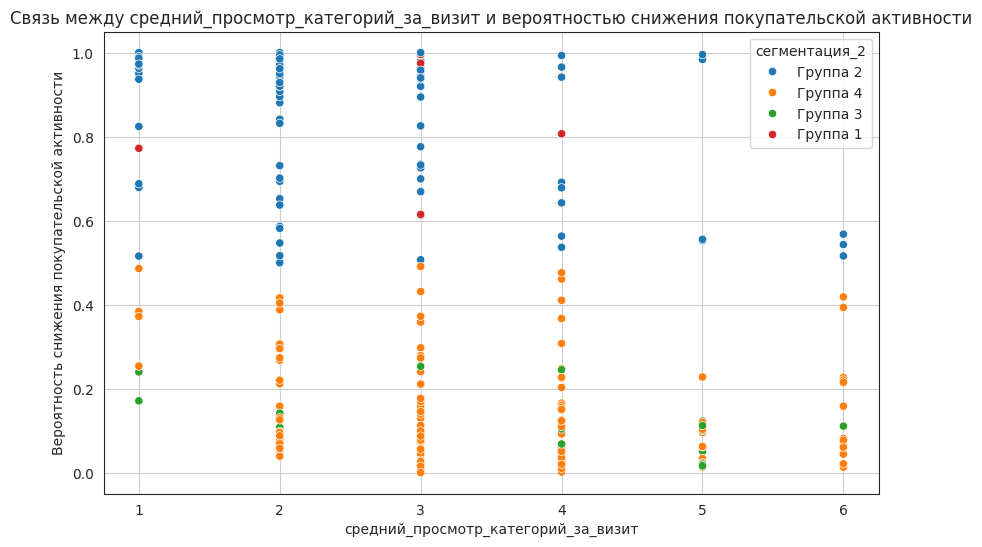

...

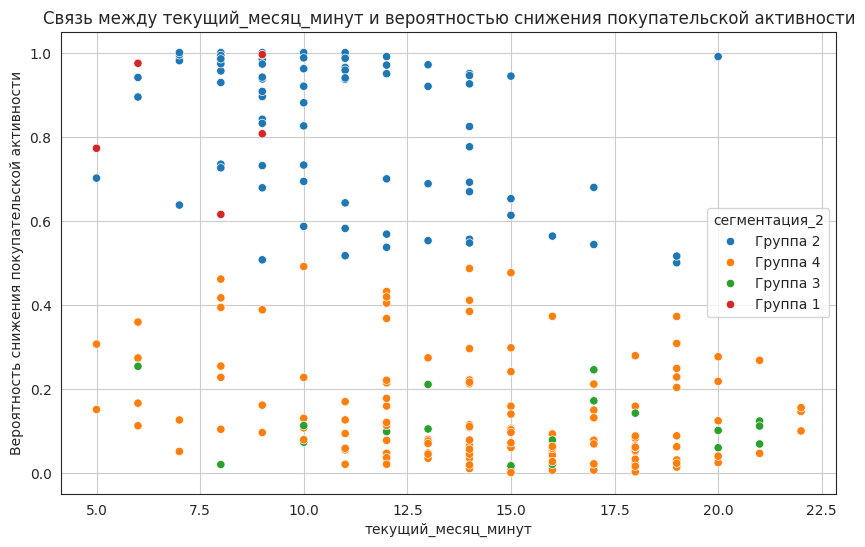

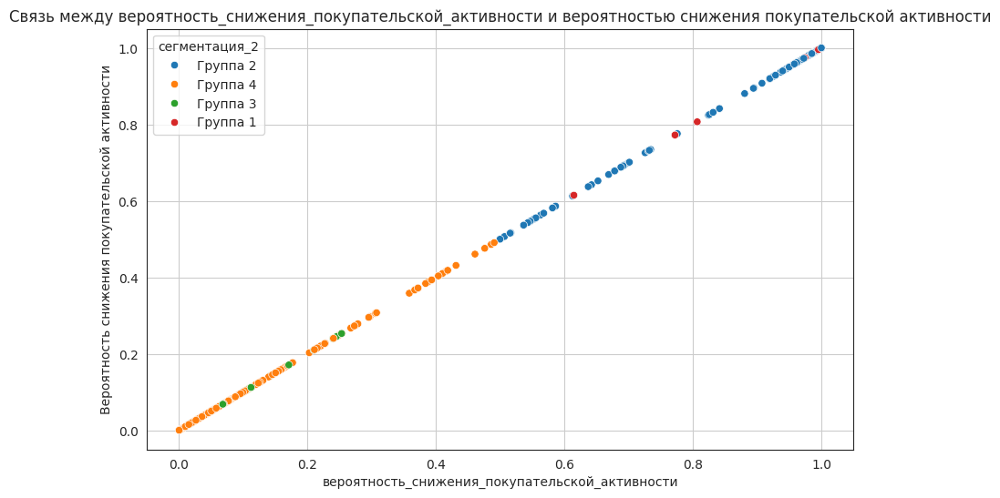

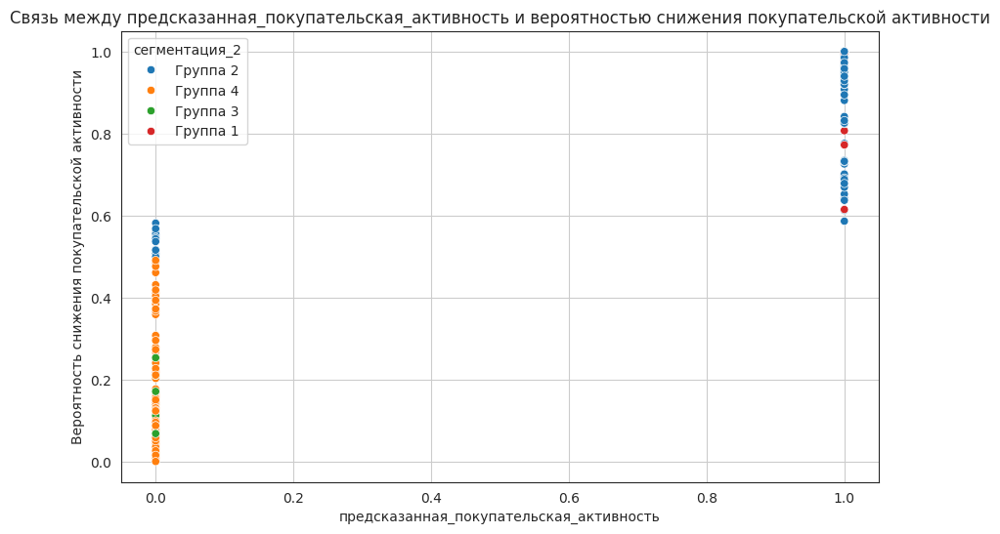

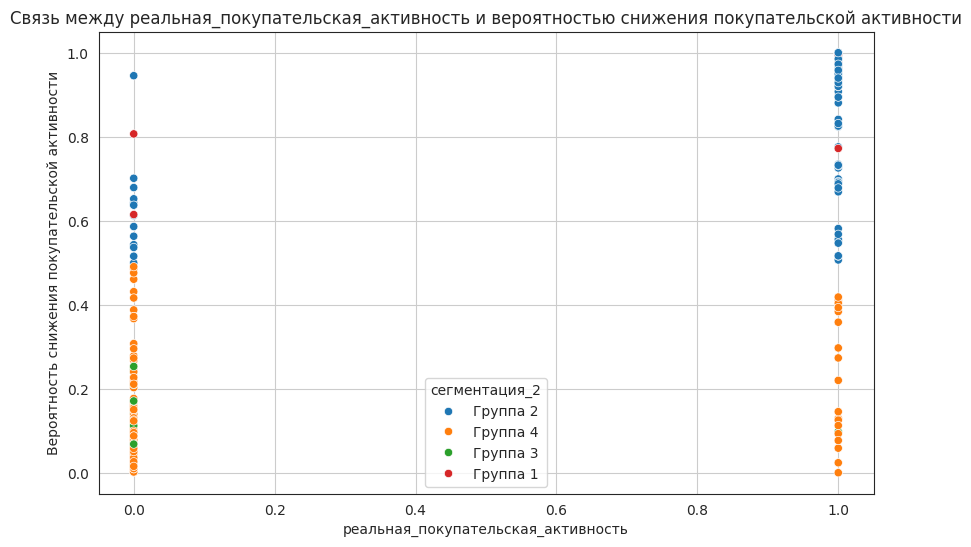

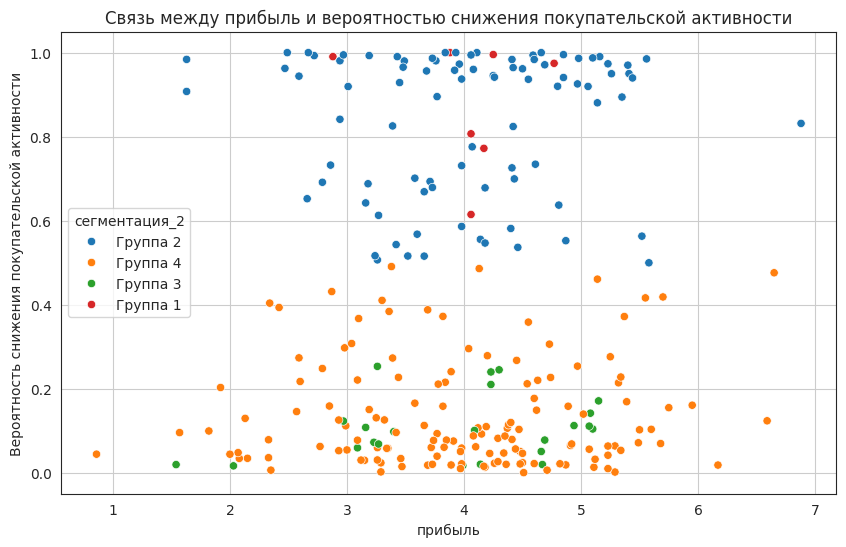

In [ ]:
for column in X_test_full.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=X_test_full, x=column, y='вероятность_снижения_покупательской_активности', hue='сегментация_2')
    plt.title(f'Связь между {column} и вероятностью снижения покупательской активности')
    plt.xlabel(column)
    plt.ylabel('Вероятность снижения покупательской активности')
    plt.grid(True)
    plt.show()

In [ ]:
X_test_full

,id,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,...,текущий_месяц_выручка,предыдущий_месяц_минут,текущий_месяц_минут,акционные_покупки_категория,вероятность_снижения_покупательской_активности,предсказанная_покупательская_активность,реальная_покупательская_активность,прибыль,сегментация_1,сегментация_2
0,215746,премиум,да,4.4,4,987,техника для красоты и здоровья,3,1,8,...,4169.7,10,9,без_акций,0.506941,0,1,3.26,Группа 2,Группа 2
1,215616,стандарт,нет,4.0,5,862,товары для детей,2,7,6,...,6055.1,10,8,без_акций,0.980116,1,1,3.49,Группа 2,Группа 2
2,215951,стандарт,да,5.5,3,473,домашний текстиль,6,1,3,...,4897.8,13,18,без_акций,0.082443,0,0,4.29,Группа 4,Группа 4
3,216224,стандарт,да,4.3,5,446,мелкая бытовая техника и электроника,4,1,5,...,4152.2,19,14,без_акций,0.017617,0,0,3.99,Группа 4,Группа 3
4,216235,премиум,нет,4.2,4,978,кухонная посуда,2,0,2,...,4006.8,18,15,без_акций,0.106334,0,0,4.37,Группа 4,Группа 4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,215391,премиум,да,3.5,3,754,косметика и аксесуары,3,1,2,...,5824.5,10,11,без_акций,0.939764,1,1,5.44,Группа 2,Группа 2
256,216065,стандарт,да,4.1,5,192,косметика и аксесуары,4,4,6,...,6122.2,14,12,без_акций,0.536757,0,0,4.46,Группа 2,Группа 2
257,216533,стандарт,нет,5.7,5,769,техника для красоты и здоровья,4,1,8,...,5180.3,15,20,без_акций,0.124051,0,0,6.59,Группа 4,Группа 4
258,216548,стандарт,нет,6.3,4,252,косметика и аксесуары,3,4,3,...,5470.1,15,17,без_акций,0.211343,0,0,3.78,Группа 4,Группа 4


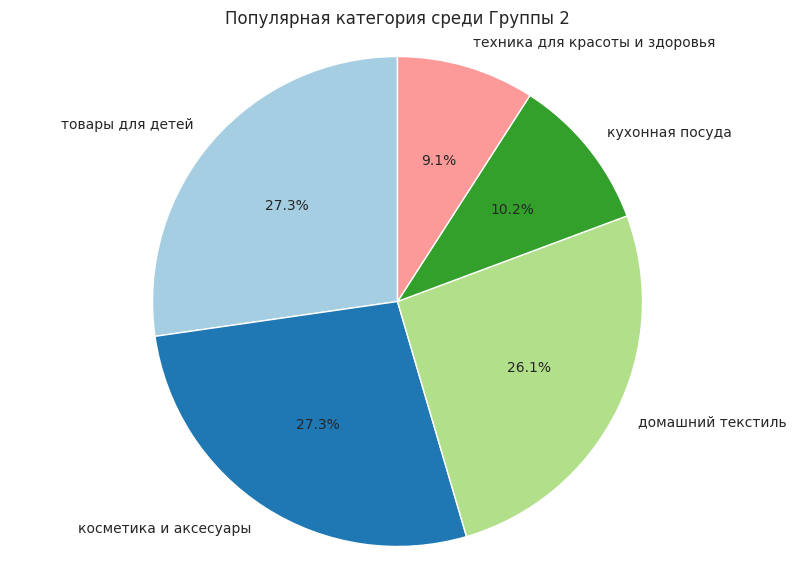

In [ ]:
plot_pie_chart(
    X_test_full.query('сегментация_2 == "Группа 2"'),
    'популярная_категория',
    'Популярная категория среди Группы 2')

Группа 1 составляет около 2% пользователей. Несмотря на то, что средняя выручка по данной категории пользователей самая большая и растет с каждым месяцем, ее прибыльность самая низкая.

Фокусироваться на удержании данной группы нецелесообразно. Лучше сосредоточиться на Группе 2, которые покупают товары с коротким жизненным циклом, но существует большая вероятность снижения их активности. Самые популярные категории "Товары для детей" и "Косметика и аксесуары".

#### Сегментация 3: Группа клиентов, которые покупают товары из категории «Товары для себя» (новая категория, которую можно выделить на основе текущих) или «Товары для детей».

**Сегментация 3:**

|                                        | Высокая вероятность снижения активности | Низкая вероятность снижения активности |
|----------------------------------------|-----------------------------------------|----------------------------------------|
| **"Товары для себя"**                  | Группа 1                                | Группа 3                               |
| **"Товары для детей"**                   | Группа 2                                | Группа 4                               |


- **Группа 1:** Высокая вероятность снижения активности, товары для себя.
- **Группа 2:** Высокая вероятность снижения активности, товары для детей.
- **Группа 3:** Низкая вероятность снижения активности, товары для себя.
- **Группа 4:** Низкая вероятность снижения активности, товары для детей.

Нас интересует Группа 1 и Группа 2.

In [ ]:
X_test_full['популярная_категория'].unique()

array(['техника для красоты и здоровья', 'товары для детей',
       'домашний текстиль', 'мелкая бытовая техника и электроника',
       'кухонная посуда', 'косметика и аксесуары'], dtype=object)

In [ ]:
def segnmentation_3(row):
    """
    Определяет группу сегментации на основе вероятности снижения покупательской активности
    и популярной категории товара.

    Параметры:
    row: объект Series (например, строка DataFrame), содержащий данные о клиенте,
         включая вероятность снижения покупательской активности и популярную категорию.

    Возвращает:
    str: Название группы ('Группа 1', 'Группа 2', 'Группа 3' или 'Группа 4').
    """

    # Проверяем, превышает ли вероятность снижения покупательской активности 0.5
    if row['вероятность_снижения_покупательской_активности'] >= 0.5:
        # Если вероятность высокая и популярная категория не 'товары для детей'
        if row['популярная_категория'] != 'товары для детей':
            return 'Группа 1'  # Группа для клиентов с высокой вероятностью снижения активности и интересом к другим категориям
        else:
            return 'Группа 2'  # Группа для клиентов с высокой вероятностью и интересом к товарам для детей
    else:
        # Если вероятность ниже 0.5 и популярная категория не 'товары для детей'
        if row['популярная_категория'] != 'товары для детей':
            return 'Группа 3'  # Группа для клиентов с низкой вероятностью снижения активности и интересом к другим категориям
        else:
            return 'Группа 4'  # Группа для клиентов с низкой вероятностью и интересом к товарам для детей

In [ ]:
X_test_full['сегментация_3'] = X_test_full.apply(segnmentation_3, axis=1)

In [ ]:
# СОставим таблицу с финансовой статистикой по каждой группе
segment_3_stats = X_test_full.groupby('сегментация_3')[['препредыдущий_месяц_выручка',
       'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'прибыль']].mean()

In [ ]:
# Добавляем долю пользователей в результирующую таблицу
segment_3_stats['доля_пользователей'] = segment_3_stats.index.map(X_test_full['сегментация_3'].value_counts(normalize=True))

In [ ]:
segment_3_stats

,препредыдущий_месяц_выручка,предыдущий_месяц_выручка,текущий_месяц_выручка,прибыль,доля_пользователей
сегментация_3,,,,,
Группа 1,4637.802817,5002.387324,5367.156338,3.984085,0.273077
Группа 2,4622.916667,4506.645833,4829.370833,4.175833,0.092308
Группа 3,4936.355932,4980.817797,5212.867797,4.025508,0.453846
Группа 4,4930.319149,4695.744681,5028.157447,3.852979,0.180769


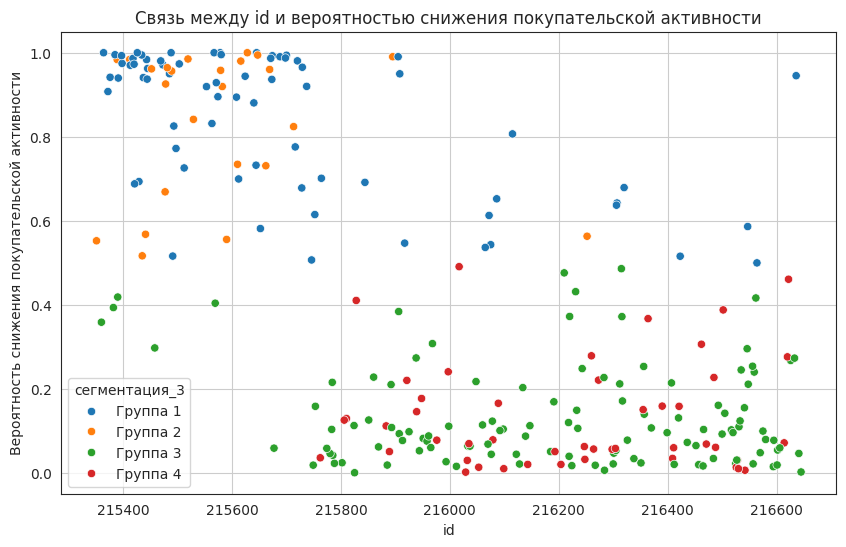

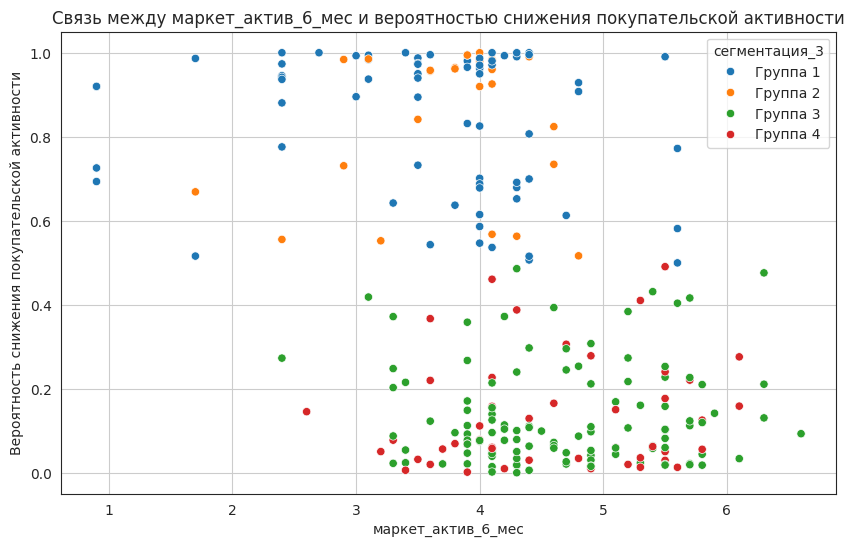

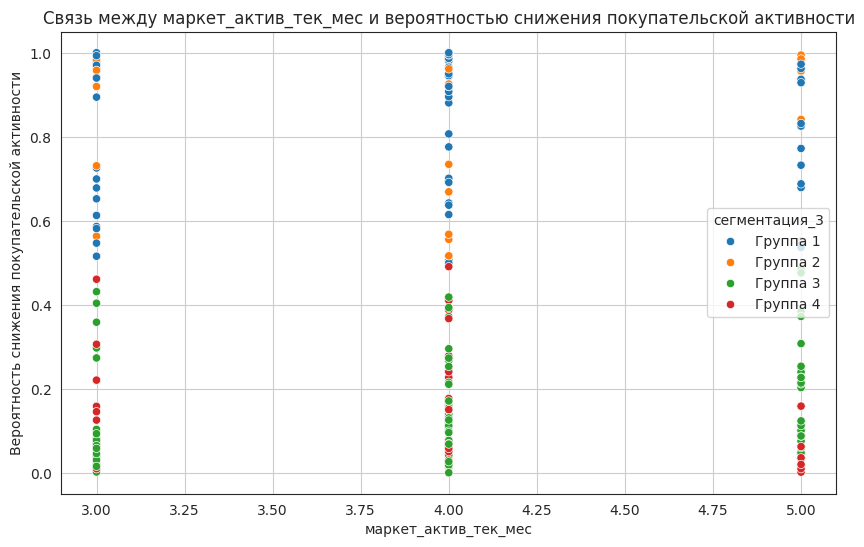

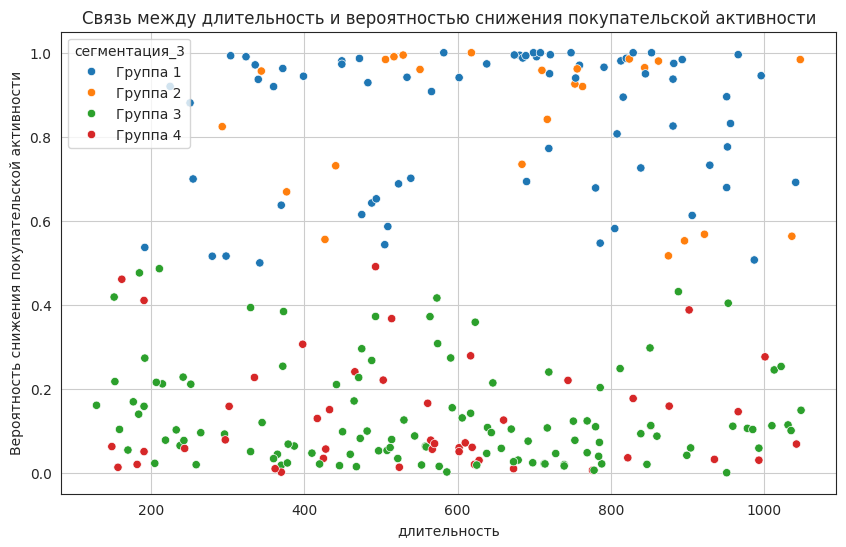

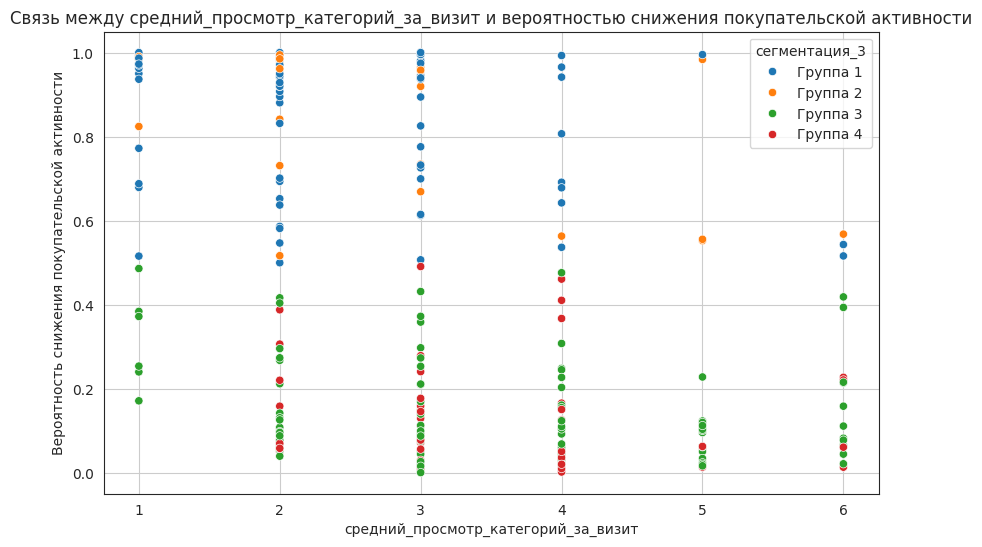

...

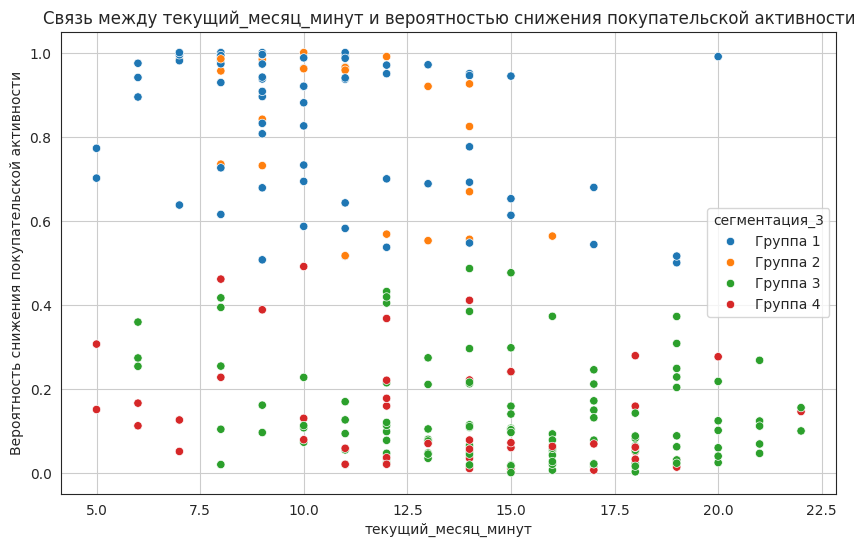

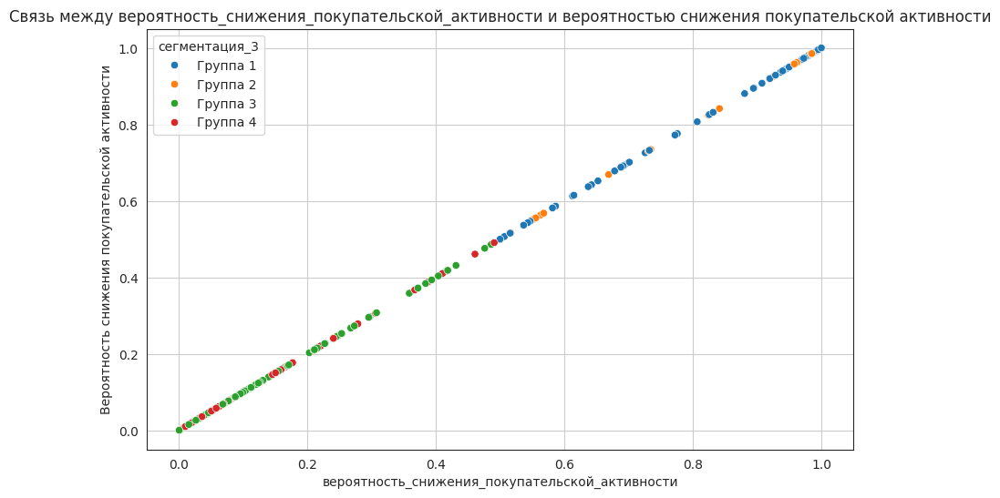

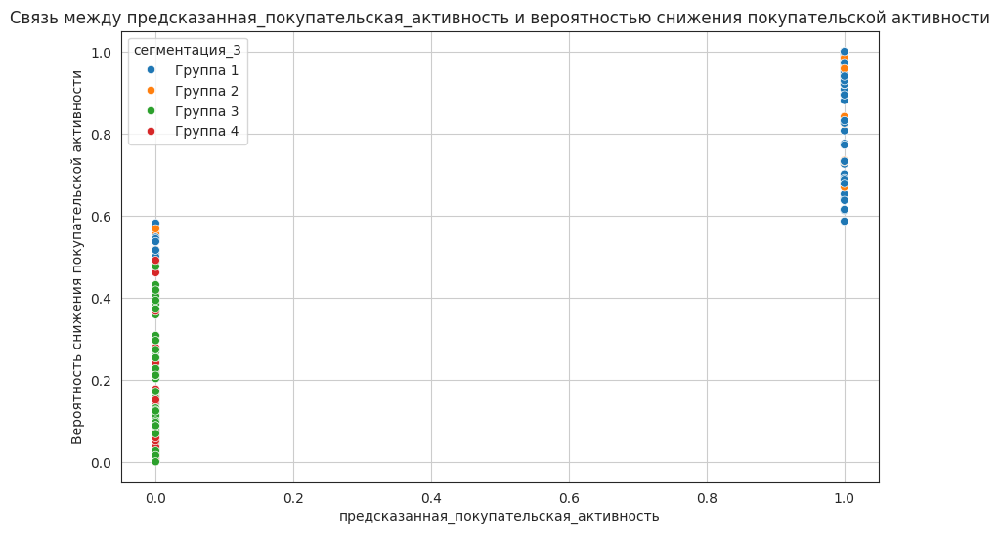

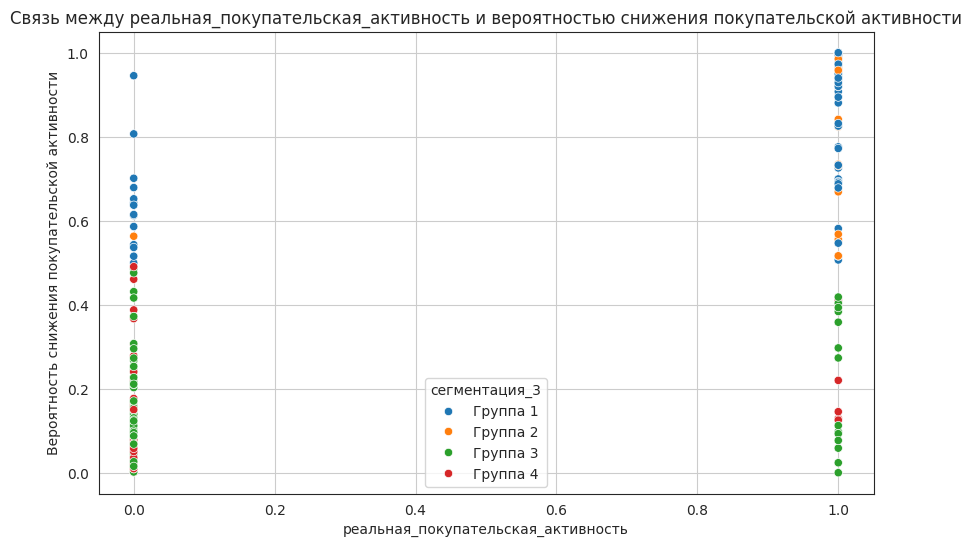

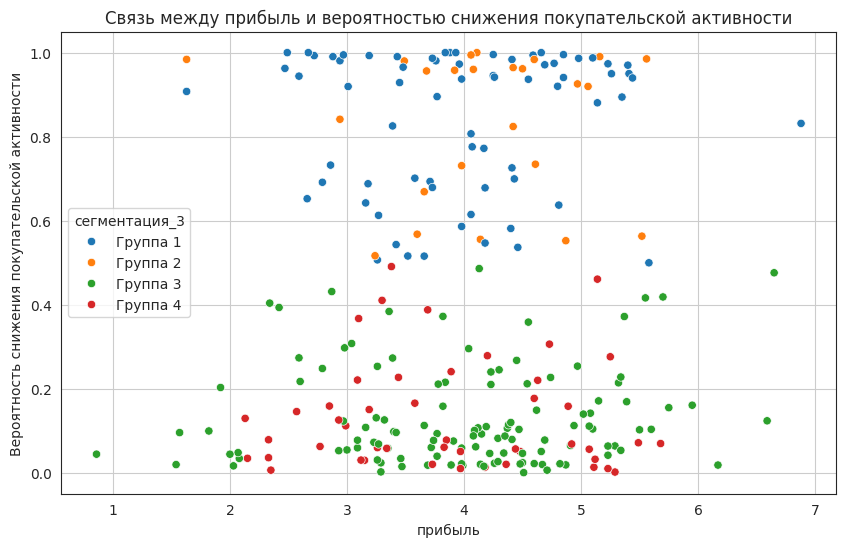

In [ ]:
for column in X_test_full.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=X_test_full, x=column, y='вероятность_снижения_покупательской_активности', hue='сегментация_3')
    plt.title(f'Связь между {column} и вероятностью снижения покупательской активности')
    plt.xlabel(column)
    plt.ylabel('Вероятность снижения покупательской активности')
    plt.grid(True)
    plt.show()

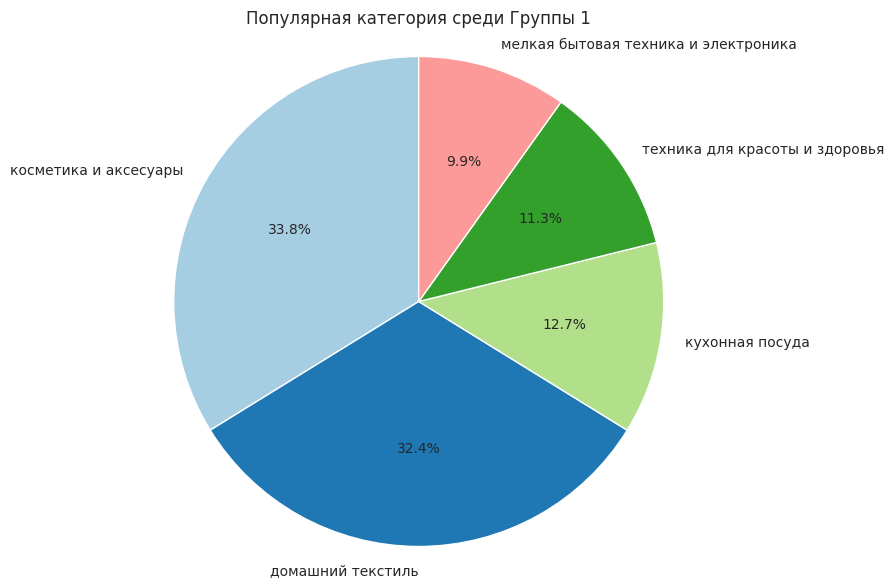

In [ ]:
plot_pie_chart(
    X_test_full.query('сегментация_3 == "Группа 1"'),
    'популярная_категория',
    'Популярная категория среди Группы 1')

"Товары для себя" покупает около 27% всех пользователей, в то время как "Товары для детей" - 9%.

При этом товары для детей хоть и приносят меньше выручки, но являюся более прибыльными. Разница в сегментах не такая большая, чтобы имело смысл фокусироваться только на одном из них.

Самая популярная категория товаров среди Группы 1 - "Косметика и аксессуары" и "Домашний текстиль".

#### Сегментация 4: Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью.

**Сегментация 4:**

|                                           | Высокая вероятность снижения активности | Низкая вероятность снижения активности |
|-------------------------------------------|-----------------------------------------|----------------------------------------|
| **Высокая прибыльность**                  | Группа 1                                | Группа 3                               |
| **Низкая прибыльность**                   | Группа 2                                | Группа 4                               |


- **Группа 1:** Высокая вероятность снижения активности, высокая прибыльность.
- **Группа 2:** Высокая вероятность снижения активности, низкая прибыльность.
- **Группа 3:** Низкая вероятность снижения активности, высокая прибыльность.
- **Группа 4:** Низкая вероятность снижения активности, низкая прибыльность.

Нас интересует Группа 1.

In [ ]:
X_test_full['прибыль'].describe()

,прибыль
count,260.000000
mean,3.996885
std,1.012584
min,0.860000
25%,3.285000
50%,4.060000
75%,4.675000
max,6.880000


К клиентом, приносящих высокую прибыль отнесем верхний квартиль.

In [ ]:
def segnmentation_4(row):
    """
    Определяет группу сегментации на основе вероятности снижения покупательской активности
    и уровня прибыли по сравнению с 75-м процентилем прибыли в тестовом наборе данных.

    Параметры:
    row: объект Series (например, строка DataFrame), содержащий данные о клиенте,
         включая вероятность снижения покупательской активности и уровень прибыли.

    Возвращает:
    str: Название группы ('Группа 1', 'Группа 2', 'Группа 3' или 'Группа 4').
    """

    # Проверяем, превышает ли вероятность снижения покупательской активности 0.5
    if row['вероятность_снижения_покупательской_активности'] >= 0.5:
        # Если вероятность высокая и прибыль выше или равна 75-му процентилю
        if row['прибыль'] >= X_test_full['прибыль'].describe()['75%']:
            return 'Группа 1'  # Группа для клиентов с высокой вероятностью снижения активности и высокой прибылью
        else:
            return 'Группа 2'  # Группа для клиентов с высокой вероятностью, но с низкой прибылью
    else:
        # Если вероятность ниже 0.5 и прибыль выше или равна 75-му процентилю
        if row['прибыль'] >= X_test_full['прибыль'].describe()['75%']:
            return 'Группа 3'  # Группа для клиентов с низкой вероятностью снижения активности и высокой прибылью
        else:
            return 'Группа 4'  # Группа для клиентов с низкой вероятностью и низкой прибылью

In [ ]:
X_test_full['сегментация_4'] = X_test_full.apply(segnmentation_4, axis=1)

In [ ]:
# СОставим таблицу с финансовой статистикой по каждой группе
segment_4_stats = X_test_full.groupby('сегментация_4')[['препредыдущий_месяц_выручка',
       'предыдущий_месяц_выручка', 'текущий_месяц_выручка', 'прибыль']].mean()

In [ ]:
# Добавляем долю пользователей в результирующую таблицу
segment_4_stats['доля_пользователей'] = segment_4_stats.index.map(X_test_full['сегментация_4'].value_counts(normalize=True))

In [ ]:
segment_4_stats

,препредыдущий_месяц_выручка,предыдущий_месяц_выручка,текущий_месяц_выручка,прибыль,доля_пользователей
сегментация_4,,,,,
Группа 1,4620.304348,4713.565217,4959.717391,5.203478,0.088462
Группа 2,4638.430556,4929.402778,5318.048611,3.658472,0.276923
Группа 3,4860.190476,4876.392857,5187.990476,5.284762,0.161538
Группа 4,4960.056911,4907.544715,5150.782114,3.529593,0.473077


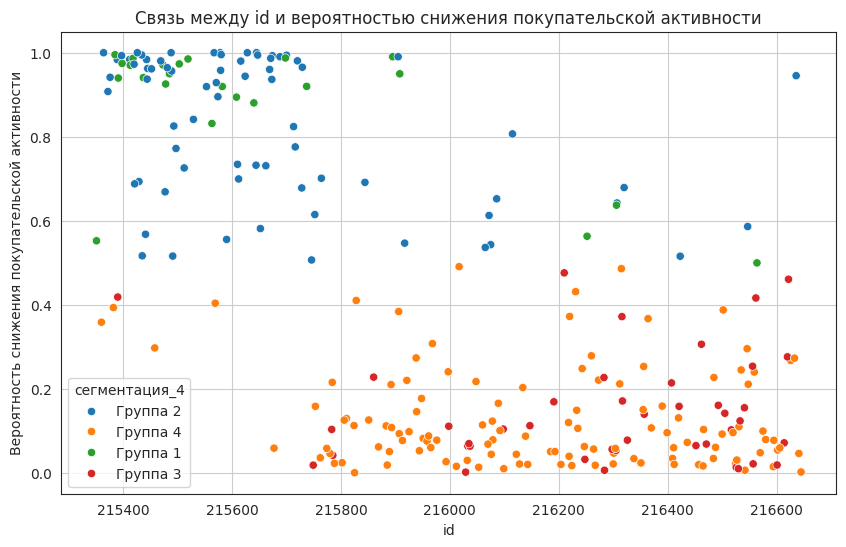

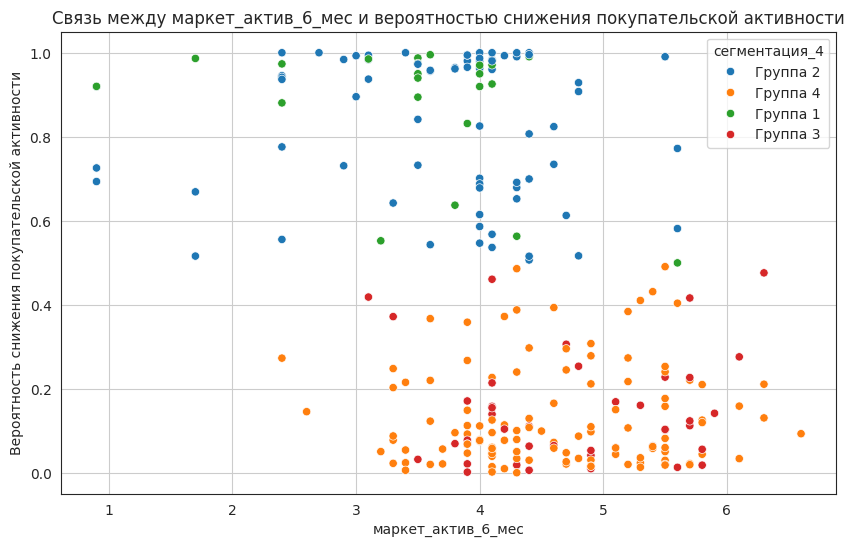

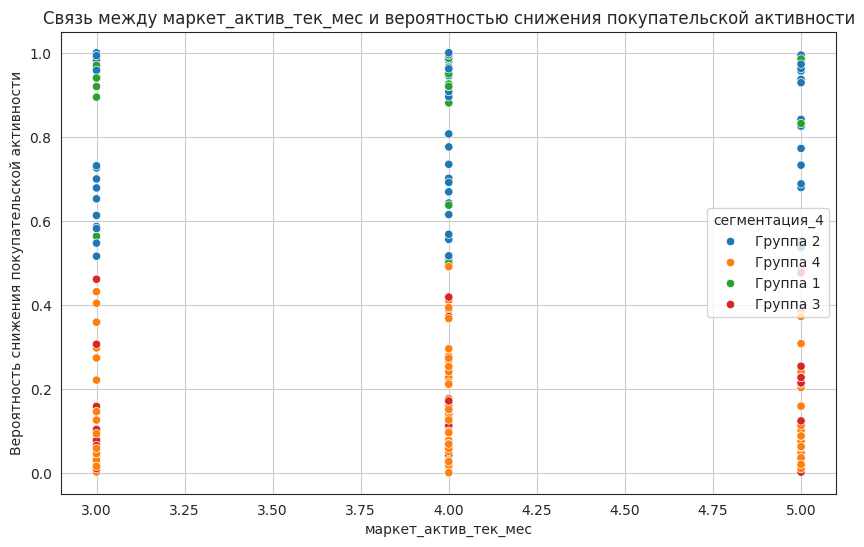

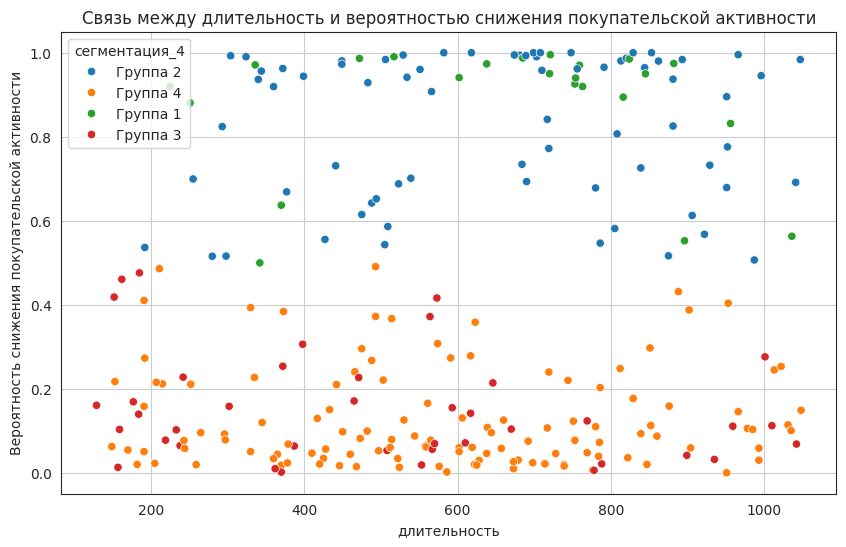

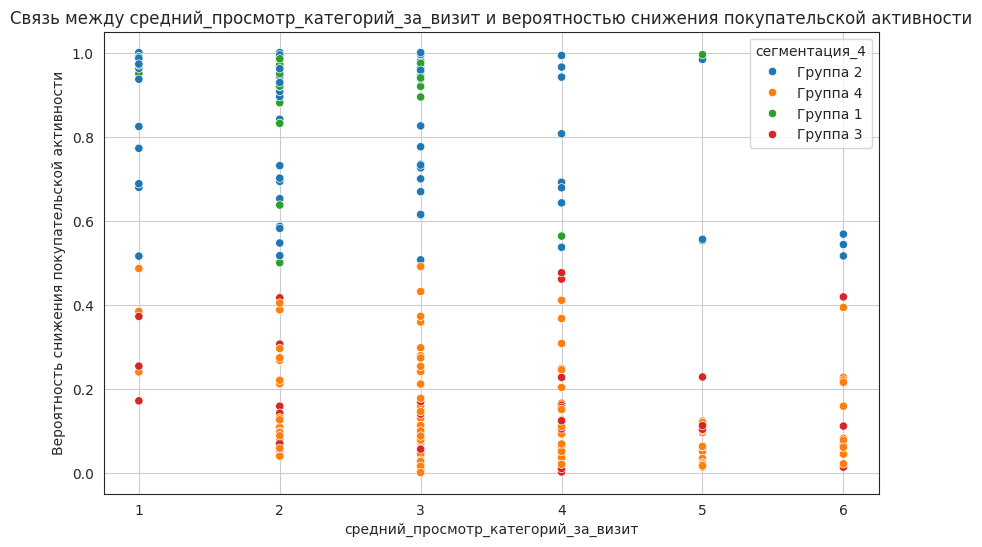

...

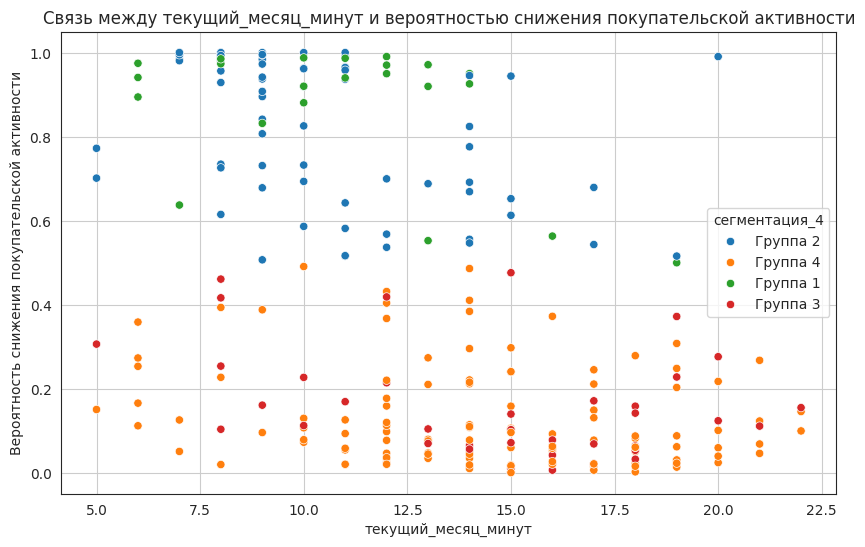

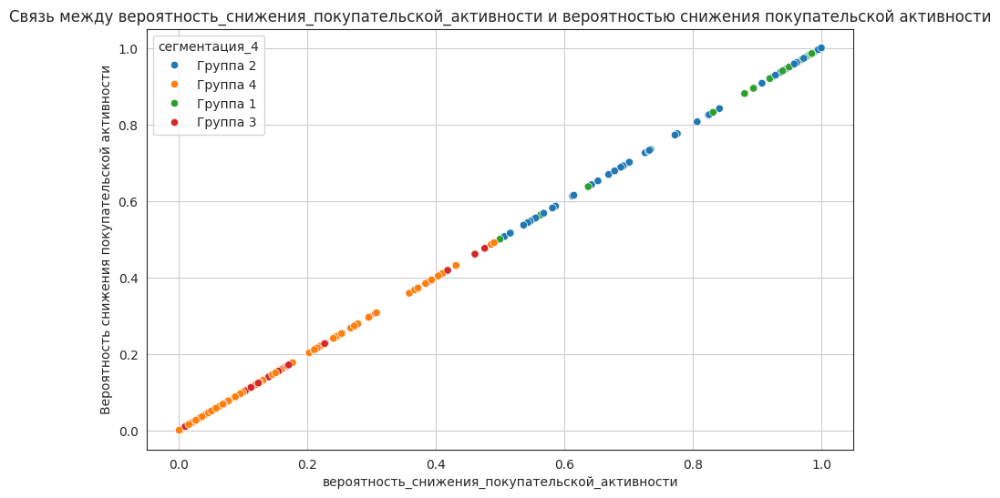

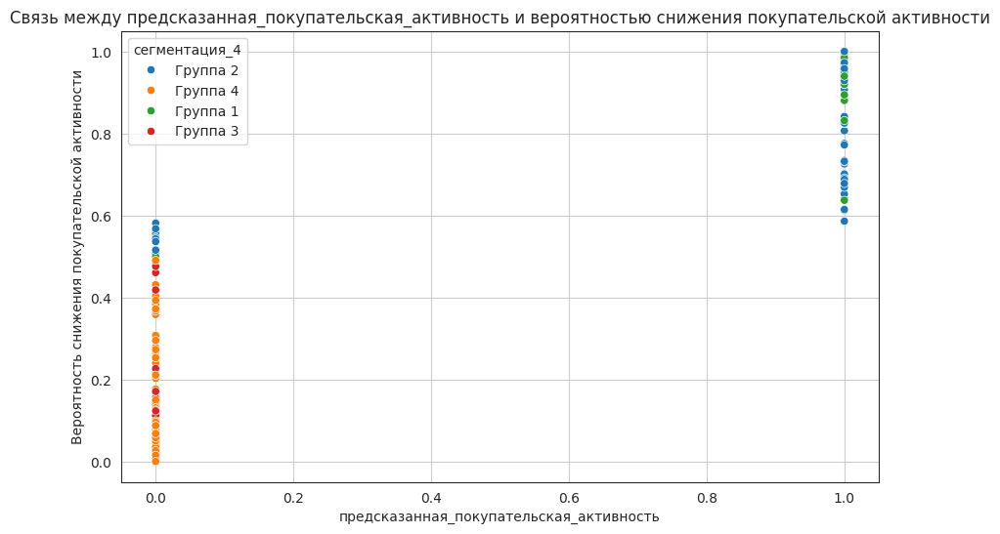

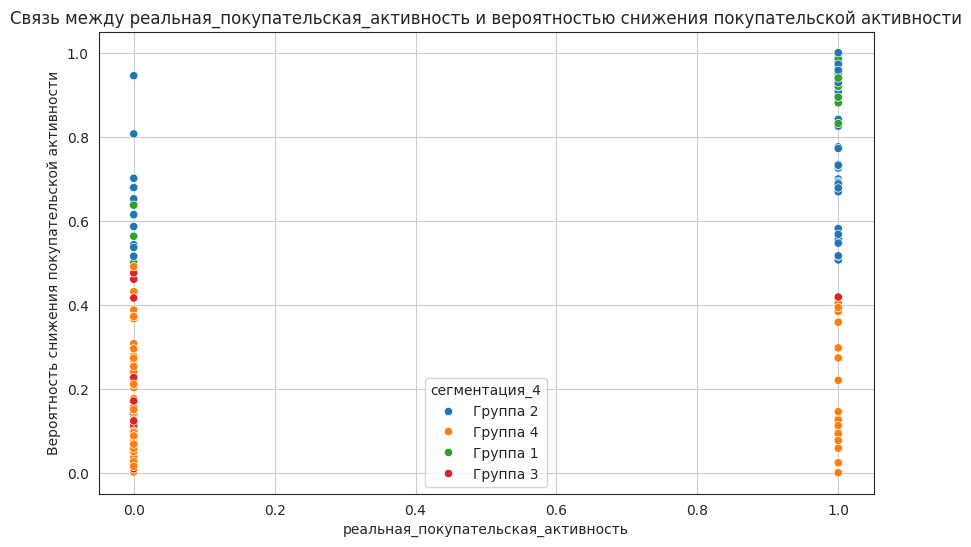

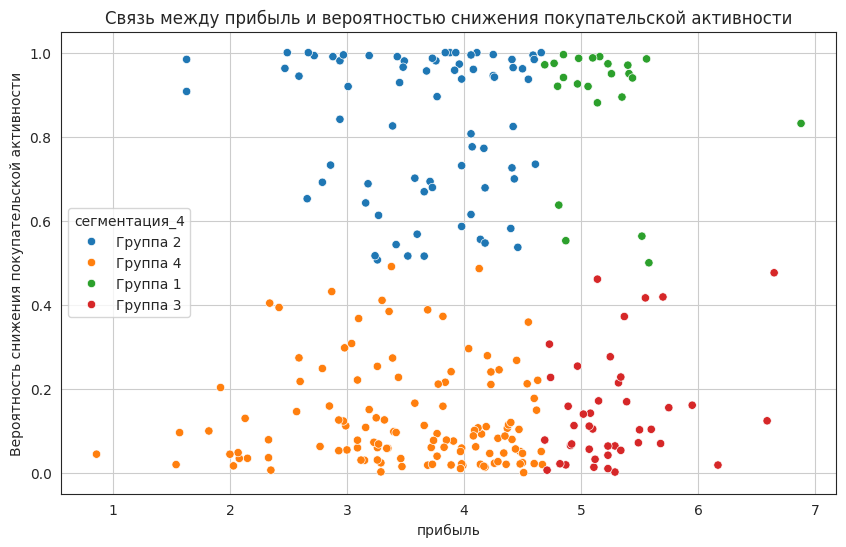

In [ ]:
for column in X_test_full.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=X_test_full, x=column, y='вероятность_снижения_покупательской_активности', hue='сегментация_4')
    plt.title(f'Связь между {column} и вероятностью снижения покупательской активности')
    plt.xlabel(column)
    plt.ylabel('Вероятность снижения покупательской активности')
    plt.grid(True)
    plt.show()

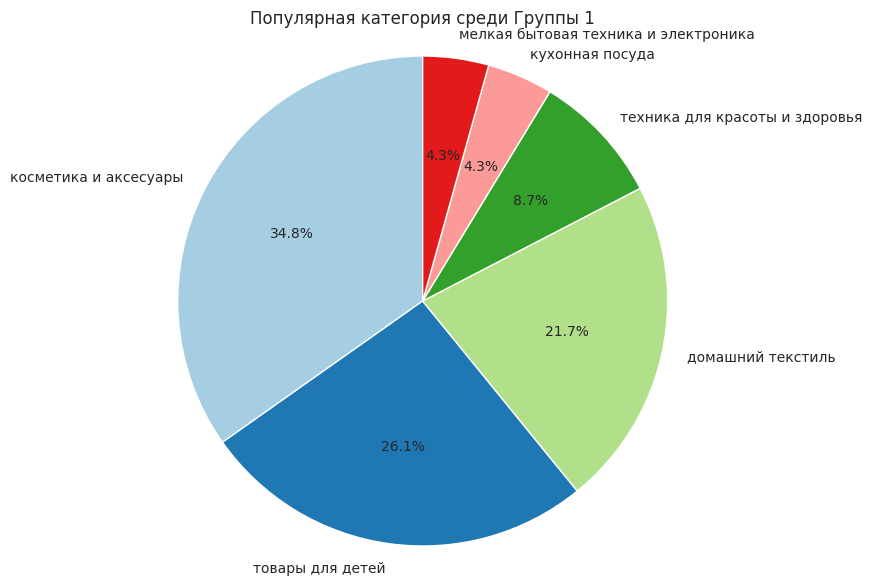

In [ ]:
plot_pie_chart(
    X_test_full.query('сегментация_4 == "Группа 1"'),
    'популярная_категория',
    'Популярная категория среди Группы 1')

Имеет смысл сосредоточиться на клиентах с высокой прибыльностью и высокой вероятностью снижения активности, т.к. эти клиенты приносят много прибыли и составляют около 10% от общего количества покупателей. Самый популярная категория "Косметика и аксесуары" и "Товары для детей".

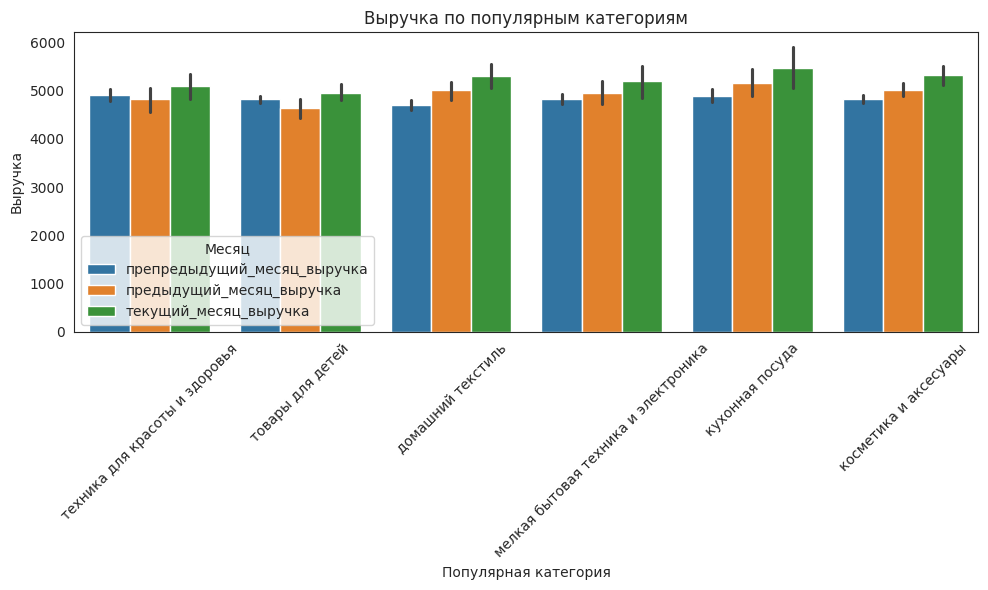

In [ ]:
# Преобразование данных для построения графика
X_test_melted = X_test_full.melt(id_vars='популярная_категория',
                                   value_vars=['препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка'],
                                   var_name='месяц', value_name='выручка')

# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(data=X_test_melted, x='популярная_категория', y='выручка', hue='месяц')

plt.title('Выручка по популярным категориям')
plt.xlabel('Популярная категория')
plt.ylabel('Выручка')
plt.legend(title='Месяц')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

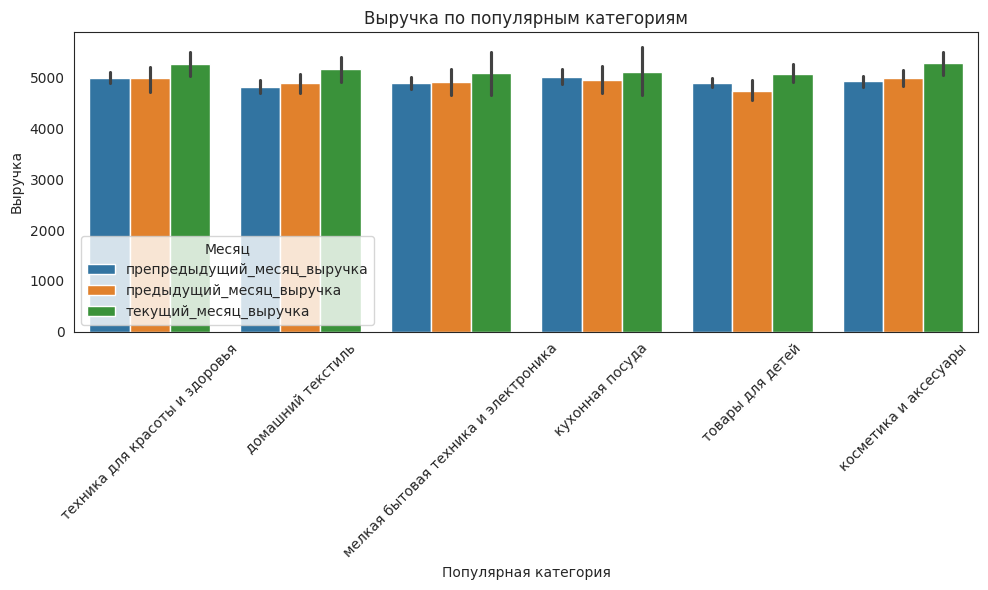

In [ ]:
# Преобразование данных для построения графика
X_test_melted_0 = (X_test_full
                   .query('предсказанная_покупательская_активность == 0')
                   .melt(
                       id_vars='популярная_категория',
                       value_vars=['препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка'],
                       var_name='месяц',
                       value_name='выручка')
                  )

# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(data=X_test_melted_0, x='популярная_категория', y='выручка', hue='месяц')

plt.title('Выручка по популярным категориям')
plt.xlabel('Популярная категория')
plt.ylabel('Выручка')
plt.legend(title='Месяц')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

У категории пользователей, по которым модель предсказала снижение активности, практически отсутствует рост по всем категориям товаров.

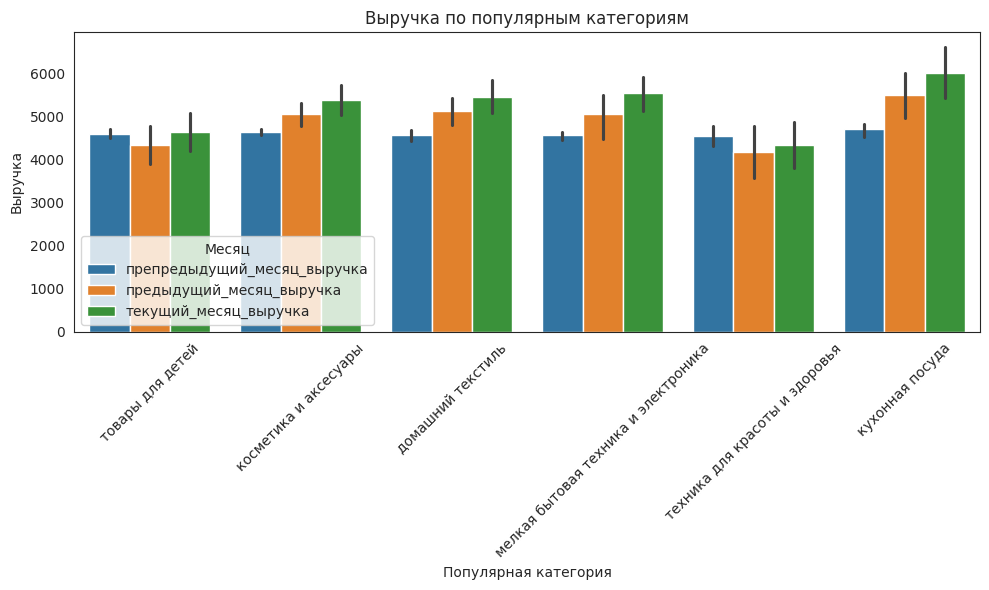

In [ ]:
# Преобразование данных для построения графика
X_test_melted_0 = X_test_full.query('предсказанная_покупательская_активность == 1').melt(id_vars='популярная_категория',
                                   value_vars=['препредыдущий_месяц_выручка', 'предыдущий_месяц_выручка', 'текущий_месяц_выручка'],
                                   var_name='месяц', value_name='выручка')

# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(data=X_test_melted_0, x='популярная_категория', y='выручка', hue='месяц')

plt.title('Выручка по популярным категориям')
plt.xlabel('Популярная категория')
plt.ylabel('Выручка')
plt.legend(title='Месяц')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

У пользователей, активность которы предположительно не изменится, наоборот, заметен ощутимый рост выручки во всех сегментах, кроме "Товары для детей" и "Товары для красоты и здоровья".

По категории "Товары для себя и здоровья" заметна просадка по выручке в последние месяцы. Рекомендуется провести маркетинговые мероприятия, для увеличения продаж по данной категории товаров.

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюера</b></font>



Успех 👍:



Логично


<div class="alert alert-warning">


Совет 🤔:


- можно было также отследить динамику выручки в разбивке по "популярной категории товара". Можно отследить посадку по одной группе товаров и на основе этого сделать дополнительные выводы
    
    
  

<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>
    
Добавил, спасибо!
   
</div>

<div class="alert alert-success">
<font size="5"><b>Комментарий ревьюераV2</b></font>



Успех 👍:



👍



#### Выводы

1. **Сегмент 1: Максимальная доля покупок по акциям и высокая вероятность снижения активности**
- Эта группа активно участвует в акциях, что приводит к росту выручки, но их долгосрочная лояльность вызывает сомнения. Они могут лишь временно реагировать на скидки.
- **Рекомендации**:
  - **Программа лояльности**: Внедрить бонусную систему, где клиенты могут зарабатывать баллы за покупки, которые затем можно использовать для получения скидок или эксклюзивных предложений.
  - **Персонализированные предложения**: Использовать данные о поведении клиентов для создания индивидуальных акций на основе их предыдущих покупок, особенно в популярных категориях, таких как "Кухонная посуда" и "Товары для детей".

2. **Сегмент 2: Высокая вероятность снижения активности, товары с длинным жизненным циклом**
- Группа составляет лишь 2% пользователей и имеет низкую прибыльность. Фокусироваться на данном сегменте не имеет смысла.

3. **Сегмент 3: Высокая вероятность снижения активности и покупают товары из категории «Товары для себя» или «Товары для детей».**
- Обе группы требуют внимания, так как они демонстрируют снижение активности, но имеют разные предпочтения в категориях товаров. Обе группы одинаково важны, выделить одну из них в качестве приоритетной не получится.

4. **Сегмент 4: Высокая вероятность снижения активности, высокая прибыльность**
- Эти клиенты приносят много прибыли и составляют около 10% от общего количества покупателей. Это позволяет сосредоточиться на их удержании.
- **Рекомендации**:
  - **Персонализированные предложения**: Предлагать специальные акции и индивидуальные предложения для Группы 1, особенно на популярные категории "Косметика и аксесуары" и "Товары для детей".
  - **Поддержка постоянного контакта**: Регулярные обновления по электронной почте и уведомления о новых поступлениях в этих категориях помогут поддерживать интерес и вовлеченность клиентов.
  
**Общие рекомендации:**

- **Повышение лояльности:** Рекомендуется проводить мероприятия, направленные на повышение долгосрочной лояльности клиентов. Например, внедрить программу лояльности направленную на группу пользователей с максимальной долей покупок по акциям и высокая вероятность снижения активности, предусматривающую систему бонусов за постоянные покупки, что будет стимулировать повторные транзакции.
- **Удержание интереса:** Рекомендуется оптимизировать процесс покупки и взаимодействия с интернет-магазином, чтобы сделать его более удобным и приятным, а также увеличить время проводимое на сайте для всех категорий пользователей.
- **Персонализированная реклама:** Рекомендуется формировать персонализированную рекламу на основе смежных категорий товаров, чтобы увеличить среднее число просмотренных категорий пользователей. Например, для "товаров с коротким жизненным циклом" и "товаров для себя".
- **Скидки:** Для клиентов с высокой прибыльностью и высокой вероятностью снижения активности предложить дополнительные скидки.

## Заключение и общие рекомендации

**Описание задачи**

Цель исследования заключалась в разработке решения для персонализации предложений постоянным клиентам интернет-магазина «В один клик», чтобы увеличить их покупательскую активность. Снижение активности клиентов потребовало поиска способов удержания постоянных покупателей через персонализированные предложения.

**Исходные данные и предобработка**

Данные для анализа были представлены в четырех CSV-файлах, содержащих информацию о поведении покупателей, выручке, времени, проведённом на сайте, и среднемесячной прибыли. Проведённая предобработка включала:

- Кодирование целевой переменной и категориальных признаков.
- Масштабирование числовых данных.
- Удаление аномальных значений, которые могли исказить результаты анализа.

**Поиск лучшей модели**

Для поиска лучшей модели были использованы различные алгоритмы, такие как KNeighborsClassifier, DecisionTreeClassifier, LogisticRegression и SVC. Для оптимизации гиперпараметров применялись методы RandomizedSearchCV, GridSearchCV и OptunaSearchCV. В результате была выбрана модель SVC с параметрами:


In [ ]:
y_valid_pred = best_model.predict(X_valid)
y_valid_proba = best_model.predict_proba(X_valid)[:, 1]
y_test_pred = best_model.predict(X_test)
y_test_proba = best_model.predict_proba(X_test)[:, 1]
print(f'Метрика ROC-AUC на кросс-валидации (тренировочная выборка): {cross_val_score(best_model, X_train, y_train, cv=5, scoring="roc_auc").mean()}')
print(f'Метрика ROC-AUC на валидационной выборке: {roc_auc_score(y_valid, y_valid_proba)}')
print(f'Метрика ROC-AUC на тренировочной выборке: {roc_auc_score(y_test, y_test_proba)}')

Метрика ROC-AUC на кросс-валидации (тренировочная выборка): 0.9150132506261286
Метрика ROC-AUC на валидационной выборке: 0.9131313131313131
Метрика ROC-AUC на тренировочной выборке: 0.9193173975782671


**Лучшая модель**

Лучшая модель для предсказания снижения активности клиентов — SVC с вышеуказанными параметрами, которая продемонстрировала высокую точность и стабильность.

**Выводы и предложения для сегментации покупателей**

1. **Максимальная доля покупок по акциям и высокая вероятность снижения активности**:
   - Рекомендации: внедрить программу лояльности и персонализированные предложения.

2. **Высокая вероятность снижения активности, товары с длинным жизненным циклом**:
   - Не имеет смысла фокусироваться на этом сегменте.

3. **Высокая вероятность снижения активности и покупают товары из категории «Товары для себя» или «Товары для детей»**:
   - Рекомендации: активное использование персонализированных предложений в популярных категориях товаров.

4. **Высокая вероятность снижения активности, высокая прибыльность**:
   - Рекомендации: регулярные обновления, специальные скидки и индивидуальные предложения.

**Общие рекомендации**

- **Повышение лояльности:** Рекомендуется проводить мероприятия, направленные на повышение долгосрочной лояльности клиентов. Например, внедрить программу лояльности направленную на группу пользователей с максимальной долей покупок по акциям и высокая вероятность снижения активности, предусматривающую систему бонусов за постоянные покупки, что будет стимулировать повторные транзакции.
- **Удержание интереса:** Рекомендуется оптимизировать процесс покупки и взаимодействия с интернет-магазином, чтобы сделать его более удобным и приятным, а также увеличить время проводимое на сайте для всех категорий пользователей.
- **Персонализированная реклама:** Рекомендуется формировать персонализированную рекламу на основе смежных категорий товаров, чтобы увеличить среднее число просмотренных категорий пользователей. Например, для "товаров с коротким жизненным циклом" и "товаров для себя".
- **Скидки:** Для клиентов с высокой прибыльностью и высокой вероятностью снижения активности предложить дополнительные скидки.


<div class="alert alert-info">
<font size="5"><b>Комментарий ревьюера</b></font>



Алексей, у тебя старательно выполненная работа, все четко, осмысленно.  



Выводы подробные, в конце разделов есть промежуточные выводы.

Данный проект не только про моделирование, а даже больше про анализ.  Тут конечно надо было проявить логику и показать рассуждение в разделе сегментация, что тебе вполне удалось.

Графики аккуратные, здорово Что используешь seaborn, subplots

    
Я оставил небольшие советы желтым, по желанию можешь воспользоваться
    
    
    
Обязательное к исправлению:




    
- нас интересуют случаи когда в любой из трёх последних месяцев покупки были не нулевыми    


- на test датасете тестируем только лучшую модель (нарушена логика использования датасетов при моделировании).  То есть ты сначала по тест выборке смотришь на результаты разных моделей и разных инструментов подбора гиперпарамтеров, а потом на ней же проводишь финальное тестирование, это называется подгонка




Жду исправлений, для принятия проекта. Если какие то вопросы, то сразу спрашивай )


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий студента</b>

Спасибо большое за ревью и полезные рекомендации! Постарался все учесть и доработать где мог. Выводы также везде обновил соответственно.
    
На счет выбора модели по тестовым выборкам я понял, что так лучше не делать. 😅 Изначально забыл, что на тренировочных данных там же кросс-валидация, а не просто оценка ROC-AUC. Поэтому в целом ее нормально использовать для оценки качества (сначала казалось, что как-то странно оценивать предсказания модели по выборке на которой она же и училась, но уже понял, что в случае с кросс-валидацией это не так).
    
Надеюсь все учел, но если нужно будет что-то поправить, то буду рад твоим комментариям!
</div>


<div class="alert alert-info">
<font size="5"><b>Комментарий ревьюераV2</b></font>

Спасибо за работу! Всё учел,  и ещё больше доработал проект который без того был очень хорошего качества.  Всегда приятно работать со студентами которые выкладываются,  используют жёлтые советы, аккуратно всё оформляют,  пишут красивый код и стремятся получить  новые знания.  

    
    
  
Отличная работа Алексей, продолжай в том же духе. Желаю успехов в дальнейшей учебе!

</div>